In [1]:
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler
from keras.preprocessing.sequence import pad_sequences
import pandas as pd
from models import *
import time
import re, io, nltk, torch 
from nltk.corpus import stopwords
from numpy import linalg as LA
from numpy.linalg import norm
from sklearn.preprocessing import normalize
from sklearn.model_selection import train_test_split
from tqdm import tqdm, trange
from sklearn.utils.class_weight import compute_class_weight
from gensim import utils, matutils  
from gensim.corpora.dictionary import Dictionary
from six import string_types, integer_types
from six.moves import zip, range
from numpy import linalg as LA
from sklearn.preprocessing import Normalizer
from scipy import stats
from gensim.utils import deprecated
from numpy import dot, float32 as REAL, memmap as np_memmap, \
    double, array, zeros, vstack, sqrt, newaxis, integer, \
    ndarray, sum as np_sum, prod, argmax
from collections import Counter
from scipy.spatial import distance
from numpy.random import binomial
from scipy.stats import bernoulli
import numpy as np


n_gpu = torch.cuda.device_count()
torch.cuda.get_device_name(0)

if torch.cuda.is_available():     
    device = torch.device("cuda")
    print('There are',torch.cuda.device_count(),'GPU(s) available.')
    print('We will use the GPU:', torch.cuda.get_device_name(0))

else:
    print('No GPU available, using the CPU instead.')
    device = torch.device("cpu")

from keras.preprocessing.sequence import pad_sequences
import matplotlib.pyplot as plt


train =pd.read_csv("../Tesis_exp/Fine-Tuning/CSV_Harassment/train_format.csv")
val=pd.read_csv("../Tesis_exp/Fine-Tuning/CSV_Harassment/val_format.csv")
test=pd.read_csv("../Tesis_exp/Fine-Tuning/CSV_Harassment/test_format.csv")

dict_cl=dict()
dict_cl[0]="NonH"
dict_cl[1]="IndirectH"
dict_cl[2]="PhysicalH"
dict_cl[3]="SexualH"

#sdqc
d_lab=dict()
d_lab["NonH"]=0
d_lab["IndirectH"]=1
d_lab["PhysicalH"]=2
d_lab["SexualH"]=3


Using TensorFlow backend.
/home/casapanshop/anaconda2/envs/newpy3_tf1/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/casapanshop/anaconda2/envs/newpy3_tf1/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/casapanshop/anaconda2/envs/newpy3_tf1/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16

There are 1 GPU(s) available.
We will use the GPU: GeForce GTX 1060 6GB


In [2]:
%autosave 60

Autosaving every 60 seconds


In [3]:
import re
from nltk.corpus import stopwords
from nltk import WordNetLemmatizer
from nltk.stem.snowball import SnowballStemmer
from nltk.stem.porter import *

stemmer_sn = SnowballStemmer("english")
stemmer = PorterStemmer()

stoplist = stopwords.words("english")
lemmatizer=WordNetLemmatizer()

emoji_pattern = re.compile("["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           "]+", flags=re.UNICODE)

def cleaner(post): 
    #re.sub(r'([a-z])\1+', r'\1', "user i think that ' s all you loooooove ")
    s= re.sub(r"http\S+", " <html> ", post)   ##########elimina http    
    s= re.sub(r'#\w+ ?', " <hashtag> ", s) ########3
    s= re.sub(r'@\w+ ?', " <user> ", s)##############    
    s= s.lower()
    s=emoji_pattern.sub(r'', s)
    s=re.sub(r"'\b", " ' ", s)
    s=re.sub(r"\b'\b", " ' ", s)
    s=re.sub(r"“\b", " “ ", s)
    #“
    s=re.sub(r"\b’", " ’ ", s)
    s=re.sub(r"‘\b", " ‘ ", s)
    s=re.sub(r"\b’\b", " ‘ ", s)
    s = re.sub(r"-", " - ", s)
    s = re.sub(r"\(", " ", s)
    s = re.sub(r"\)", " ", s)
    s = re.sub(r"\?", " ? ", s)    
    s = re.sub(r"\/", " ", s)
    s = re.sub(r"' ", " ' ", s)
    s = re.sub(r" '", " ' ", s)
    s = re.sub(r"\!", " ! ", s)
    s=re.sub("[\.]+", " . ", s)
    s=re.sub("[\,]+", " , ", s)
    s=re.sub("[\;]+", " ; ", s)
    s=re.sub("[\:]+", " : ", s)
    s=re.sub('[\"]+', ' " ', s)
    s=re.sub(r'\b[0-9]\b', " <number> ",  s)
    s=re.sub(r'\b[0-9]*[0-9]\b', " <number> ",  s)    
    s=re.sub(r'\b”', ' " ', s)
    sl= list(s.split())
    sl_2=[]
    for wd in sl:
        try: 
            q=Word2Index_valid[wd]
            sl_2.append(wd)
        except:
            try: 
                if stemmer.stem(wd) in Word2Index_valid.keys():
                    sl_2.append(stemmer.stem(wd))
                elif lemmatizer.lemmatize(wd) in Word2Index_valid.keys():
                    sl_2.append(lemmatizer.lemmatize(wd))
                else:
                    sl_2.append(wd)
            except:
                sl_2.append(wd)
    sl=sl_2
    s=' '.join([word for word in sl])# if word not in stoplist])
    return s, sl

In [4]:
embeddings_index = {}
f = open(os.path.join("glove.twitter.27B.200d.txt"))#'glove.twitter.27B.100d.txt'))
for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()

print('Se encontraron %s terminos con sus vectores de embedding.' % len(embeddings_index))

Se encontraron 1193514 terminos con sus vectores de embedding.


In [5]:
word_index=dict()
j=1
for frase in train["Tweet"].values:
    frase=cleaner(frase)[-1]
    #print (frase)
    for term in frase:
        if term not in word_index.keys():
            word_index[term]=j
            j+=1

for frase in val["Tweet"].values:
    frase=cleaner(frase)[-1]
    #print (frase)
    for term in frase:
        if term not in word_index.keys():
            word_index[term]=j
            j+=1
            
for frase in test["Tweet"].values:
    frase=cleaner(frase)[-1]
    #print (frase)
    for term in frase:
        if term not in word_index.keys():
            word_index[term]=j
            j+=1
            
len(word_index.keys())

22107

In [6]:
not_found=[]
pos_tag_nf=[]
Word2Index={}
Word2Index_valid={}
idx_2_token={}
idx_2_token_valid={}

g_dim=200
emb_matrix = np.zeros((len(word_index.keys())+1, g_dim))  

k=1
for word, i in word_index.items():
    vector = embeddings_index.get(word)
    if vector is not None:
        # words sin match en Glove, serán vectores de ceros.
        emb_matrix[i] = vector
        Word2Index[word]=i
        Word2Index_valid[word]=k
        idx_2_token_valid[k]=word
        k+=1
        idx_2_token[i]=word
        
    else:
        Word2Index[word]=i
        idx_2_token[i]=word
        not_found.append(word)
        pos_tag_nf.append(nltk.pos_tag([word])[0][-1])

In [7]:
k

14642

In [8]:
g_dim=200
glove_matrix = np.zeros((k, g_dim))

for word, i in Word2Index_valid.items():
    vector = embeddings_index.get(word)    
    glove_matrix[i] = vector
    
glove_matrix.shape

(14642, 200)

In [9]:
print ("[my_cleaner] \t#Palabras NO encontradas en vocab GLOVE:",len(not_found))
print ("[my_cleaner] \t#Palabras encontradas en vocab GLOVE:",len(word_index.keys())-len(not_found))
print ("Distribución de palabras no encontradas en POS tag:", Counter(pos_tag_nf) )

[my_cleaner] 	#Palabras NO encontradas en vocab GLOVE: 7466
[my_cleaner] 	#Palabras encontradas en vocab GLOVE: 14641
Distribución de palabras no encontradas en POS tag: Counter({'NN': 6224, 'NNS': 505, 'CD': 461, 'JJ': 87, 'VBG': 76, 'RB': 48, 'VBN': 47, 'VB': 8, 'JJS': 5, 'VBD': 2, 'WDT': 1, 'LS': 1, 'DT': 1})


In [10]:
for wd in not_found[:20]:
    print ("[",wd,"] \t\tlema:",lemmatizer.lemmatize(wd), "\tStem:",stemmer.stem(wd), "\tStem snow:", stemmer_sn.stem(wd))

[ safka ] 		lema: safka 	Stem: safka 	Stem snow: safka
[ shereiqns ] 		lema: shereiqns 	Stem: shereiqn 	Stem snow: shereiqn
[ samswey ] 		lema: samswey 	Stem: samswey 	Stem snow: samswey
[ sifill ] 		lema: sifill 	Stem: sifil 	Stem snow: sifil
[ x89 ] 		lema: x89 	Stem: x89 	Stem snow: x89
[ wrm4xo00vj ] 		lema: wrm4xo00vj 	Stem: wrm4xo00vj 	Stem snow: wrm4xo00vj
[ miliondollameat ] 		lema: miliondollameat 	Stem: miliondollameat 	Stem snow: miliondollameat
[ ella939ella ] 		lema: ella939ella 	Stem: ella939ella 	Stem snow: ella939ella
[ vickycornell ] 		lema: vickycornell 	Stem: vickycornel 	Stem snow: vickycornel
[ sp00kybitchhhh ] 		lema: sp00kybitchhhh 	Stem: sp00kybitchhhh 	Stem snow: sp00kybitchhhh
[ sarahspain ] 		lema: sarahspain 	Stem: sarahspain 	Stem snow: sarahspain
[ nadiaistoocool ] 		lema: nadiaistoocool 	Stem: nadiaistoocool 	Stem snow: nadiaistoocool
[ cervantes1127 ] 		lema: cervantes1127 	Stem: cervantes1127 	Stem snow: cervantes1127
[ shamer ] 		lema: shamer 	Stem: sh

In [11]:
#transf = Normalizer().fit(glove_matrix) 
#M_GLOVE_space=transf.transform(glove_matrix)
M_GLOVE_space= glove_matrix

def my_tokenizer(lista):
    encoded_sent=[]
    to_return_ide=[]
    for wd in lista:
        try:               
            to_return_ide.append(Word2Index_valid[wd])
            encoded_sent.append(wd)
        except: 
            continue   
           
    return to_return_ide, encoded_sent

In [12]:
def my_normalize(v):
    norm = np.linalg.norm(v)
    if norm == 0: 
        return v
    return v/norm

#el peso max es igual a la clase mas grande
def det_samples(df, dict_class, c_weights=None):
    conteos= Counter(df)
    aumentos= dict()
    maxi= max(conteos.values())
    for clase in conteos:
        if conteos[clase]==maxi:
            class_maxi=clase
            
    if c_weights is None:        # uniform class weights
        for tipo in conteos:
            actual= conteos[tipo]
            if actual<maxi:
                aumentos[tipo]=int(maxi-actual)
            else:
                aumentos[tipo]=0
        return aumentos   
    else:
        try:
            weigths=my_normalize(c_weights)
            max_wei=max(weigths)
            class_max= list(weigths).index(max_wei)
            str_class=dict_class[class_max]
            samples_max=conteos[str_class]
            
            clase=0
            for peso in weigths:
                k=dict_class[clase]
                if peso == max_wei:
                    aumentos[k]= int(samples_max-conteos[k])
                    #print ("aumentos[k]", aumentos[k], 'sampples min', samples_max, 'conteos[clase]', conteos[clase])
                else:
                    futuro=(samples_max/max_wei)*peso
                    aumentos[k]=int(futuro-conteos[k])
                    #print ("aumentos[k] para pesos no minimos ", aumentos[k], "futuro", futuro, "actual", conteos[k])
                clase+=1
            return aumentos
        except:
            print ("No se ha especificado el vector de pesos par balance de datos")
            
            
def Sort_Tuple(tup):  
    return(sorted(tup, key = lambda x: x[1]))   
  
def re_generar(muestra, tags_all, tag, prob):
    sent, indices, tags = just_tag_word(muestra, tags_all, tag)
    noise_mask = bernoulli.rvs(prob, size=sent.shape)
    bool_list=list(map(bool,noise_mask))
    to_replace=sent[bool_list]
    indix=indices[bool_list]  
    tagx=tags[bool_list] 
    idx_to_orig=len(sent)
    return  to_replace , indix, tagx, idx_to_orig

puntos='!?."()[´]“<>¡¿-/;:=_”@#.'

def just_tag_word(sentence, tags_all, tag):
    n_sentence=[]
    indices=[]
    valid=[]
    i=0
    for wd in sentence:
        if wd in puntos or wd[0]=='#':
            i+=1
            continue
        else:
            if tags_all[i] not in tag:
                i+=1
                continue
            else:
                n_sentence.append(wd)
                indices.append(i)
                valid.append(tags_all[i])
            i+=1
    return np.asarray(n_sentence), np.asarray(indices), np.asarray(valid)

def all_tag_word(sentence):    
    n_sentence=[]
    for wd in sentence:
        if wd in puntos or wd[0]=='#':
            continue
        else:
            n_sentence.append(wd)    
    return np.asarray(n_sentence), np.asarray(indices), np.asarray(valid)
    
def all_tag_word2(sentence):
    n_sentence=[]
    for wd in sentence:
        if ('unused' in token) or token.isdigit() or token[:-2].isdigit() or token in puntos or "##" in token or len(token) < 2: 
            continue
        else:
            n_sentence.append(wd)
    return np.asarray(n_sentence)
        
def check_word(token, tag, clase):
    if ('unused' in token) or token.isdigit() or token[:-2].isdigit() or token in puntos or "##" in token or len(token) < 2: 
        return False
    else:
        if nltk.pos_tag([token])[0][-1]==tag and token in vocabulary[clase]:
            return True
        else: 
            return False

def check_vocab(token, clase):
    if ('unused' in token) or token.isdigit() or token[:-2].isdigit() or  token in puntos or "##" in token or len(token) < 2: 
        return False
    else:
        if token in vocabulary[clase]:
            return True
        else: 
            return False
        
def check_tag(token, tag):
    if ('unused' in token) or token.isdigit() or token[:-2].isdigit() or token in puntos or "##" in token or len(token) < 2: 
        return False
    else:
        if nltk.pos_tag([token])[0][-1]==tag:
            return True
        else: 
            return False
        
def check_vocab(token, clase):
    if ('unused' in token) or token.isdigit() or token[:-2].isdigit() or token in puntos or "##" in token or len(token) < 2: 
        return False
    else:
        if token in vocabulary[clase]:
            return True
        else: 
            return False
            
def check_valid(lista, tags):
    keep=[]
    lista_tag= [nltk.pos_tag([wd])[0][-1] for wd in lista] 
    #print ("Tags de pos/neg:", lista_tag)
    for tag, word in list(zip(lista_tag , lista)):
        if tag in tags:
            keep.append(word)
    return keep
            
def my_most_similar_cosmul(space, M_BERT_space, bias, positive=None, negative=None, topn=1 ): #agregar space de vpcab
    if isinstance(topn, int) and topn < 1:
        return []
    if positive is None:
        positive = []
    #if negative is None:
    #    negative = []
    if isinstance(positive, str) and not negative:
        positive = [positive]
  
    ids_pos = [
        Word2Index_valid[word] if isinstance(word, string_types) else 'Tipo positivo no admitido'
        for word in positive
    ]    
    positive = [M_BERT_space[idx] for idx in ids_pos]  #space de vocab
    
    if negative is None:
        negative = []
    else: 
        #print ("\n\nSE SOLICITAN NEGATIVOS\n\n")
        ids_nega= [
            Word2Index_valid[word] if isinstance(word, string_types) else 'Tipo negativo no admitido'
            for word in negative
        ]
        negative = [M_BERT_space[idx] for idx in ids_nega] #space de vocab

    if not positive:
        raise ValueError("cannot compute similarity with no input")
    
    
    pos_dists = [((1 + dot(space, term))/2) for term in positive]
    
    #pos_dists[0]=pos_dists[0] + bias
    neg_dists = [((1 + dot(space, term))/2) for term in negative]
    dists = prod(pos_dists, axis=0) / (prod(neg_dists, axis=0) + 0.000001)
    
    if not topn:
        return dists
    best = matutils.argsort(dists, topn=topn + len(positive + negative), reverse=True)  #ordena en vocab used


    return best, dists[best] #retorna indices y distancias asociadas


def find_positive(lista, target, id_target, bias, window=4):
    to_return=[target]
    to_return=to_return*int(bias)
    positive_temp=find_window(lista, target, id_target, window=window)
    to_return+=positive_temp
    
    return to_return
                  

def find_window(lista, target, id_target, window=4):  #wind debe ser par   
    to_return=[]
    sub_w=int(window/2)
    
    if id_target >= sub_w and id_target + sub_w < len(lista):
        atras=lista[id_target-sub_w:id_target]
        adelante=lista[id_target+1:id_target+1+sub_w]
        
    elif id_target  < sub_w:
        atras=lista[:id_target]
        adelante=lista[id_target+1:id_target+sub_w+1]
        
    elif id_target + sub_w >= len(lista): 
        atras=lista[id_target-sub_w:id_target]
        adelante= lista[id_target+1:]
        
    to_return+=atras
    to_return+=adelante
    return to_return


def find_negative(target, not_sent, window=4):
    cleaned = cleaner(not_sent)[1]
    cleaned_ide, cleaned = my_tokenizer(cleaned)
    ide = cleaned.index(target)
    wind_neg=find_window(list(cleaned), target, ide, window=window)
   
    return wind_neg


def sample_neg_class(cl):
    if type(cl) != list:
        cl = [cl]
    aux = list(d_lab.keys())
    for value in cl:
        aux.remove(value)
    samp_neg = np.random.choice(aux)
    
    used_classes = cl
    used_classes.append(samp_neg)
    return samp_neg, used_classes

def check_special(lista):
    exceptions=['[CLS]', '[SEP]', '[MASK]']
    to_return=[]
    for item in lista:  #es una tupla
        if item[0] not in exceptions: 
            to_return.append(item[0])
        else:
            continue
    return to_return

def choose_replace(candidatos, ide, target):
    candidatos=check_special(candidatos)
    try:
        candidatos.remove(target)
    except:
        pass
    
    elem=np.random.choice(candidatos)
    return (elem, ide)
        

def aumentar_clase(clase, num_ejem, tags_all, prob, TOPN):
    dict_resumen=dict()
    new_sample=[]
    indx=train['Label']==clase
    print ("Consultando por la clase", clase)
    label=d_lab[clase]    
    print ("Entrega label", label)
    contador=1
    
    no_modificados=0
    modificados=0
    terms_modif=0  
    terms_supuestos=0  
    totales=0
    largos=0
    SENT_LEN=0
    TOPE_LEN=0
    
    if num_ejem>0:
        while (len(new_sample)<num_ejem):
            muestras=train['Tweet'][indx]
            tw_ids=train['tweet_id'][indx]
            for muestra in muestras:  
                if len(new_sample)<num_ejem:
                    pre_ide, pre_str = my_tokenizer(cleaner(muestra)[1])
                    #print ("pre_str", pre_str, type(pre_str), len(pre_str))
                    tags_pre= [nltk.pos_tag([wd])[0][-1] for wd in pre_str]
                    #print (tags_pre)
                    terms, indxs, tagx, tope_replace= re_generar(pre_str, tags_pre, tags_all, prob)  #terms to replace
                    terms_supuestos+=len(terms)

                    news=[]
                    TOPE_LEN+=tope_replace
                    SENT_LEN+=len(terms)
                    
                    if len(terms)>0:     
                        
                        for term, ind, tag in list(zip(terms, indxs, tagx)):                           
                            mask_words = np.asarray(d_vocab[clase]) & np.asarray(d_pos[tag])
                            mask_words = np.concatenate((np.asarray([False]), mask_words))
                            vocab_used_pos = np.arange(len(mask_words))[mask_words]
                            space= M_GLOVE_space[mask_words] #vocab de clase y tag
                            
                            if term!='user' and term!='hashtag' and term!='html':
                                not_clase, used_classes = sample_neg_class(clase) #definir clases a buscar
                                
                                valid_pos=[]
                                pos = find_positive(pre_str, term, ind, bias=1, window=4) #se puede cambiar la ventana! 
                                valid_pos=check_valid(pos, tags_all)

                                id_need = 999999999 #simbolo de que no encontró tweet
                                neg = []
                                while(id_need == 999999999):
                                    try:
                                        id_need = np.random.choice(dic_IdxI[not_clase][term]) #sample id
                                    except:
                                        if len(used_classes) == len(d_lab.keys()): 
                                            break #ya revisó todas las clases
                                        not_clase, used_classes = sample_neg_class(used_classes) # change class 

                                valid_neg=[]
                                if id_need != 999999999: #si encontró tweet
                                    not_sent = train["Tweet"][id_need]
                                    neg = find_negative(term, not_sent, window=4) 
                                    valid_neg=check_valid(neg, tags_all)

                                if len(valid_neg)<1 or len(valid_pos)<1:
                                    continue
                                    #pass

                                best, dists_best = my_most_similar_cosmul(space, M_GLOVE_space, 0.0, positive=valid_pos, negative=valid_neg, topn=TOPN)
                                #best, dists_best = my_most_similar_cosmul(space, M_BERT_space, 0.0, positive=valid_pos, negative=None, topn=TOPN)

                                todo_words = {
                                    Word2Index_valid[word] for word in valid_pos + valid_neg
                                    if not isinstance(word, ndarray) and word in Word2Index_valid
                                    }
                                result = []
                                for sim, dist_sim in list(zip(best, dists_best)):
                                    n_sim = vocab_used_pos[sim]
                                    if n_sim not in todo_words:
                                        result.append((idx_2_token_valid[n_sim], float(dist_sim)))
                                        
                                if len(result)>0:
                                    candidatos = result[:TOPN] #+2
                                else:
                                    continue

                                new = choose_replace(candidatos, ind, term)  
                                news.append(new) 
                                if tag in dict_resumen.keys():
                                    dict_resumen[tag]+=1
                                else:
                                    dict_resumen[tag]=1
                                
                        cambia=False
                        news= Sort_Tuple(news) 
                        
                        if len(news)<1:
                            no_modificados+=1
                            continue
                        else:
                            x=np.asarray(news)[:,1]
                            y=np.asarray(news)[:,0]
                            n_news=np.asarray(np.vstack((x,y))).T

                            nueva_sent=[]
                            cont_new=0
                            for i in range(len(pre_str)):
                                try:
                                    if int(n_news[cont_new][0])==i:
                                        nueva_sent.append(n_news[cont_new][1])                 
                                        cont_new+=1
                                    else: 
                                        nueva_sent.append(pre_str[i])
                                except: 
                                    nueva_sent.append(pre_str[i])
                       
                            totales+=cont_new
                            new_sample.append([contador, nueva_sent, label])
                            modificados+=1
                            terms_modif+=len(news)
                            largos+=len(pre_str)
                            contador+=1
                            
                            #"""
                            if len(new_sample)<10:
                                print ("Sentencia original:\t", pre_str)
                                print ("Sentencia final:" , label)
                                print (nueva_sent)
                                print ("")
                                #print ("")
                            #"""                              

                else:
                    count= Counter(train['Label'])   
                    for muestra, twid in list(zip(muestras,tw_ids)) :
                        pre_idx, pre_stx = my_tokenizer(cleaner(muestra)[1])
                        pre=np.asarray(pre_stx)
                        new_sample.append([twid, pre, label])
                    break
                    
    else:
        count= Counter(train['Label'])
        news= train[indx].sample(count[clase]+num_ejem)
        news_tw=news['Tweet'].values
        news_id=news['tweet_id'].values
        for muestra, twid in list(zip(news_tw, news_id)):
            pre_idx, pre_stx = my_tokenizer(cleaner(muestra)[1])
            pre=np.asarray(pre_stx)
            new_sample.append([twid, pre, label])

    try:
        print ("# terms modificados promedio", terms_modif/modificados ,"términos por sentencia")
        print ("Largo de sentencia promedio", largos/modificados ,"términos por sentencia")
        print ("para esta ejecución se debiesen reemplazar", SENT_LEN, " de" ,TOPE_LEN, "terminos")

    except: 
        print ("No se generan ejemplos")

    return new_sample, dict_resumen


def predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, name_model):
    etiq = etiq.astype("int")
    trainPredict = trained.predict(x_train, batch_size=32)
    trainPredict=[np.argmax(pred) for pred in trainPredict]
    acc= accuracy_score(etiq, trainPredict)  
    f1=f1_score(etiq, trainPredict, average=None)  # labels=np.unique(trainPredict)
    f1_ma=f1_score(etiq, trainPredict, average='macro')  # labels=np.unique(trainPredict)
    #matriz=normalize(confusion_matrix(etiq, trainPredict))
    """print ("")
    print ("Accuracy sobre Train", name_model, ":",acc)  
    print ("F1-score None sobre Train", name_model, ":",f1)
    print ("F1-score macro sobre Train", name_model, ":",f1_ma)"""
    ########################################
    trainPredict = trained.predict(x_val, batch_size=32)
    trainPredict=[np.argmax(pred) for pred in trainPredict]
    acc= accuracy_score(etiq_v, trainPredict)  
    f1=f1_score(etiq_v, trainPredict, average=None)  # labels=np.unique(trainPredict)
    f1_ma=f1_score(etiq_v, trainPredict, average='macro')  # labels=np.unique(trainPredict)
    #matriz=normalize(confusion_matrix(etiq_v, trainPredict))
    """print ("")
    print ("Accuracy sobre Val", name_model, ":",acc)  
    print ("F1-score None sobre Val", name_model, ":",f1)
    print ("F1-score macro sobre Val", name_model, ":",f1_ma)"""
    ########################################
    trainPredict = trained.predict(x_test, batch_size=32)
    trainPredict=[np.argmax(pred) for pred in trainPredict]
    acc_t= accuracy_score(etiq_t, trainPredict)  
    f1_t=f1_score(etiq_t, trainPredict, average=None)  # labels=np.unique(trainPredict)
    f1_ma_t=f1_score(etiq_t, trainPredict, average='macro')  # labels=np.unique(trainPredict)
    matriz_t=normalize(confusion_matrix(etiq_t, trainPredict))
    print ("")
    print ("Accuracy sobre Test", name_model, ":",acc_t)  
    print ("F1-score None sobre Test", name_model, ":",f1_t)
    print ("F1-score macro sobre Test", name_model, ":",f1_ma_t)
    
    return f1_ma_t, f1_t, acc_t, matriz_t

In [13]:
tr_s=train.loc[train['Label']=='NonH']
tr_d=train.loc[train['Label']=='IndirectH']
tr_q=train.loc[train['Label']=='PhysicalH']
tr_c=train.loc[train['Label']=='SexualH']

keys=['NonH', 'IndirectH', 'PhysicalH', 'SexualH']

dict_vocab={}
for key in keys: 
    tr_k=train.loc[train['Label']==key]
    tr_k=tr_k['Tweet'].values    
    trs_k=[]
    for tw in tr_k:
        encoded = cleaner(tw)[1]
        apen=[]
        for wd in encoded:
            try: 
                h=Word2Index_valid[wd]
                apen.append(wd)
            except: 
                continue
        
        #trs_k+=list(set(encoded))
        trs_k+=apen
    dict_vocab[key]=list(set(trs_k ))
    print ("#terms ",key,":",len(dict_vocab[key]))
      


#terms  NonH : 8483
#terms  IndirectH : 421
#terms  PhysicalH : 577
#terms  SexualH : 5394


In [14]:
vocabulary=dict_vocab
dic_IdxI = {value: {} for value in d_lab.keys()}
for i, (muestra, label) in enumerate(list(zip(train['Tweet'],train['Label']))):
    pre=np.asarray(cleaner(muestra)[1])
    for token in pre:
        if token not in dic_IdxI[label]:
            dic_IdxI[label][token] = [i]
        else:
            dic_IdxI[label][token].append(i)

In [15]:
idx_2_token_valid

{1: 'pics',
 2: 'mexican',
 3: 'school',
 4: 'girl',
 5: 'naked',
 6: 'melanie',
 7: 'fake',
 8: 'nude',
 9: 'photos',
 10: 'hardcore',
 11: 'slut',
 12: 'movies',
 13: 'alicia',
 14: 'moore',
 15: 'porn',
 16: 'star',
 17: 'toon',
 18: 'love',
 19: 'rt',
 20: 'having',
 21: 'curly',
 22: 'hair',
 23: 'is',
 24: 'a',
 25: 'gotdamn',
 26: 'chore',
 27: 'do',
 28: 'not',
 29: 'let',
 30: 'the',
 31: 'internets',
 32: 'fool',
 33: 'you',
 34: 'ok',
 35: 'breakingnews',
 36: '<number>',
 37: 'unexplained',
 38: 'prisoners',
 39: 'deaths',
 40: 'murder',
 41: 'amp',
 42: 'attempted',
 43: 'suicides',
 44: 'shacking',
 45: 'ldf',
 46: 'dirty',
 47: 'quarterback',
 48: 'latino',
 49: 'pokemon',
 50: 'young',
 51: 'handjob',
 52: 'kissing',
 53: 'gangbang',
 54: 'w',
 55: 't',
 56: 'co',
 57: 'sexting',
 58: 'n',
 59: 'ngirl',
 60: 'daddy',
 61: 'nme',
 62: 'listen',
 63: 'bitch',
 64: 'gonna',
 65: 'watch',
 66: 'these',
 67: 'what',
 68: 'grieving',
 69: 'chris',
 70: 'dead',
 71: 'she',
 72

In [15]:
tags=['NN','NNS', 'JJ', 'JJR', 'JJS', 'VB', 'VBD', 'VBG', 'VBN', 'VBP', 'VBZ']
clases=['NonH', 'IndirectH', 'PhysicalH', 'SexualH']

In [17]:
len(idx_2_token_valid)

14641

In [16]:
d_pos= dict()
for tag in tags:
    d_pos[tag]= [check_tag(k, tag) for k in idx_2_token_valid.values()]
    
d_vocab=dict()
for clase in clases:
    d_vocab[clase]= [check_vocab(k, clase) for k in idx_2_token_valid.values()]

## Armar Train-Val-Test

In [17]:
ids_train=train['tweet_id']
tws_train=train['Tweet']
labels_train=[d_lab[lb] for lb in train['Label']]
#class_weights= compute_class_weight('balanced', np.unique(labels_train), labels_train)
class_weights= [1.0, 1.0, 1.0, 1.0]
class_weights=np.asarray(class_weights)
print ("Pesos de clases:", class_weights)
#print ("Pesos de clases:", class_weights)

etiq=labels_train.copy()
etiq=np.asarray(etiq)
sentences = tws_train
n_labels = np.array(etiq)
y_train=to_categorical(n_labels,num_classes=4)


input_ids=[]
for sent in sentences:
    encoded_sent, sent_valid = my_tokenizer(cleaner(sent)[1])  
    input_ids.append(encoded_sent) 
    

Pesos de clases: [1. 1. 1. 1.]


In [20]:
max(map(len,input_ids))

33

In [18]:
MAX_LEN=33

In [19]:
input_ids = pad_sequences(input_ids,maxlen=MAX_LEN,dtype="long",value=0, truncating="post", padding="post")
shape=np.asarray(input_ids).shape
x_train=np.zeros((shape[0], shape[1], 200))
j=0
for in_id in input_ids:
    x_train[j]=M_GLOVE_space[in_id]
    j+=1

In [20]:
ids_val=val['tweet_id']
tws_val=val['Tweet']
labels_val=[d_lab[lb] for lb in val['Label']]

etiq_v=labels_val.copy()
etiq_v=np.asarray(etiq_v)
sentences_val = tws_val
n_labels_val = np.array(etiq_v)
y_val=to_categorical(n_labels_val,num_classes=4)

input_ids_val=[]
for sent in sentences_val:
    encoded_sent, sent_valid =my_tokenizer(cleaner(sent)[1])  
    input_ids_val.append(encoded_sent)

ids_test=test['tweet_id']
tws_test=test['Tweet']
labels_test=[d_lab[lb] for lb in test['Label']]

etiq_t=labels_test.copy()
etiq_t=np.asarray(etiq_t)
sentences_test = tws_test
n_labels_test = np.array(etiq_t)
y_test=to_categorical(n_labels_test,num_classes=4)

input_ids_test=[]
for sent in sentences_test:
    encoded_sent, sent_valid = my_tokenizer(cleaner(sent)[1])
    input_ids_test.append(encoded_sent)
    
input_ids_val = pad_sequences(input_ids_val,maxlen=MAX_LEN,dtype="long",value=0, truncating="post", padding="post")
input_ids_test = pad_sequences(input_ids_test,maxlen=MAX_LEN,dtype="long",value=0, truncating="post", padding="post")


shape_val=np.asarray(input_ids_val).shape
x_val=np.zeros((shape_val[0], shape_val[1], 200))
i=0
for in_id in input_ids_val:
    x_val[i]=M_GLOVE_space[in_id]
    i+=1
    
shape_test=np.asarray(input_ids_test).shape
x_test=np.zeros((shape_test[0], shape_test[1], 200))
i=0
for in_id in input_ids_test:
    x_test[i]=M_GLOVE_space[in_id]
    i+=1

x_test.shape

(2123, 33, 200)

In [21]:
x_test.shape

(2123, 33, 200)

## Glove sin aum_ sin pesos


Entrenando exec  1 






Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


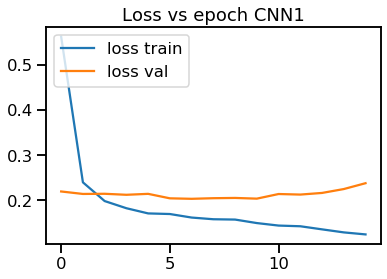

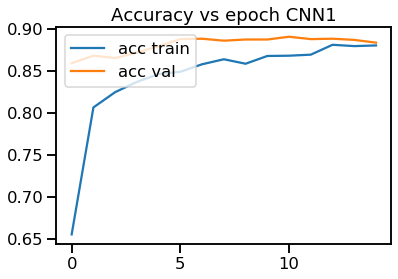


Accuracy sobre Test cnn1 : 0.8553933113518606
F1-score None sobre Test cnn1 : [0.91640333 0.         0.         0.75814751]
F1-score macro sobre Test cnn1 : 0.418637711310062


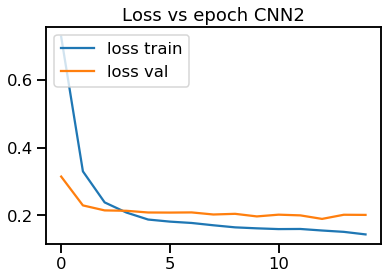

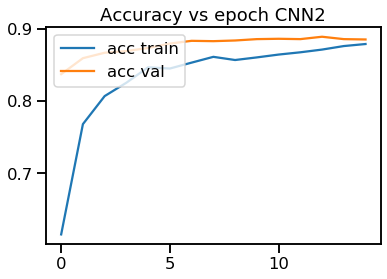


Accuracy sobre Test cnn2 : 0.8502119642016015
F1-score None sobre Test cnn2 : [0.91444921 0.         0.         0.72759227]
F1-score macro sobre Test cnn2 : 0.4105103700742462


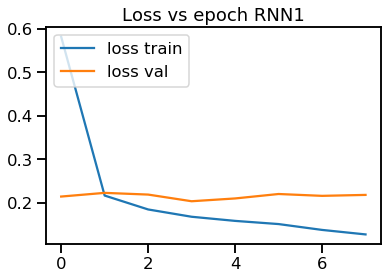

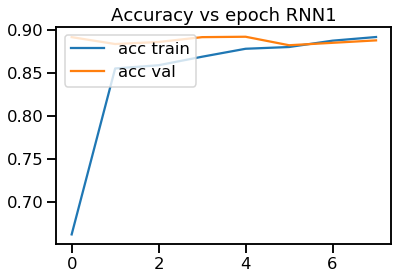


Accuracy sobre Test rnn1 : 0.8605746585021197
F1-score None sobre Test rnn1 : [0.92164288 0.03603604 0.         0.77635783]
F1-score macro sobre Test rnn1 : 0.43350918536534744


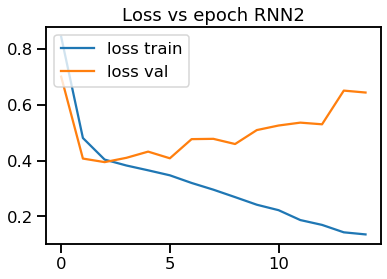

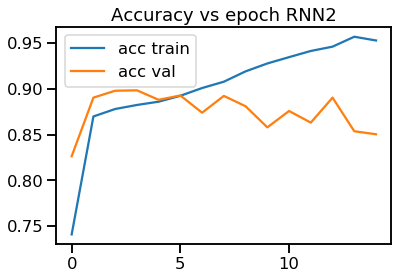


Accuracy sobre Test rnn2 : 0.8045219029674988
F1-score None sobre Test rnn2 : [0.88771054 0.2745098  0.         0.67989418]
F1-score macro sobre Test rnn2 : 0.4605286316370313


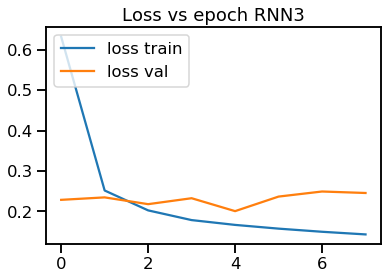

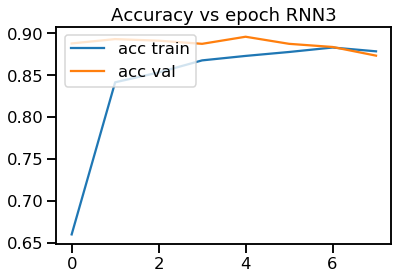


Accuracy sobre Test rnn3 : 0.8389072067828545
F1-score None sobre Test rnn3 : [0.9109462  0.         0.         0.74306393]
F1-score macro sobre Test rnn3 : 0.413502532277304

Entrenando exec  2 



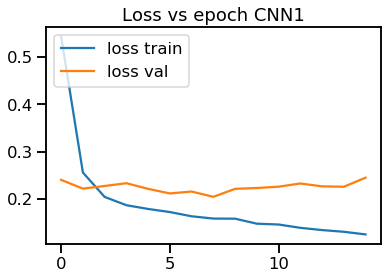

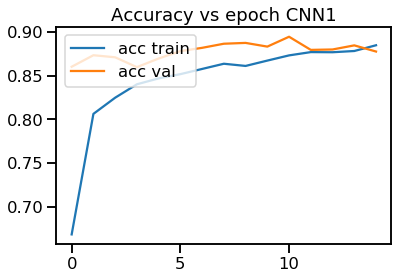


Accuracy sobre Test cnn1 : 0.8276024493641074
F1-score None sobre Test cnn1 : [0.89977477 0.         0.         0.62109375]
F1-score macro sobre Test cnn1 : 0.3802171311936937


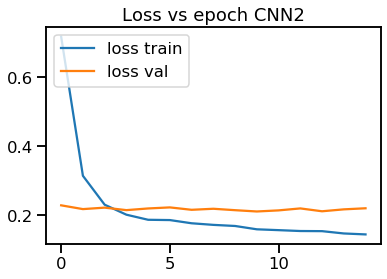

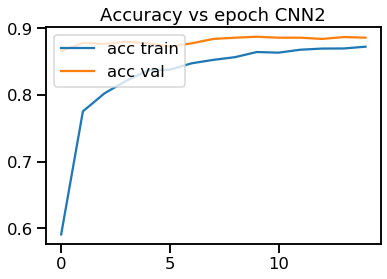


Accuracy sobre Test cnn2 : 0.8704663212435233
F1-score None sobre Test cnn2 : [0.92779251 0.         0.         0.81669151]
F1-score macro sobre Test cnn2 : 0.4361210048038765


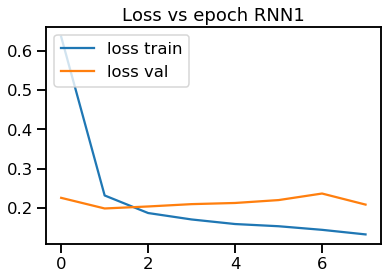

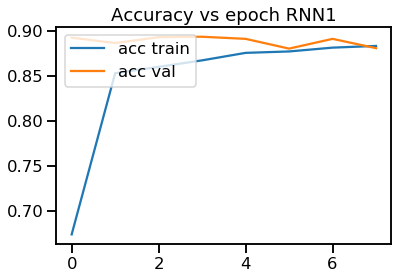


Accuracy sobre Test rnn1 : 0.8469147432878003
F1-score None sobre Test rnn1 : [0.91886908 0.         0.06315789 0.7585335 ]
F1-score macro sobre Test rnn1 : 0.43514012020930815


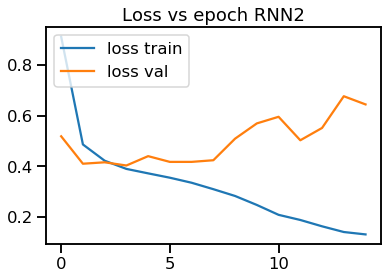

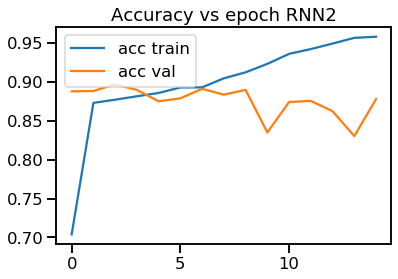


Accuracy sobre Test rnn2 : 0.8374941121055111
F1-score None sobre Test rnn2 : [0.90844233 0.08695652 0.02531646 0.70930233]
F1-score macro sobre Test rnn2 : 0.4325044083938967


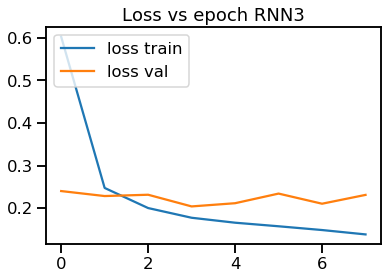

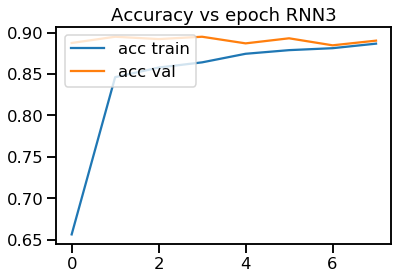


Accuracy sobre Test rnn3 : 0.8563353744700894
F1-score None sobre Test rnn3 : [0.92057868 0.         0.02469136 0.76785714]
F1-score macro sobre Test rnn3 : 0.42828179602057664

Entrenando exec  3 



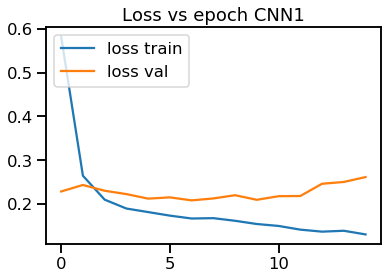

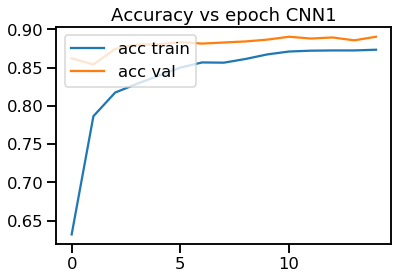


Accuracy sobre Test cnn1 : 0.8685821950070655
F1-score None sobre Test cnn1 : [0.92681499 0.         0.         0.80555556]
F1-score macro sobre Test cnn1 : 0.4330926359614884


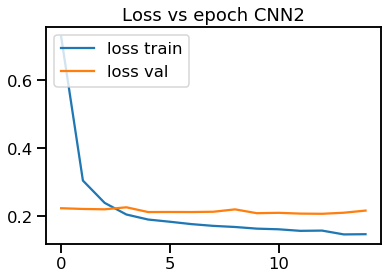

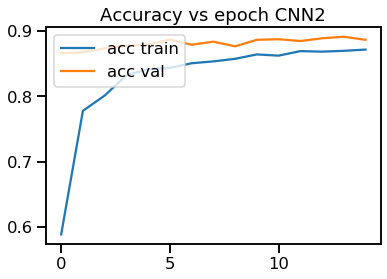


Accuracy sobre Test cnn2 : 0.8544512482336316
F1-score None sobre Test cnn2 : [0.91640333 0.         0.         0.75128645]
F1-score macro sobre Test cnn2 : 0.4169224454438528


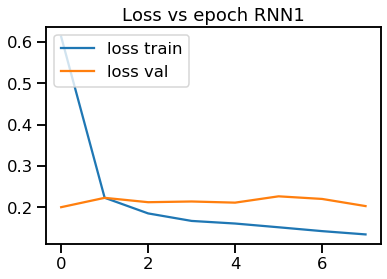

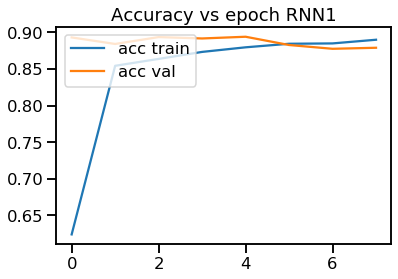


Accuracy sobre Test rnn1 : 0.8487988695242581
F1-score None sobre Test rnn1 : [0.9127789  0.         0.02597403 0.73856209]
F1-score macro sobre Test rnn1 : 0.4193287555356521


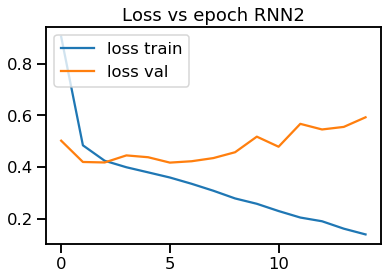

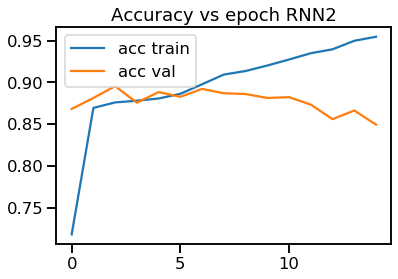


Accuracy sobre Test rnn2 : 0.8130004710315591
F1-score None sobre Test rnn2 : [0.89462624 0.15584416 0.16494845 0.65060241]
F1-score macro sobre Test rnn2 : 0.46650531436445364


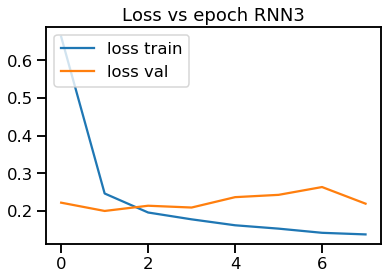

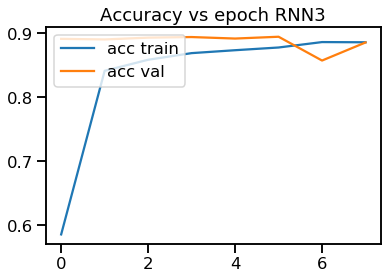


Accuracy sobre Test rnn3 : 0.8643429109750354
F1-score None sobre Test rnn3 : [0.92330383 0.         0.24444444 0.78484848]
F1-score macro sobre Test rnn3 : 0.4881491910252972

Entrenando exec  4 



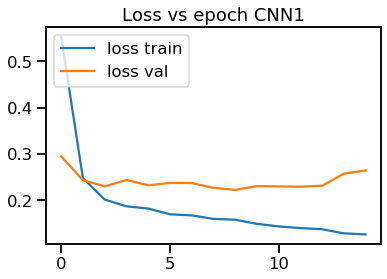

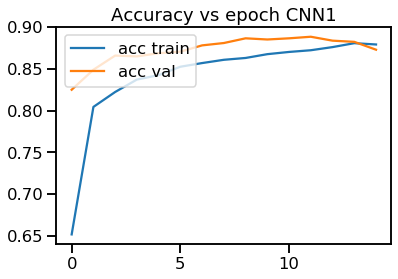


Accuracy sobre Test cnn1 : 0.8412623645784267
F1-score None sobre Test cnn1 : [0.90847072 0.         0.         0.68864469]
F1-score macro sobre Test cnn1 : 0.3992788526614564


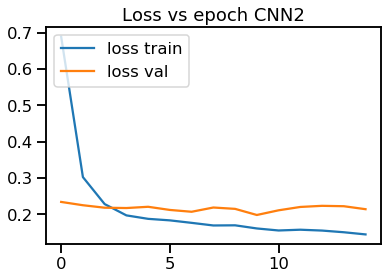

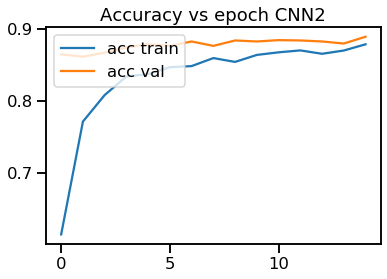


Accuracy sobre Test cnn2 : 0.8591615638247763
F1-score None sobre Test cnn2 : [0.91938746 0.         0.         0.77280265]
F1-score macro sobre Test cnn2 : 0.4230475284178165


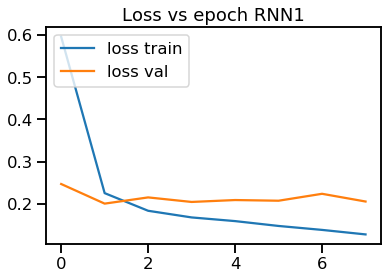

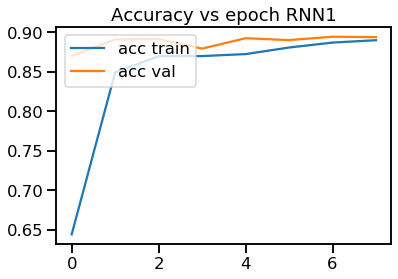


Accuracy sobre Test rnn1 : 0.8634008478568064
F1-score None sobre Test rnn1 : [0.92312207 0.01869159 0.         0.79204893]
F1-score macro sobre Test rnn1 : 0.4334656460440887


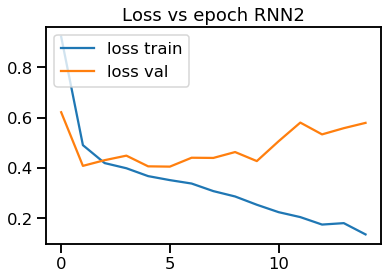

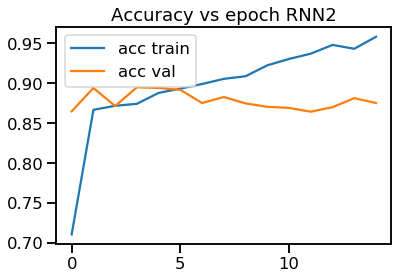


Accuracy sobre Test rnn2 : 0.8497409326424871
F1-score None sobre Test rnn2 : [0.91596639 0.09448819 0.025      0.76661952]
F1-score macro sobre Test rnn2 : 0.4505185236564416


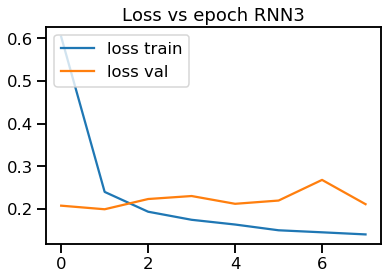

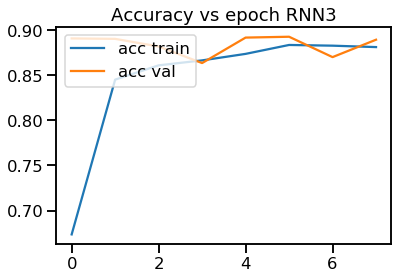


Accuracy sobre Test rnn3 : 0.8605746585021197
F1-score None sobre Test rnn3 : [0.92239599 0.         0.15238095 0.79256966]
F1-score macro sobre Test rnn3 : 0.46683664971012395

Entrenando exec  5 



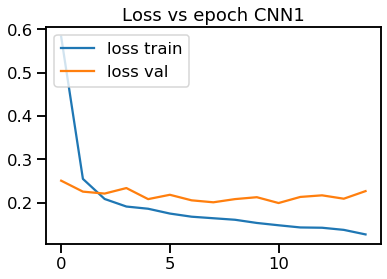

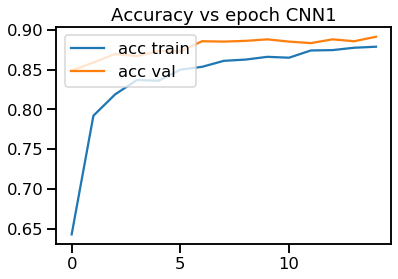


Accuracy sobre Test cnn1 : 0.8634008478568064
F1-score None sobre Test cnn1 : [0.92236385 0.         0.         0.7875817 ]
F1-score macro sobre Test cnn1 : 0.4274863865978991


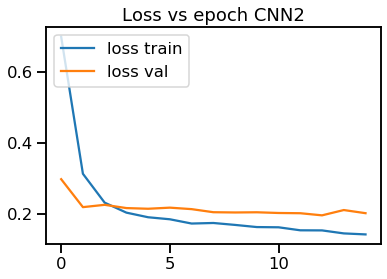

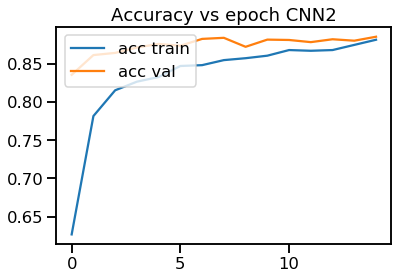


Accuracy sobre Test cnn2 : 0.8563353744700894
F1-score None sobre Test cnn2 : [0.91793838 0.         0.         0.75803723]
F1-score macro sobre Test cnn2 : 0.4189939017111943


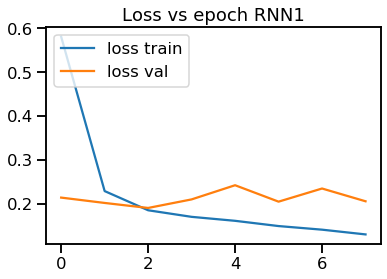

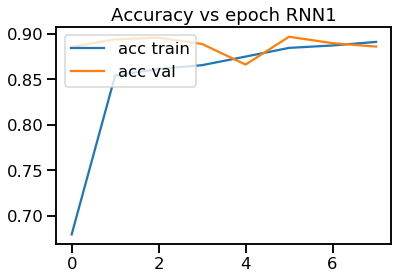


Accuracy sobre Test rnn1 : 0.8502119642016015
F1-score None sobre Test rnn1 : [0.91467969 0.         0.         0.73195876]
F1-score macro sobre Test rnn1 : 0.41165961315773103


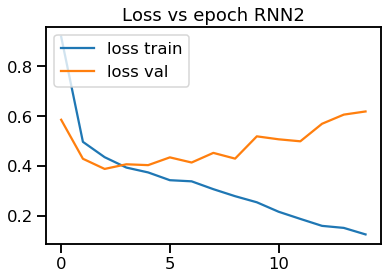

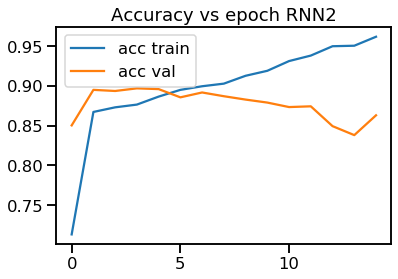


Accuracy sobre Test rnn2 : 0.8233631653320772
F1-score None sobre Test rnn2 : [0.9001233  0.18543046 0.02564103 0.70633894]
F1-score macro sobre Test rnn2 : 0.4543834332443458


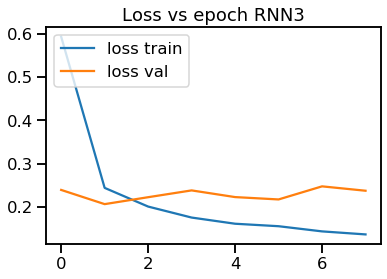

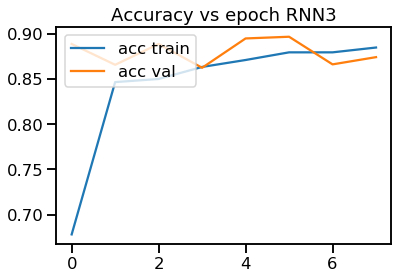


Accuracy sobre Test rnn3 : 0.8327837965143665
F1-score None sobre Test rnn3 : [0.90926099 0.         0.         0.72345391]
F1-score macro sobre Test rnn3 : 0.4081787251414369


In [22]:
fs_macro={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
fs_none={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
accs={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
confusions={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}

for i in range(1,6):    
    print ("\nEntrenando exec ", i,"\n")
    cnn1=create_ccn1(x_train.shape[1:])
    trained, hist =train_model(cnn1, x_train, y_train, x_val, y_val, class_weights, e=15, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.0/cnn1_'+str(i)+'-exec_15.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch CNN1")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch CNN1")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'cnn1')
    fs_macro['cnn1'].append(f1_ma_t)
    fs_none['cnn1'].append(f1_t)
    accs['cnn1'].append(acc_t)
    confusions['cnn1'].append(matriz_t)
    
    cnn2=create_cnn2(x_train.shape[1:])
    trained, hist =train_model(cnn2, x_train, y_train, x_val, y_val, class_weights, e=15, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.0/cnn2_'+str(i)+'-exec_15.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch CNN2")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch CNN2")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'cnn2')
    fs_macro['cnn2'].append(f1_ma_t)
    fs_none['cnn2'].append(f1_t)
    accs['cnn2'].append(acc_t)
    confusions['cnn2'].append(matriz_t)
    
    rnn1=create_complex_GRU_2(128,64,"adam",x_train.shape[1:])
    trained, hist =train_model(rnn1, x_train, y_train, x_val, y_val, class_weights, e=8, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.0/rnn1_'+str(i)+'-exec_8.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch RNN1")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch RNN1")
    plt.show()
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'rnn1')
    fs_macro['rnn1'].append(f1_ma_t)
    fs_none['rnn1'].append(f1_t)
    accs['rnn1'].append(acc_t)
    confusions['rnn1'].append(matriz_t)
    
    rnn2=create_complex_GRU_3(256,128,64,"adam",x_train.shape[1:])
    trained, hist =train_model(rnn2, x_train, y_train, x_val, y_val, class_weights, e=15, BS=32, verb=0, focal=False)
    trained.save('../new_glove_augmented/harassment_baselines/0.0/rnn2_'+str(i)+'-exec_15.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch RNN2")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch RNN2")
    plt.show()
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'rnn2')
    fs_macro['rnn2'].append(f1_ma_t)
    fs_none['rnn2'].append(f1_t)
    accs['rnn2'].append(acc_t)
    confusions['rnn2'].append(matriz_t)
    
    rnn3=create_complex_GRU_3(256,128,64,"adam",x_train.shape[1:])
    trained, hist =train_model(rnn3, x_train, y_train, x_val, y_val, class_weights, e=8, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.0/rnn3_'+str(i)+'-exec_8.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch RNN3")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch RNN3")
    plt.show()
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'rnn3')
    fs_macro['rnn3'].append(f1_ma_t)
    fs_none['rnn3'].append(f1_t)
    accs['rnn3'].append(acc_t)
    confusions['rnn3'].append(matriz_t)


In [23]:
### con 15 y 8 epochs 

for key in fs_none.keys():
    temp=np.zeros(4)
    for result in fs_none[key]:
        temp+=result
    print ("(0.0) 15-8e F1-score promedio para",key,":" ,temp/5)

print ("")
for key in fs_macro.keys():
    temp=np.sum(fs_macro[key])
    print ("(0.0) 15-8e F1-score macro promedio para",key,":" ,temp/5, "desvest: ",np.std(fs_macro[key]))

print ("")
for key in accs.keys():
    temp=np.sum(accs[key])
    print ("(0.0) 15-8e Accuracy promedio para",key,":" ,temp/5)

(0.0) 15-8e F1-score promedio para cnn1 : [0.91476553 0.         0.         0.73220464]
(0.0) 15-8e F1-score promedio para cnn2 : [0.91919418 0.         0.         0.76528202]
(0.0) 15-8e F1-score promedio para rnn1 : [0.91821852 0.01094552 0.01782638 0.75949222]
(0.0) 15-8e F1-score promedio para rnn2 : [0.90137376 0.15944583 0.04818119 0.70255147]
(0.0) 15-8e F1-score promedio para rnn3 : [0.91729714 0.         0.08430335 0.76235863]

(0.0) 15-8e F1-score macro promedio para cnn1 : 0.4117425435449199 desvest:  0.01949581284858719
(0.0) 15-8e F1-score macro promedio para cnn2 : 0.42111905009019723 desvest:  0.008525837340258354
(0.0) 15-8e F1-score macro promedio para rnn1 : 0.42662066406242544 desvest:  0.009422224909695694
(0.0) 15-8e F1-score macro promedio para rnn2 : 0.4528880622592338 desvest:  0.011551208142780219
(0.0) 15-8e F1-score macro promedio para rnn3 : 0.4409897788349477 desvest:  0.03125916725438096

(0.0) 15-8e Accuracy promedio para cnn1 : 0.8512482336316534
(0.0) 1

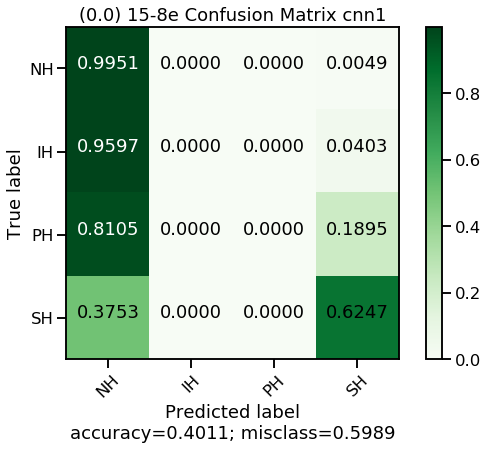

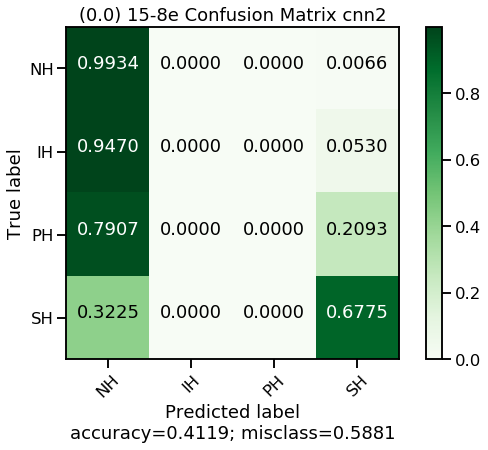

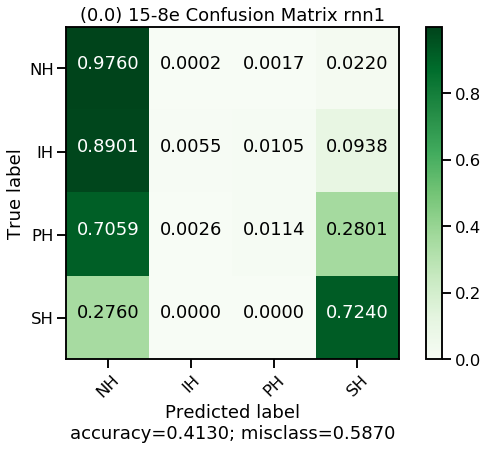

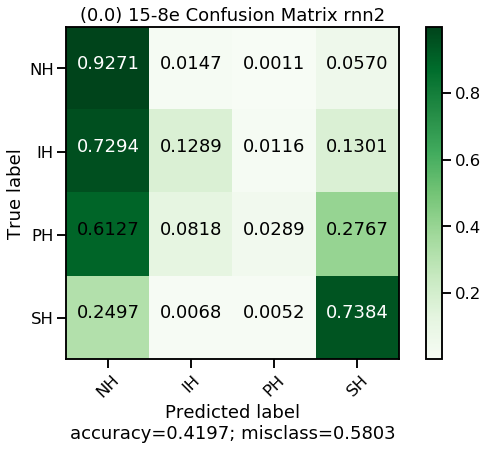

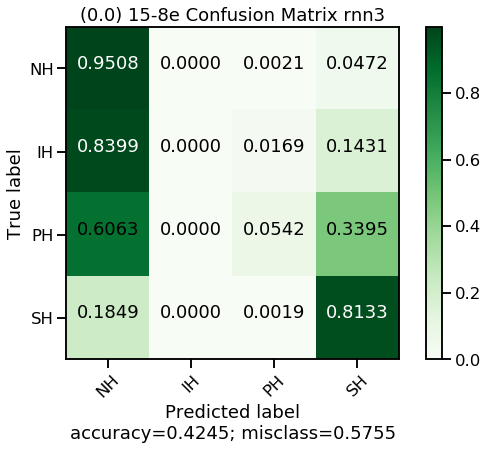

In [24]:
for key in confusions.keys():
    temp=np.sum(confusions[key], axis=0)/5.0
    plot_confusion_matrix(temp, ['NH','IH','PH','SH'], "(0.0) 15-8e Confusion Matrix "+str(key), cmap='Greens')

In [25]:
### con 20 y 10 epochs 

for key in fs_none.keys():
    temp=np.zeros(4)
    for result in fs_none[key]:
        temp+=result
    print ("(0.0) F1-score promedio para",key,":" ,temp/5)

print ("")
for key in fs_macro.keys():
    temp=np.sum(fs_macro[key])
    print ("(0.0) F1-score macro promedio para",key,":" ,temp/5, "desvest: ",np.std(fs_macro[key]))

print ("")
for key in accs.keys():
    temp=np.sum(accs[key])
    print ("(0.0) Accuracy promedio para",key,":" ,temp/5)

(0.0) F1-score promedio para cnn1 : [0.92110128 0.         0.         0.77777408]
(0.0) F1-score promedio para cnn2 : [0.91929244 0.         0.         0.76674962]
(0.0) F1-score promedio para rnn1 : [0.91872992 0.01097643 0.03012971 0.75534516]
(0.0) F1-score promedio para rnn2 : [0.90082494 0.11308858 0.10496646 0.70544156]
(0.0) F1-score promedio para rnn3 : [0.91609314 0.03464567 0.0565028  0.7275336 ]

(0.0) F1-score macro promedio para cnn1 : 0.4247188380295204 desvest:  0.005158773545378376
(0.0) F1-score macro promedio para cnn2 : 0.4215105166234939 desvest:  0.008186314002786355
(0.0) F1-score macro promedio para rnn1 : 0.42879530504848606 desvest:  0.004737112029725768
(0.0) F1-score macro promedio para rnn2 : 0.4560803873795837 desvest:  0.02435436206599261
(0.0) F1-score macro promedio para rnn3 : 0.4336938003993822 desvest:  0.03783404481111906

(0.0) Accuracy promedio para cnn1 : 0.8608572774375883
(0.0) Accuracy promedio para cnn2 : 0.8580310880829016
(0.0) Accuracy prom

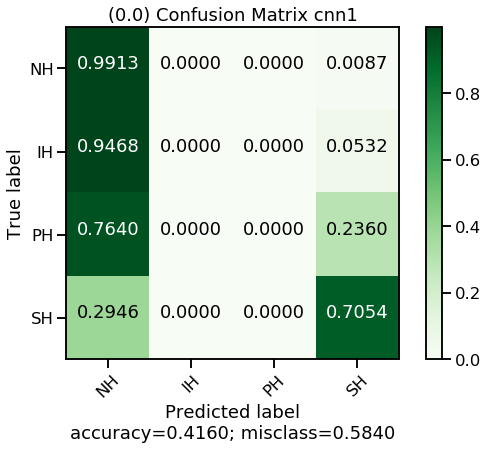

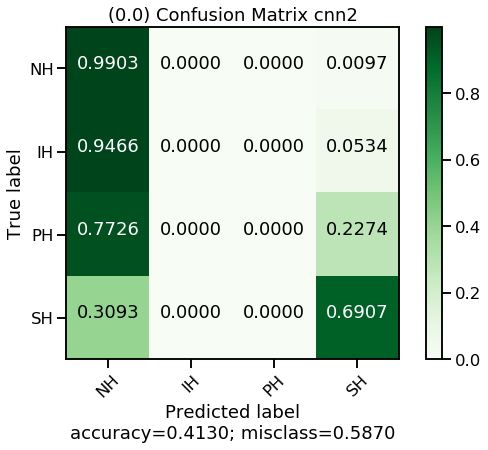

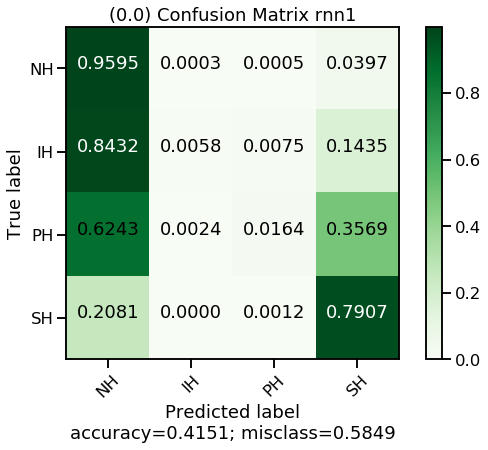

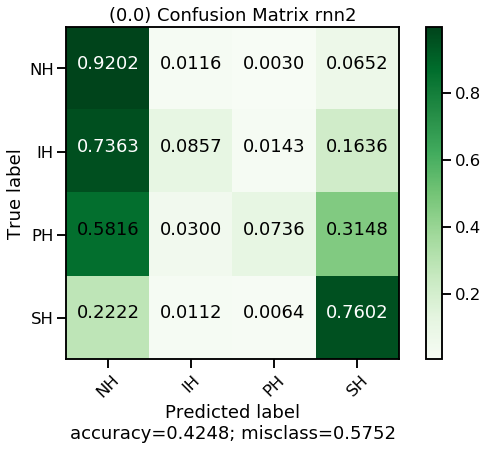

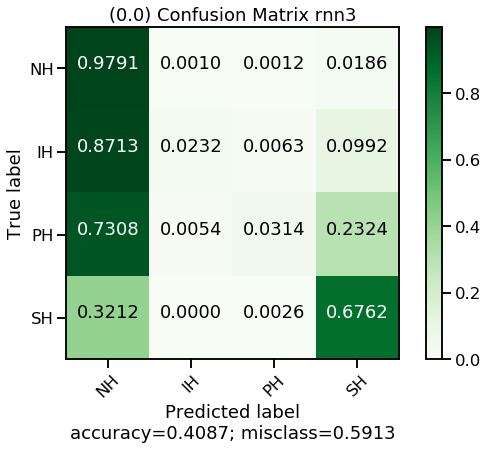

In [26]:
for key in confusions.keys():
    temp=np.sum(confusions[key], axis=0)/5.0
    plot_confusion_matrix(temp, ['NH','IH','PH','SH'], "(0.0) Confusion Matrix "+str(key), cmap='Greens')

## Sin aumento Con CW

In [25]:
class_weights= compute_class_weight('balanced', np.unique(labels_train), labels_train)
print ("Pesos de clases:", class_weights)

Pesos de clases: [ 0.43526359 28.97272727 20.96710526  0.61715724]



Entrenando exec  1 



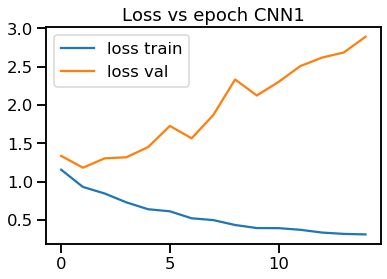

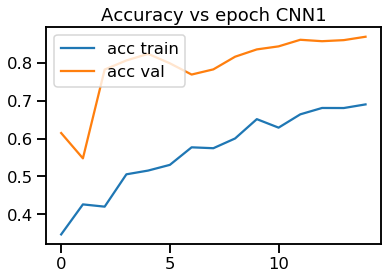


Accuracy sobre Test cnn1 : 0.8247762600094206
F1-score None sobre Test cnn1 : [0.89946494 0.05405405 0.02597403 0.59171598]
F1-score macro sobre Test cnn1 : 0.392802248953279


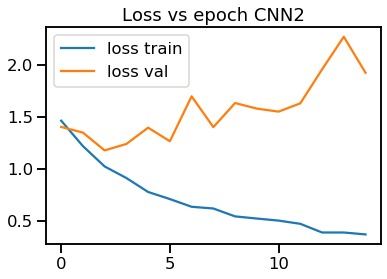

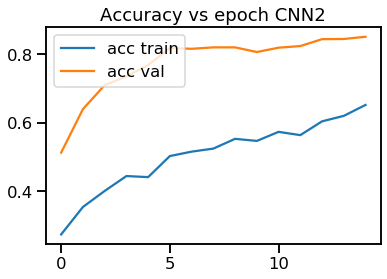


Accuracy sobre Test cnn2 : 0.7969853980216675
F1-score None sobre Test cnn2 : [0.88343558 0.19117647 0.025      0.42342342]
F1-score macro sobre Test cnn2 : 0.38075886920843616


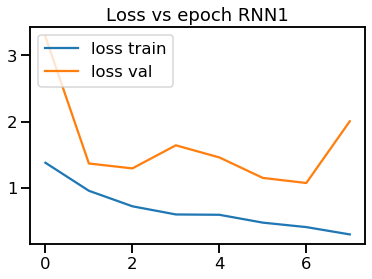

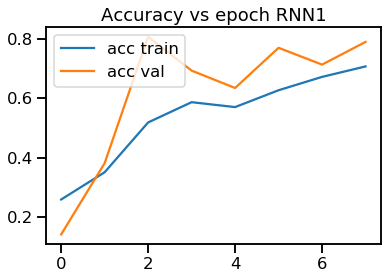


Accuracy sobre Test rnn1 : 0.7969853980216675
F1-score None sobre Test rnn1 : [0.91954745 0.29245283 0.26239067 0.60117878]
F1-score macro sobre Test rnn1 : 0.5188924342747836


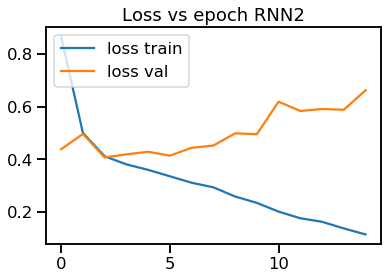

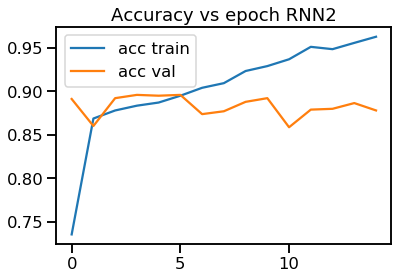


Accuracy sobre Test rnn2 : 0.8417333961375412
F1-score None sobre Test rnn2 : [0.91135574 0.03448276 0.04705882 0.70826307]
F1-score macro sobre Test rnn2 : 0.4252900967738495


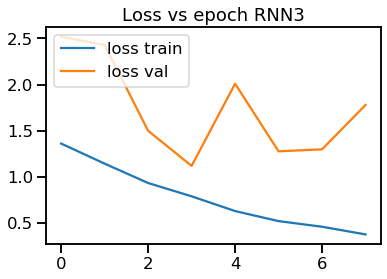

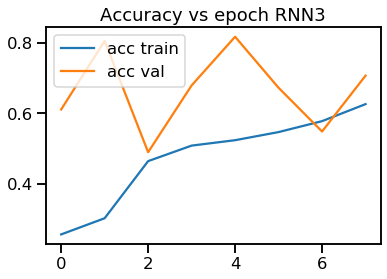


Accuracy sobre Test rnn3 : 0.6151672162034856
F1-score None sobre Test rnn3 : [0.74429053 0.14055637 0.25899281 0.74267101]
F1-score macro sobre Test rnn3 : 0.4716276780950066

Entrenando exec  2 



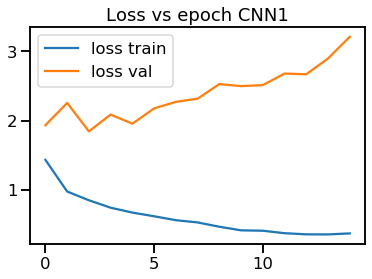

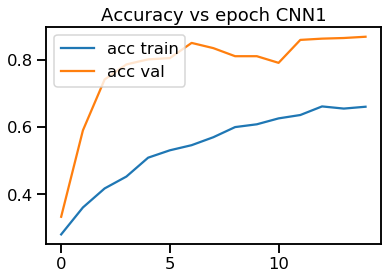


Accuracy sobre Test cnn1 : 0.8294865756005653
F1-score None sobre Test cnn1 : [0.90331727 0.         0.09090909 0.6247619 ]
F1-score macro sobre Test cnn1 : 0.40474706561749374


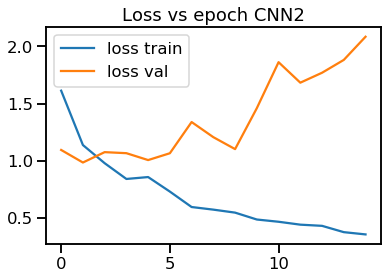

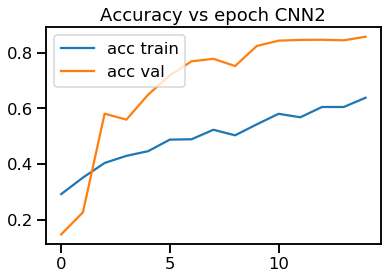


Accuracy sobre Test cnn2 : 0.8111163447951013
F1-score None sobre Test cnn2 : [0.89482565 0.11678832 0.07228916 0.5106383 ]
F1-score macro sobre Test cnn2 : 0.39863535561522007


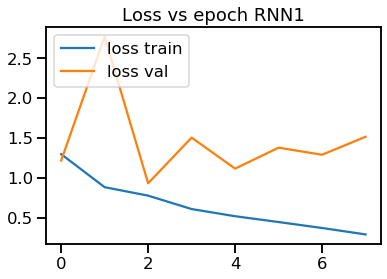

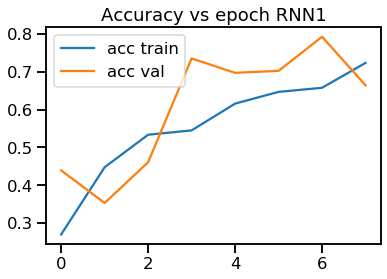


Accuracy sobre Test rnn1 : 0.6994818652849741
F1-score None sobre Test rnn1 : [0.8777741  0.30392157 0.20095694 0.27930175]
F1-score macro sobre Test rnn1 : 0.4154885873614109


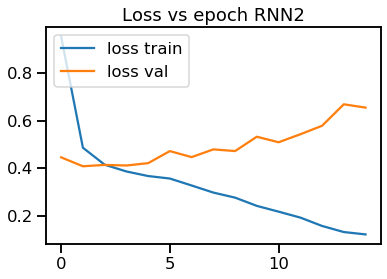

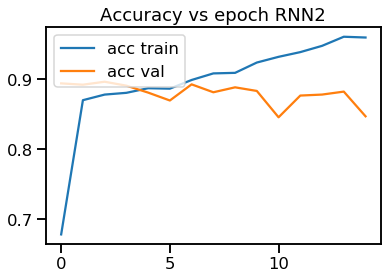


Accuracy sobre Test rnn2 : 0.8195949128591615
F1-score None sobre Test rnn2 : [0.8984757  0.09756098 0.09708738 0.61510129]
F1-score macro sobre Test rnn2 : 0.4270563352063233


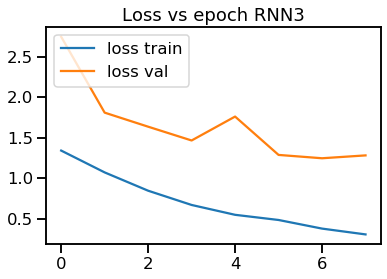

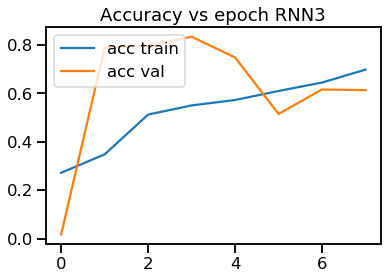


Accuracy sobre Test rnn3 : 0.568535091851154
F1-score None sobre Test rnn3 : [0.68659128 0.20413123 0.25981873 0.74675325]
F1-score macro sobre Test rnn3 : 0.474323620335147

Entrenando exec  3 



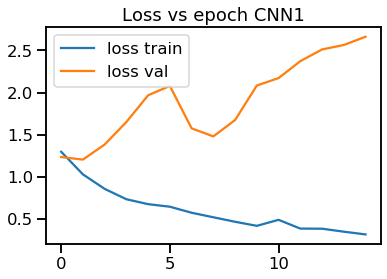

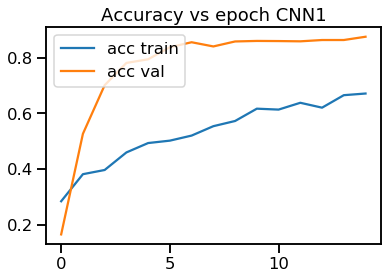


Accuracy sobre Test cnn1 : 0.8398492699010833
F1-score None sobre Test cnn1 : [0.91034483 0.         0.08888889 0.68421053]
F1-score macro sobre Test cnn1 : 0.42086106069772133


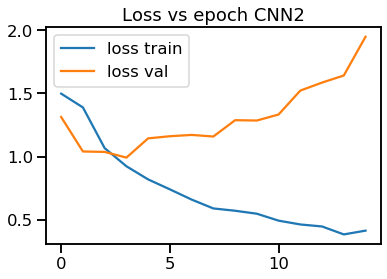

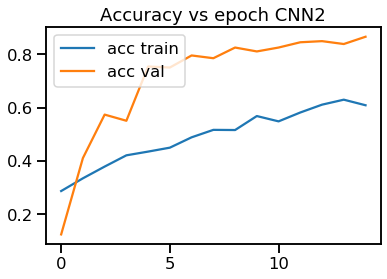


Accuracy sobre Test cnn2 : 0.83843617522374
F1-score None sobre Test cnn2 : [0.90945444 0.05128205 0.02531646 0.67030965]
F1-score macro sobre Test cnn2 : 0.41409065062064565


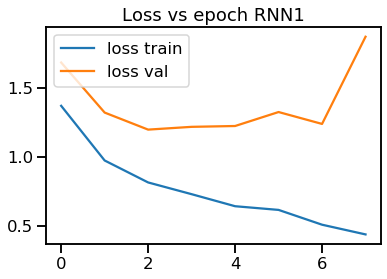

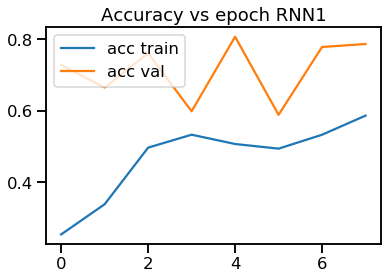


Accuracy sobre Test rnn1 : 0.7682524729156853
F1-score None sobre Test rnn1 : [0.8681431  0.37096774 0.29219144 0.75975976]
F1-score macro sobre Test rnn1 : 0.5727655094936447


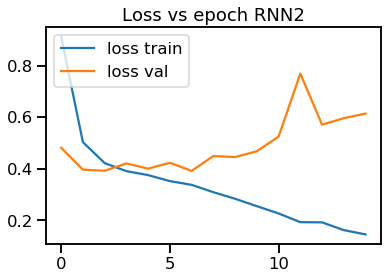

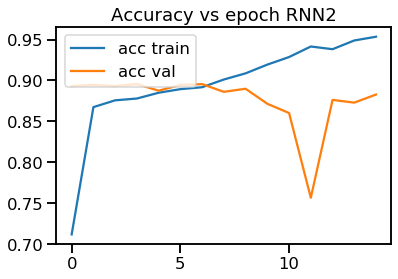


Accuracy sobre Test rnn2 : 0.8365520489872822
F1-score None sobre Test rnn2 : [0.90996979 0.         0.05128205 0.71562083]
F1-score macro sobre Test rnn2 : 0.41921816689301233


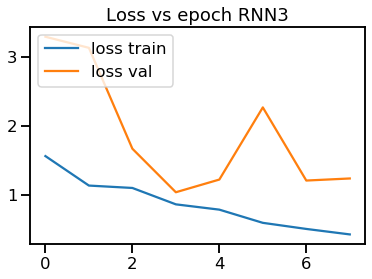

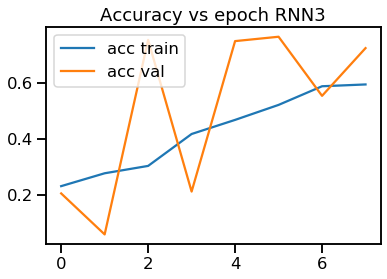


Accuracy sobre Test rnn3 : 0.6650965614696185
F1-score None sobre Test rnn3 : [0.79302832 0.19498607 0.32051282 0.72815534]
F1-score macro sobre Test rnn3 : 0.5091706387955328

Entrenando exec  4 



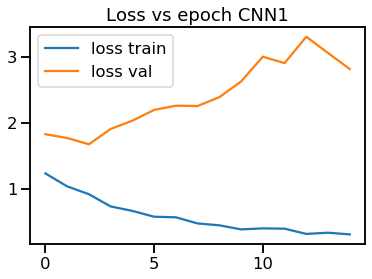

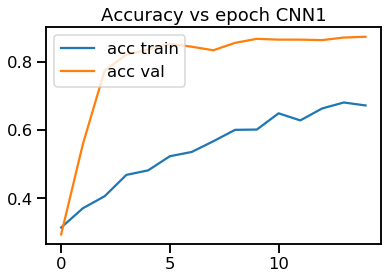


Accuracy sobre Test cnn1 : 0.8530381535562883
F1-score None sobre Test cnn1 : [0.91744731 0.0877193  0.09411765 0.74484945]
F1-score macro sobre Test cnn1 : 0.461033424355222


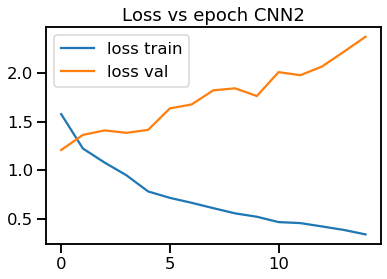

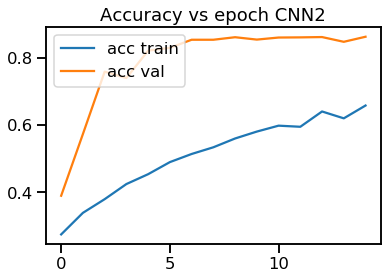


Accuracy sobre Test cnn2 : 0.8243052284503062
F1-score None sobre Test cnn2 : [0.90073738 0.09009009 0.         0.59022556]
F1-score macro sobre Test cnn2 : 0.39526325836667064


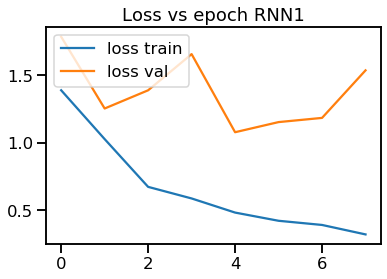

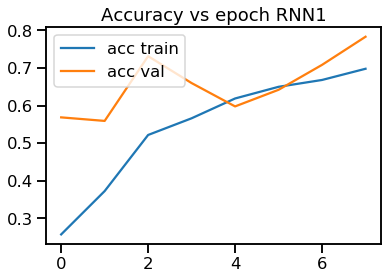


Accuracy sobre Test rnn1 : 0.7800282618935469
F1-score None sobre Test rnn1 : [0.88771466 0.35023041 0.32173913 0.71841155]
F1-score macro sobre Test rnn1 : 0.5695239401679716


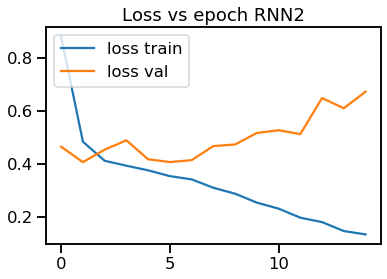

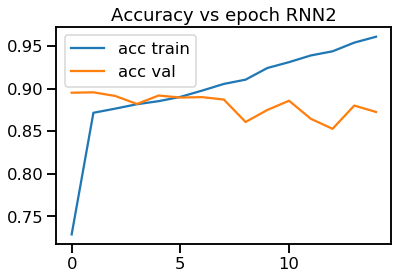


Accuracy sobre Test rnn2 : 0.8393782383419689
F1-score None sobre Test rnn2 : [0.90993072 0.         0.         0.68781302]
F1-score macro sobre Test rnn2 : 0.3994359344095433


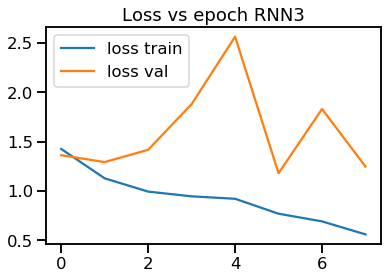

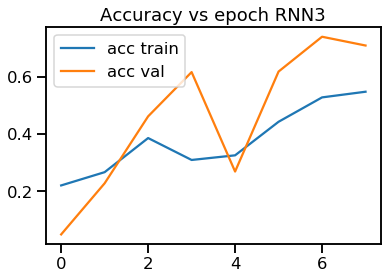


Accuracy sobre Test rnn3 : 0.6203485633537447
F1-score None sobre Test rnn3 : [0.79588336 0.17058096 0.10989011 0.38515081]
F1-score macro sobre Test rnn3 : 0.36537631200736215

Entrenando exec  5 



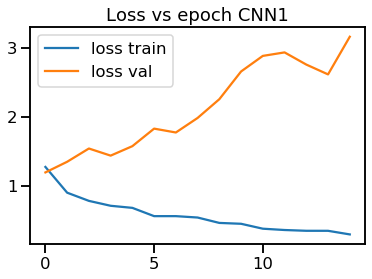

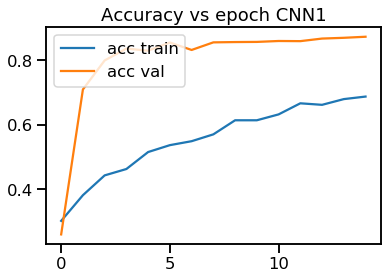


Accuracy sobre Test cnn1 : 0.8228921337729628
F1-score None sobre Test cnn1 : [0.89867344 0.01869159 0.         0.59230769]
F1-score macro sobre Test cnn1 : 0.377418180419953


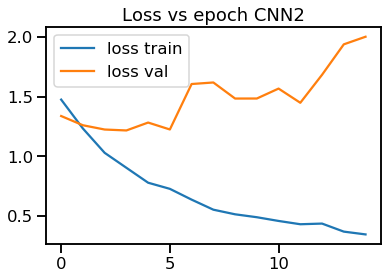

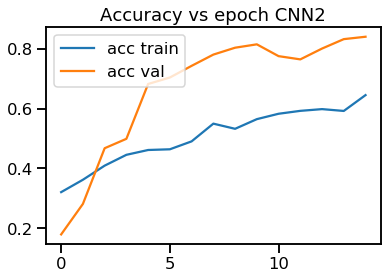


Accuracy sobre Test cnn2 : 0.8195949128591615
F1-score None sobre Test cnn2 : [0.90365257 0.21126761 0.17741935 0.56858847]
F1-score macro sobre Test cnn2 : 0.46523200092887484


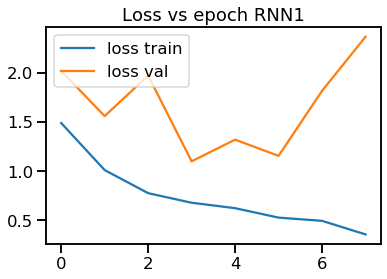

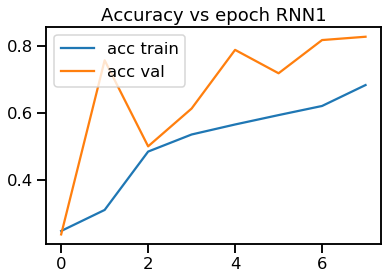


Accuracy sobre Test rnn1 : 0.8327837965143665
F1-score None sobre Test rnn1 : [0.91816746 0.23129252 0.32415902 0.80724876]
F1-score macro sobre Test rnn1 : 0.5702169398461923


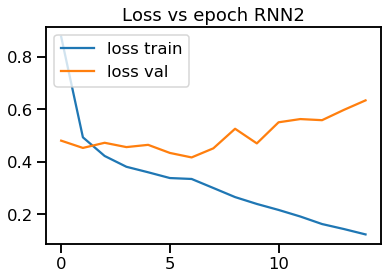

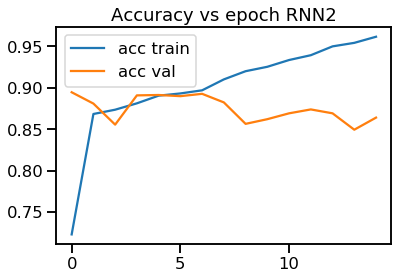


Accuracy sobre Test rnn2 : 0.8181818181818182
F1-score None sobre Test rnn2 : [0.89792231 0.10447761 0.11904762 0.66195191]
F1-score macro sobre Test rnn2 : 0.44584986325525955


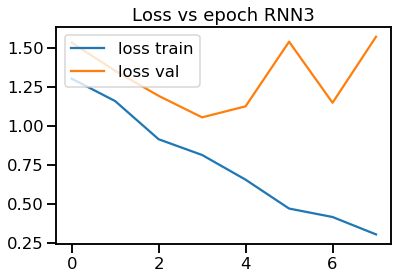

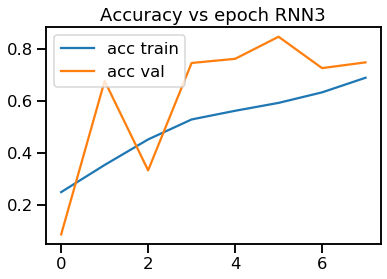


Accuracy sobre Test rnn3 : 0.7136128120584079
F1-score None sobre Test rnn3 : [0.81181619 0.30195382 0.29145729 0.77628032]
F1-score macro sobre Test rnn3 : 0.5453769053175448


In [26]:

fs_macro={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
fs_none={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
accs={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
confusions={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}

for i in range(1,6):    
    print ("\nEntrenando exec ", i,"\n")
    cnn1=create_ccn1(x_train.shape[1:])
    trained, hist =train_model(cnn1, x_train, y_train, x_val, y_val, class_weights, e=15, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.0_cw/cnn1_'+str(i)+'-exec_15e.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch CNN1")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch CNN1")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'cnn1')
    fs_macro['cnn1'].append(f1_ma_t)
    fs_none['cnn1'].append(f1_t)
    accs['cnn1'].append(acc_t)
    confusions['cnn1'].append(matriz_t)
    
    cnn2=create_cnn2(x_train.shape[1:])
    trained, hist =train_model(cnn2, x_train, y_train, x_val, y_val, class_weights, e=15, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.0_cw/cnn2_'+str(i)+'-exec_15e.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch CNN2")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch CNN2")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'cnn2')
    fs_macro['cnn2'].append(f1_ma_t)
    fs_none['cnn2'].append(f1_t)
    accs['cnn2'].append(acc_t)
    confusions['cnn2'].append(matriz_t)
    
    rnn1=create_complex_GRU_2(128,64,"adam",x_train.shape[1:])
    trained, hist =train_model(rnn1, x_train, y_train, x_val, y_val, class_weights, e=8, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.0_cw/rnn1_'+str(i)+'-exec_8e.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch RNN1")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch RNN1")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'rnn1')
    fs_macro['rnn1'].append(f1_ma_t)
    fs_none['rnn1'].append(f1_t)
    accs['rnn1'].append(acc_t)
    confusions['rnn1'].append(matriz_t)
    
    rnn2=create_complex_GRU_3(256,128,64,"adam",x_train.shape[1:])
    trained, hist =train_model(rnn2, x_train, y_train, x_val, y_val, class_weights, e=15, BS=32, verb=0, focal=False)
    trained.save('../new_glove_augmented/harassment_baselines/0.0_cw/rnn2_'+str(i)+'-exec_15e.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch RNN2")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch RNN2")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'rnn2')
    fs_macro['rnn2'].append(f1_ma_t)
    fs_none['rnn2'].append(f1_t)
    accs['rnn2'].append(acc_t)
    confusions['rnn2'].append(matriz_t)
    
    rnn3=create_complex_GRU_3(256,128,64,"adam",x_train.shape[1:])
    trained, hist =train_model(rnn3, x_train, y_train, x_val, y_val, class_weights, e=8, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.0_cw/rnn3_'+str(i)+'-exec_8e.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch RNN3")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch RNN3")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'rnn3')
    fs_macro['rnn3'].append(f1_ma_t)
    fs_none['rnn3'].append(f1_t)
    accs['rnn3'].append(acc_t)
    confusions['rnn3'].append(matriz_t)


In [27]:
for key in fs_none.keys():
    temp=np.zeros(4)
    for result in fs_none[key]:
        temp+=result
    print ("(0.0_cw) 15-8e F1-score promedio para",key,":" ,temp/5)

print ("")
for key in fs_macro.keys():
    temp=np.sum(fs_macro[key])
    print ("(0.0_cw) 15-8e F1-score macro promedio para",key,":" ,temp/5, "desvest: ",np.std(fs_macro[key]))

print ("")
for key in accs.keys():
    temp=np.sum(accs[key])
    print ("(0.0_cw) 15-8e Accuracy promedio para",key,":" ,temp/5)

(0.0_cw) 15-8e F1-score promedio para cnn1 : [0.90584956 0.03209299 0.05997793 0.64756911]
(0.0_cw) 15-8e F1-score promedio para cnn2 : [0.89842112 0.13212091 0.06000499 0.55263708]
(0.0_cw) 15-8e F1-score promedio para rnn1 : [0.89426935 0.30977301 0.28028744 0.63318012]
(0.0_cw) 15-8e F1-score promedio para rnn2 : [0.90553085 0.04730427 0.06289517 0.67775002]
(0.0_cw) 15-8e F1-score promedio para rnn3 : [0.76632194 0.20244169 0.24813435 0.67580215]

(0.0_cw) 15-8e F1-score macro promedio para cnn1 : 0.41137239600873376 desvest:  0.028628260913700132
(0.0_cw) 15-8e F1-score macro promedio para cnn2 : 0.41079602694796946 desvest:  0.02920790810902865
(0.0_cw) 15-8e F1-score macro promedio para rnn1 : 0.5293774822288007 desvest:  0.060403206699963505
(0.0_cw) 15-8e F1-score macro promedio para rnn2 : 0.4233700793075976 desvest:  0.014917756564943731
(0.0_cw) 15-8e F1-score macro promedio para rnn3 : 0.4731750309101187 desvest:  0.06022137794913607

(0.0_cw) 15-8e Accuracy promedio para 

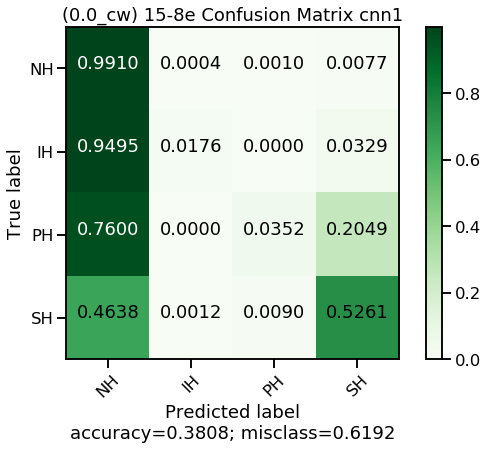

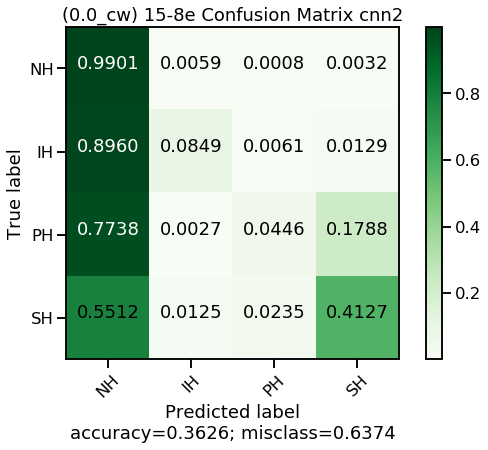

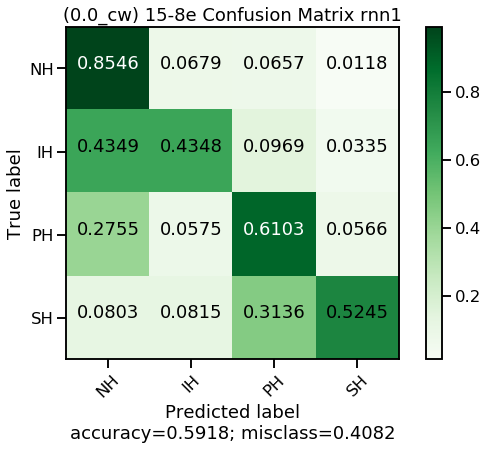

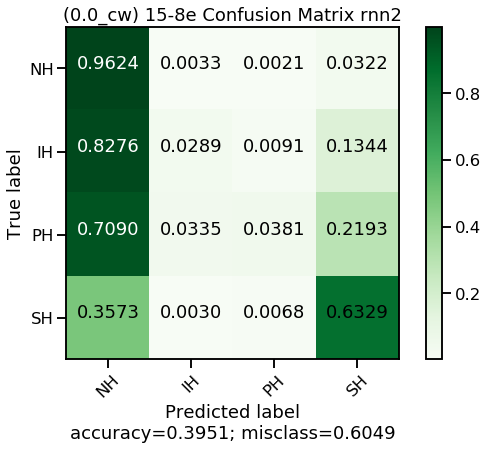

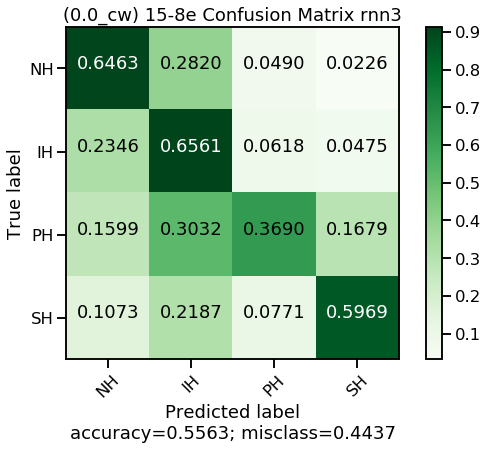

In [28]:
for key in confusions.keys():
    temp=np.sum(confusions[key], axis=0)/5.0
    plot_confusion_matrix(temp, ['NH','IH','PH','SH'], "(0.0_cw) 15-8e Confusion Matrix "+str(key), cmap='Greens')


Entrenando exec  1 



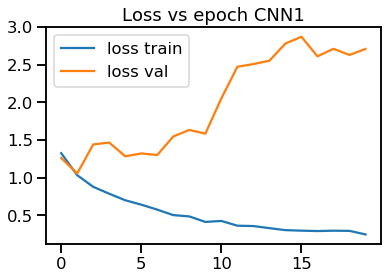

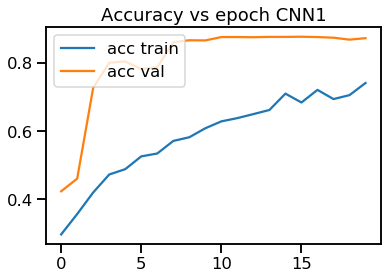


Accuracy sobre Test cnn1 : 0.8450306170513424
F1-score None sobre Test cnn1 : [0.9112324  0.144      0.02597403 0.70337478]
F1-score macro sobre Test cnn1 : 0.44614530210765746


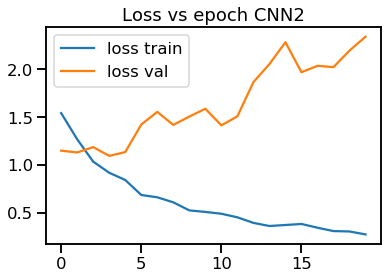

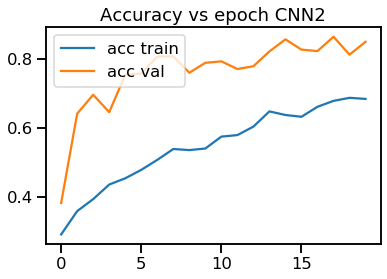


Accuracy sobre Test cnn2 : 0.8285445124823363
F1-score None sobre Test cnn2 : [0.90503432 0.14754098 0.16216216 0.61508704]
F1-score macro sobre Test cnn2 : 0.4574561278326168


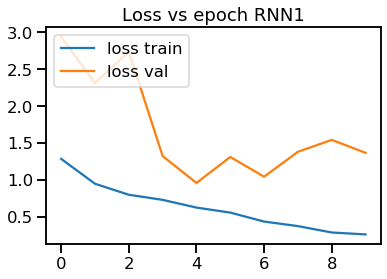

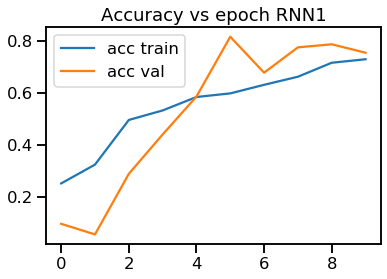


Accuracy sobre Test rnn1 : 0.7023080546396608
F1-score None sobre Test rnn1 : [0.8341532  0.27888446 0.30678466 0.65116279]
F1-score macro sobre Test rnn1 : 0.5177462777715409


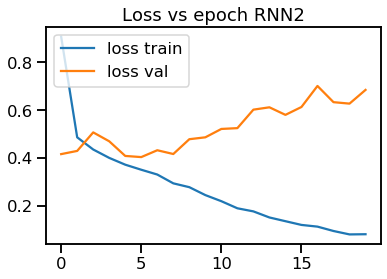

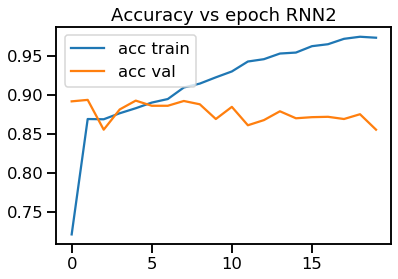


Accuracy sobre Test rnn2 : 0.8167687235044748
F1-score None sobre Test rnn2 : [0.90402844 0.13924051 0.12631579 0.6191248 ]
F1-score macro sobre Test rnn2 : 0.44717738230714066


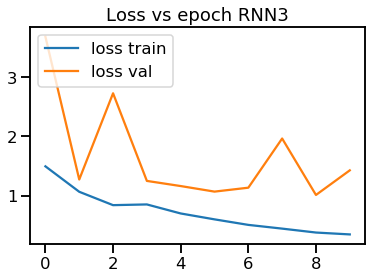

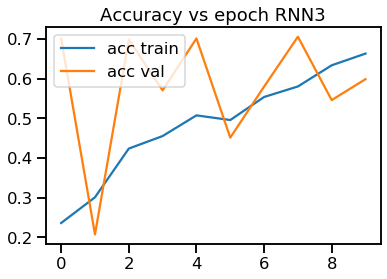


Accuracy sobre Test rnn3 : 0.544983513895431
F1-score None sobre Test rnn3 : [0.66558966 0.17136886 0.32535885 0.71854305]
F1-score macro sobre Test rnn3 : 0.47021510494985613

Entrenando exec  2 



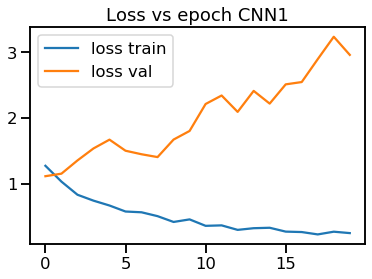

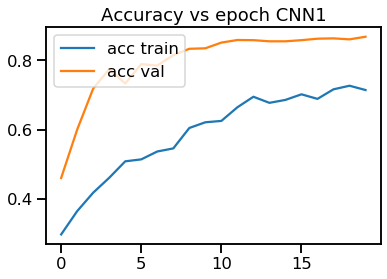


Accuracy sobre Test cnn1 : 0.8365520489872822
F1-score None sobre Test cnn1 : [0.90535918 0.12173913 0.09411765 0.65799257]
F1-score macro sobre Test cnn1 : 0.44480213039218813


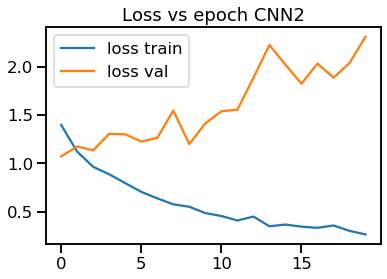

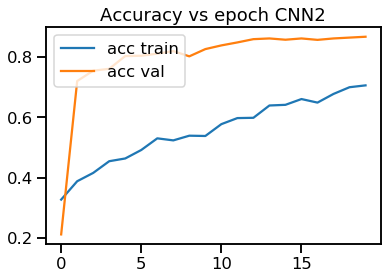


Accuracy sobre Test cnn2 : 0.8304286387187941
F1-score None sobre Test cnn2 : [0.90252913 0.10169492 0.04878049 0.63377609]
F1-score macro sobre Test cnn2 : 0.4216951554334438


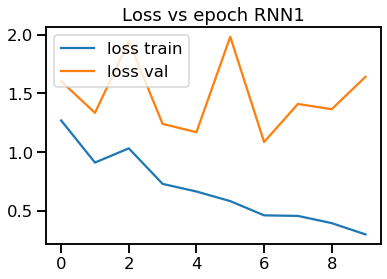

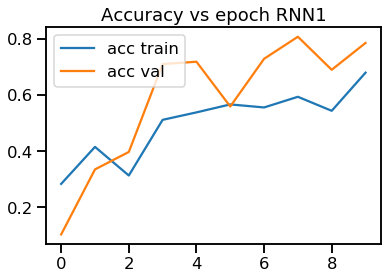


Accuracy sobre Test rnn1 : 0.8200659444182761
F1-score None sobre Test rnn1 : [0.90832795 0.38545455 0.31836735 0.77070064]
F1-score macro sobre Test rnn1 : 0.5957126207135988


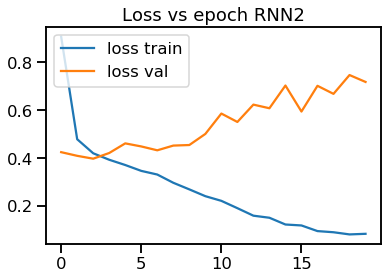

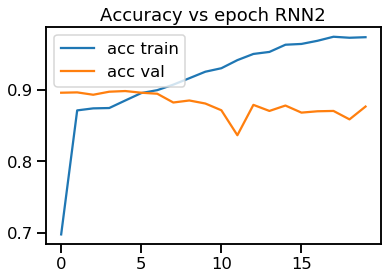


Accuracy sobre Test rnn2 : 0.8426754592557701
F1-score None sobre Test rnn2 : [0.91278375 0.05357143 0.         0.72881356]
F1-score macro sobre Test rnn2 : 0.4237921848467229


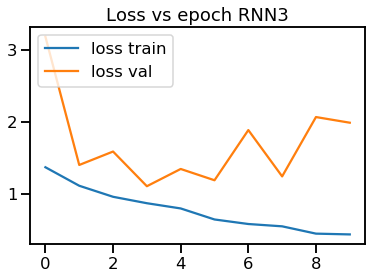

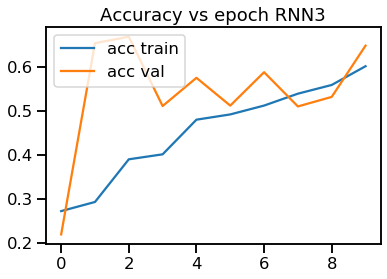


Accuracy sobre Test rnn3 : 0.7173810645313236
F1-score None sobre Test rnn3 : [0.89712996 0.31428571 0.20295203 0.22391858]
F1-score macro sobre Test rnn3 : 0.40957156923691546

Entrenando exec  3 



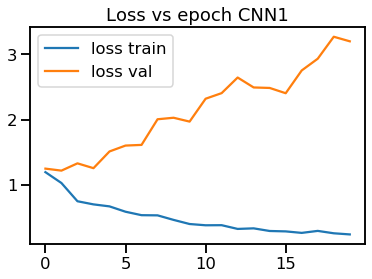

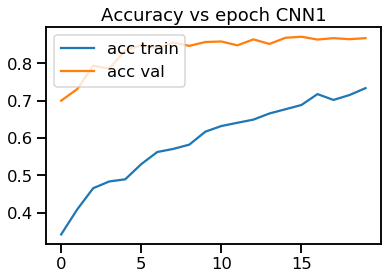


Accuracy sobre Test cnn1 : 0.8398492699010833
F1-score None sobre Test cnn1 : [0.90716938 0.11864407 0.02597403 0.68      ]
F1-score macro sobre Test cnn1 : 0.4329468684869321


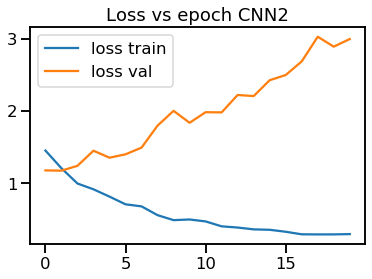

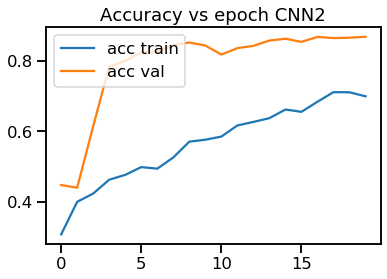


Accuracy sobre Test cnn2 : 0.8351389543099388
F1-score None sobre Test cnn2 : [0.90794379 0.01834862 0.14141414 0.66061706]
F1-score macro sobre Test cnn2 : 0.43208090409575195


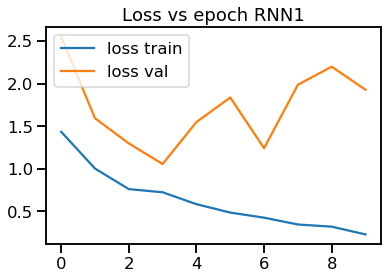

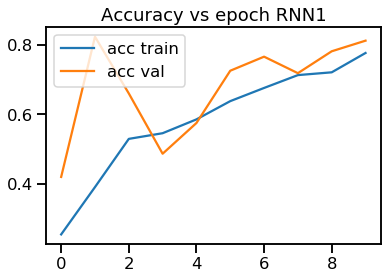


Accuracy sobre Test rnn1 : 0.7899199246349505
F1-score None sobre Test rnn1 : [0.87483617 0.32445521 0.37086093 0.78412698]
F1-score macro sobre Test rnn1 : 0.5885698225229377


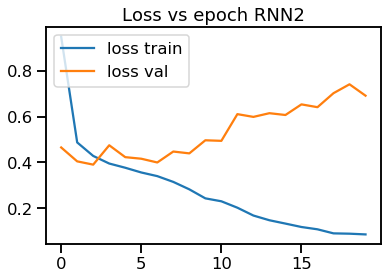

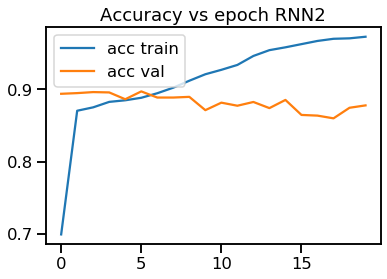


Accuracy sobre Test rnn2 : 0.8403203014601979
F1-score None sobre Test rnn2 : [0.91064349 0.064      0.17391304 0.744     ]
F1-score macro sobre Test rnn2 : 0.47313913308670463


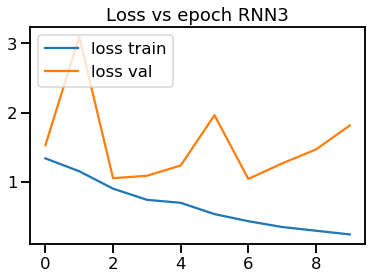

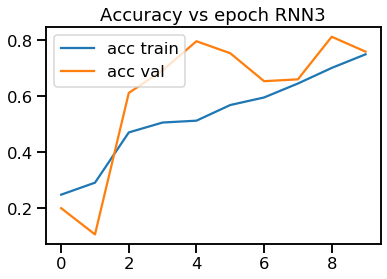


Accuracy sobre Test rnn3 : 0.7315120113047574
F1-score None sobre Test rnn3 : [0.84095563 0.23529412 0.3125     0.76126878]
F1-score macro sobre Test rnn3 : 0.5375046325871367

Entrenando exec  4 



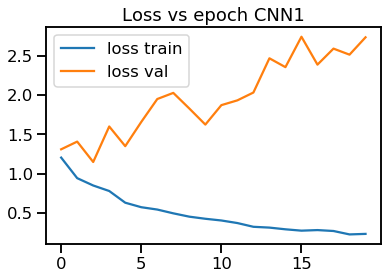

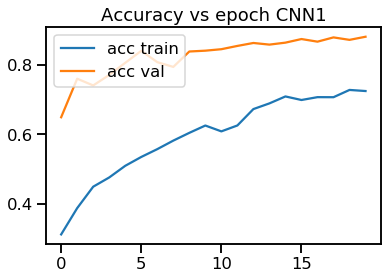


Accuracy sobre Test cnn1 : 0.8365520489872822
F1-score None sobre Test cnn1 : [0.90611542 0.13953488 0.02597403 0.67504488]
F1-score macro sobre Test cnn1 : 0.4366673026854231


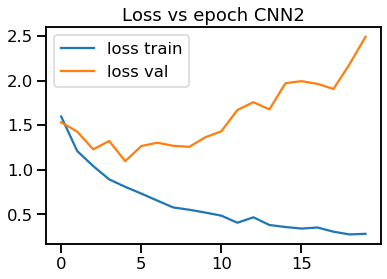

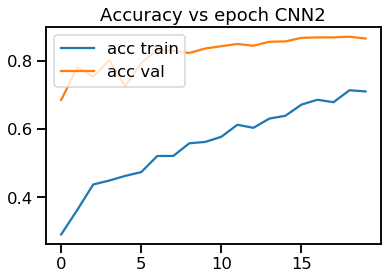


Accuracy sobre Test cnn2 : 0.8313707018370231
F1-score None sobre Test cnn2 : [0.90335418 0.01724138 0.05       0.65037594]
F1-score macro sobre Test cnn2 : 0.4052428744176216


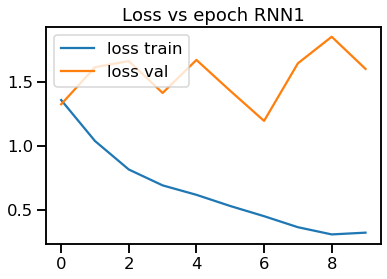

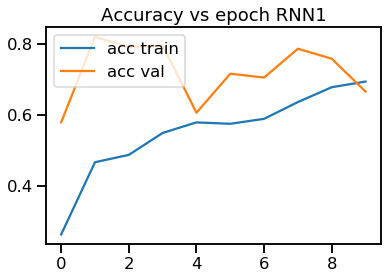


Accuracy sobre Test rnn1 : 0.5972680169571362
F1-score None sobre Test rnn1 : [0.70143312 0.20486556 0.32394366 0.78026906]
F1-score macro sobre Test rnn1 : 0.5026278495662841


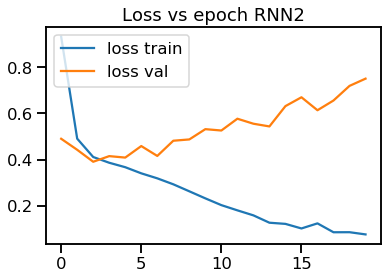

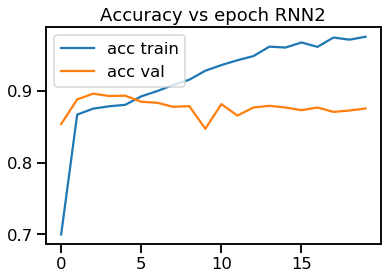


Accuracy sobre Test rnn2 : 0.8398492699010833
F1-score None sobre Test rnn2 : [0.90963495 0.         0.         0.73055556]
F1-score macro sobre Test rnn2 : 0.41004762617195295


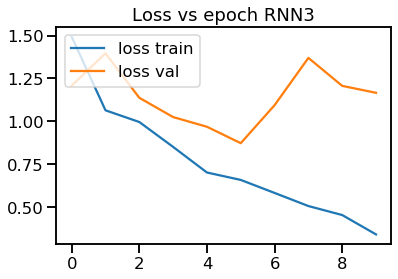

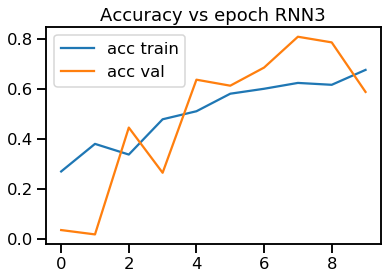


Accuracy sobre Test rnn3 : 0.5101271785209609
F1-score None sobre Test rnn3 : [0.6603928  0.15675676 0.15942029 0.64259928]
F1-score macro sobre Test rnn3 : 0.4047922808202099

Entrenando exec  5 



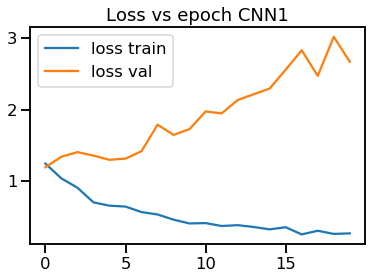

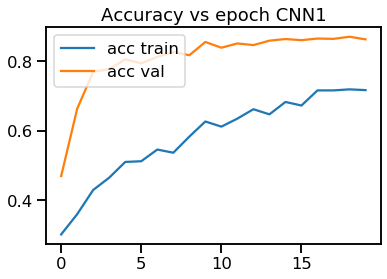


Accuracy sobre Test cnn1 : 0.8379651436646255
F1-score None sobre Test cnn1 : [0.90768791 0.144      0.05       0.66420664]
F1-score macro sobre Test cnn1 : 0.4414736382245217


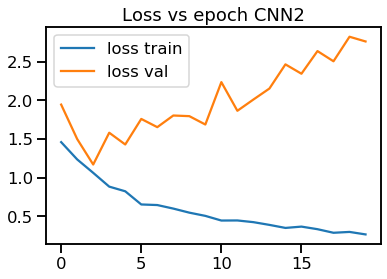

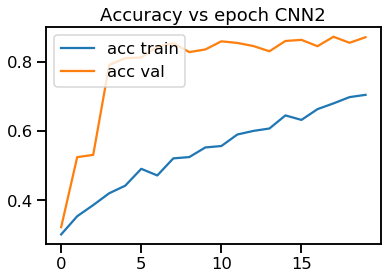


Accuracy sobre Test cnn2 : 0.8591615638247763
F1-score None sobre Test cnn2 : [0.92134831 0.15       0.07594937 0.76390977]
F1-score macro sobre Test cnn2 : 0.47780186403285985


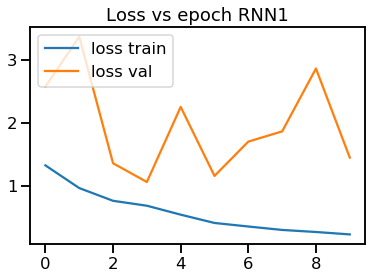

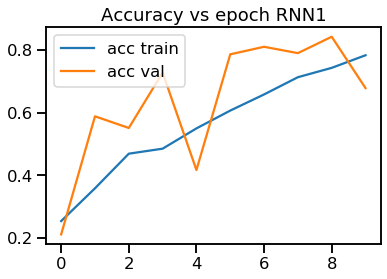


Accuracy sobre Test rnn1 : 0.6716910032972209
F1-score None sobre Test rnn1 : [0.79698167 0.23146944 0.42016807 0.70608696]
F1-score macro sobre Test rnn1 : 0.5386765347582275


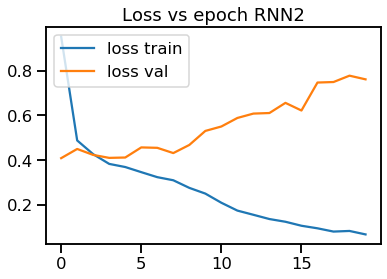

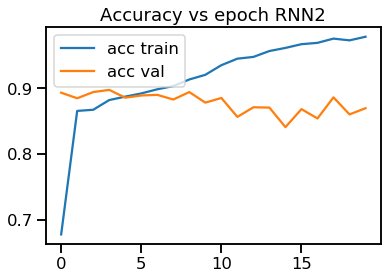


Accuracy sobre Test rnn2 : 0.8214790390956194
F1-score None sobre Test rnn2 : [0.89748312 0.06299213 0.12195122 0.70089859]
F1-score macro sobre Test rnn2 : 0.4458312629768222


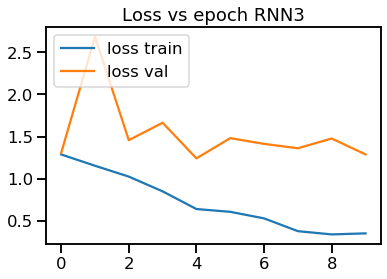

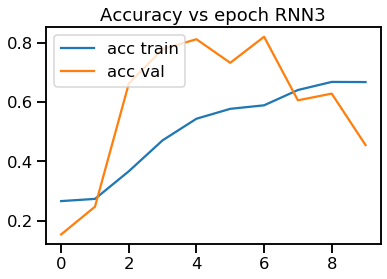


Accuracy sobre Test rnn3 : 0.4168629298162977
F1-score None sobre Test rnn3 : [0.5704287  0.13499112 0.16184971 0.52868852]
F1-score macro sobre Test rnn3 : 0.348989512747775


In [28]:

fs_macro={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
fs_none={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
accs={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
confusions={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}

for i in range(1,6):    
    print ("\nEntrenando exec ", i,"\n")
    cnn1=create_ccn1(x_train.shape[1:])
    trained, hist =train_model(cnn1, x_train, y_train, x_val, y_val, class_weights, e=20, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.0_cw/cnn1_'+str(i)+'-exec.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch CNN1")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch CNN1")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'cnn1')
    fs_macro['cnn1'].append(f1_ma_t)
    fs_none['cnn1'].append(f1_t)
    accs['cnn1'].append(acc_t)
    confusions['cnn1'].append(matriz_t)
    
    cnn2=create_cnn2(x_train.shape[1:])
    trained, hist =train_model(cnn2, x_train, y_train, x_val, y_val, class_weights, e=20, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.0_cw/cnn2_'+str(i)+'-exec.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch CNN2")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch CNN2")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'cnn2')
    fs_macro['cnn2'].append(f1_ma_t)
    fs_none['cnn2'].append(f1_t)
    accs['cnn2'].append(acc_t)
    confusions['cnn2'].append(matriz_t)
    
    rnn1=create_complex_GRU_2(128,64,"adam",x_train.shape[1:])
    trained, hist =train_model(rnn1, x_train, y_train, x_val, y_val, class_weights, e=10, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.0_cw/rnn1_'+str(i)+'-exec.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch RNN1")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch RNN1")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'rnn1')
    fs_macro['rnn1'].append(f1_ma_t)
    fs_none['rnn1'].append(f1_t)
    accs['rnn1'].append(acc_t)
    confusions['rnn1'].append(matriz_t)
    
    rnn2=create_complex_GRU_3(256,128,64,"adam",x_train.shape[1:])
    trained, hist =train_model(rnn2, x_train, y_train, x_val, y_val, class_weights, e=20, BS=32, verb=0, focal=False)
    trained.save('../new_glove_augmented/harassment_baselines/0.0_cw/rnn2_'+str(i)+'-exec.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch RNN2")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch RNN2")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'rnn2')
    fs_macro['rnn2'].append(f1_ma_t)
    fs_none['rnn2'].append(f1_t)
    accs['rnn2'].append(acc_t)
    confusions['rnn2'].append(matriz_t)
    
    rnn3=create_complex_GRU_3(256,128,64,"adam",x_train.shape[1:])
    trained, hist =train_model(rnn3, x_train, y_train, x_val, y_val, class_weights, e=10, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.0_cw/rnn3_'+str(i)+'-exec.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch RNN3")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch RNN3")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'rnn3')
    fs_macro['rnn3'].append(f1_ma_t)
    fs_none['rnn3'].append(f1_t)
    accs['rnn3'].append(acc_t)
    confusions['rnn3'].append(matriz_t)


In [29]:
for key in fs_none.keys():
    temp=np.zeros(4)
    for result in fs_none[key]:
        temp+=result
    print ("(0.0_cw) F1-score promedio para",key,":" ,temp/5)

print ("")
for key in fs_macro.keys():
    temp=np.sum(fs_macro[key])
    print ("(0.0_cw) F1-score macro promedio para",key,":" ,temp/5, "desvest: ",np.std(fs_macro[key]))

print ("")
for key in accs.keys():
    temp=np.sum(accs[key])
    print ("(0.0_cw) Accuracy promedio para",key,":" ,temp/5)

(0.0_cw) F1-score promedio para cnn1 : [0.90751286 0.13358362 0.04440794 0.67612377]
(0.0_cw) F1-score promedio para cnn2 : [0.90804195 0.08696518 0.09566123 0.66475318]
(0.0_cw) F1-score promedio para rnn1 : [0.82314642 0.28502584 0.34802493 0.73846929]
(0.0_cw) F1-score promedio para rnn2 : [0.90691475 0.06396081 0.08443601 0.7046785 ]
(0.0_cw) F1-score promedio para rnn3 : [0.72689935 0.20253931 0.23241618 0.57500364]

(0.0_cw) F1-score macro promedio para cnn1 : 0.4404070483793445 desvest:  0.004960280184229768
(0.0_cw) F1-score macro promedio para cnn2 : 0.43885538516245876 desvest:  0.025818535206055235
(0.0_cw) F1-score macro promedio para rnn1 : 0.5486666210665179 desvest:  0.037365838688411125
(0.0_cw) F1-score macro promedio para rnn2 : 0.43999751787786867 desvest:  0.021649750694173183
(0.0_cw) F1-score macro promedio para rnn3 : 0.4342146200683786 desvest:  0.06434459498163228

(0.0_cw) Accuracy promedio para cnn1 : 0.839189825718323
(0.0_cw) Accuracy promedio para cnn2 : 0

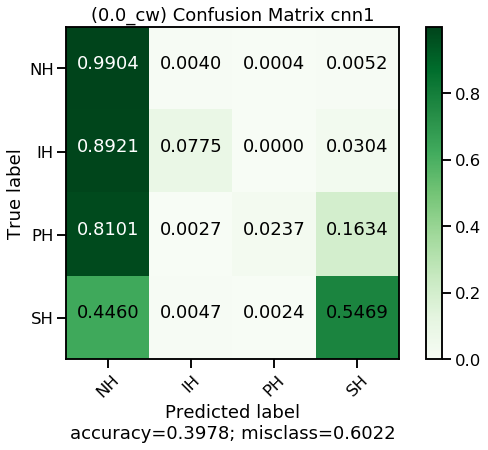

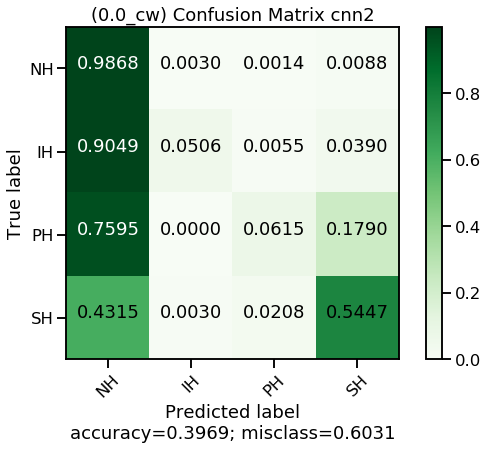

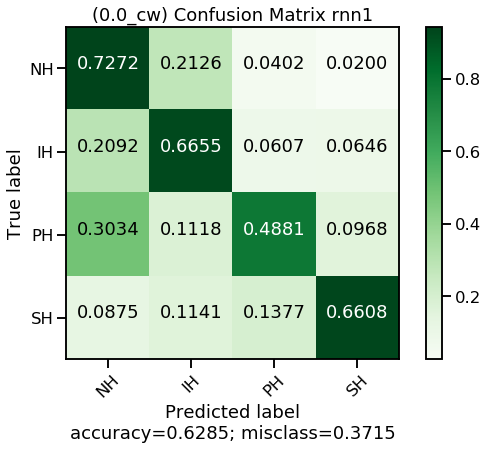

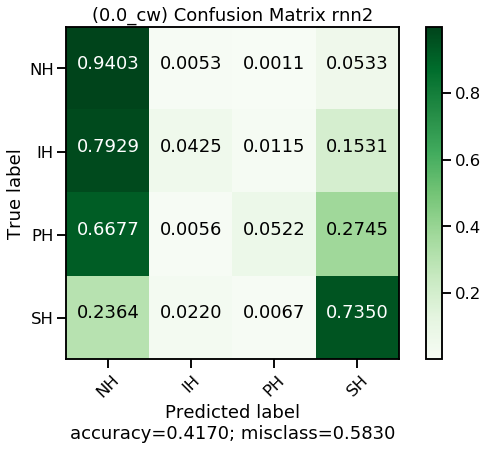

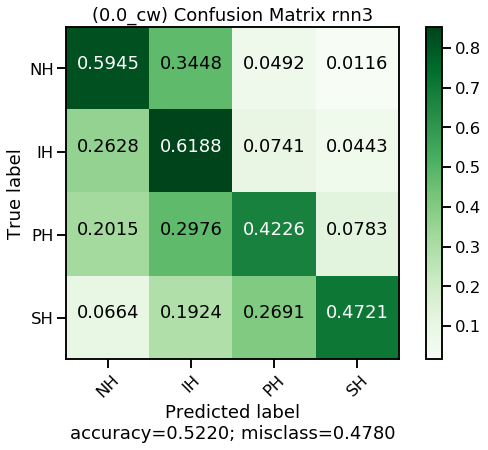

In [30]:
for key in confusions.keys():
    temp=np.sum(confusions[key], axis=0)/5.0
    plot_confusion_matrix(temp, ['NH','IH','PH','SH'], "(0.0_cw) Confusion Matrix "+str(key), cmap='Greens')

In [34]:
class_weights

array([ 0.43526359, 28.97272727, 20.96710526,  0.61715724])

In [32]:
"Listo - RESTART KERNEL PARA AUMENTO"

'Listo - RESTART KERNEL PARA AUMENTO'

# Aumento de datos 

### 0.15

In [25]:
prob= 0.15
TOPN = 1

fs_macro={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
fs_none={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
accs={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
confusions={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}

aum_weight=det_samples(train['Label'], dict_cl)

for i in range(1,6): 
    macro_augmented=[]
    print ("\n--------------------------------------------------------")
    print ("\nGenerando ejemplos en base a probabilidad --> ", prob,"\t\tEjecución",i)
    print ("--------------------------------------------------------")
    for clase in aum_weight:
        start_time=time.time()
        print ("\n\nGenerando", aum_weight[clase], "nuevos ejemplos para la clase", clase)
        muestras, dict_aumentos=aumentar_clase(clase, aum_weight[clase], tags, prob, TOPN)
        macro_augmented+=muestras
        print ("Resumen de modificaciones:", dict_aumentos)
        elapsed_time= time.time() - start_time
        print ("Este proceso tomó", elapsed_time, "seg")   

    macro_augmented = np.asarray(macro_augmented, dtype=object)
    np.random.shuffle(macro_augmented)
    np.save('../new_glove_augmented/harassment/Aumento_'+str(i)+'-run_'+str(prob)+'_app1_Top'+str(TOPN)+'.npy', macro_augmented)
    
    


--------------------------------------------------------

Generando ejemplos en base a probabilidad -->  0.15 		Ejecución 1
--------------------------------------------------------


Generando 1079 nuevos ejemplos para la clase SexualH
Consultando por la clase SexualH
Entrega label 3
Sentencia original:	 ['pics', 'mexican', 'school', 'girl', 'naked', 'melanie', 'fake', 'nude', 'photos', 'hardcore', 'slut', 'movies', 'alicia', 'moore', 'porn', 'star', 'toon', 'love']
Sentencia final: 3
['pics', 'mexican', 'school', 'girl', 'naked', 'melanie', 'fake', 'blackmail', 'photos', 'hardcore', 'slut', 'movies', 'alicia', 'moore', 'porn', 'star', 'toon', 'love']

Sentencia original:	 ['girl', 'dirty', 'quarterback', 'latino', 'pokemon', 'young', 'handjob', 'kissing', 'gangbang', 'w', 't', 'co']
Sentencia final: 3
['girl', 'player', 'quarterback', 'latino', 'pokemon', 'young', 'handjob', 'kissing', 'gangbang', 'w', 't', 'co']

Sentencia original:	 ['sexting', 'n', 'ngirl', 'daddy', 'n', 'nme', 'l

# terms modificados promedio 1.824181919023849 términos por sentencia
Largo de sentencia promedio 16.32140876317249 términos por sentencia
para esta ejecución se debiesen reemplazar 7336  de 49003 terminos
Resumen de modificaciones: {'NN': 4332, 'VBD': 155, 'VBZ': 240, 'JJ': 404, 'VBN': 267, 'NNS': 619, 'VB': 213, 'VBG': 348}
Este proceso tomó 22.107070684432983 seg

--------------------------------------------------------

Generando ejemplos en base a probabilidad -->  0.15 		Ejecución 2
--------------------------------------------------------


Generando 1079 nuevos ejemplos para la clase SexualH
Consultando por la clase SexualH
Entrega label 3
Sentencia original:	 ['pics', 'mexican', 'school', 'girl', 'naked', 'melanie', 'fake', 'nude', 'photos', 'hardcore', 'slut', 'movies', 'alicia', 'moore', 'porn', 'star', 'toon', 'love']
Sentencia final: 3
['pics', 'mexican', 'school', 'chick', 'naked', 'melanie', 'fake', 'nude', 'pics', 'hardcore', 'slut', 'movies', 'alicia', 'movie', 'porn', 

# terms modificados promedio 1.8397115917914586 términos por sentencia
Largo de sentencia promedio 16.314475873544094 términos por sentencia
para esta ejecución se debiesen reemplazar 7402  de 48917 terminos
Resumen de modificaciones: {'NN': 4340, 'VBG': 404, 'NNS': 617, 'JJ': 397, 'VBZ': 231, 'VB': 239, 'VBD': 141, 'VBN': 265}
Este proceso tomó 22.06242275238037 seg

--------------------------------------------------------

Generando ejemplos en base a probabilidad -->  0.15 		Ejecución 3
--------------------------------------------------------


Generando 1079 nuevos ejemplos para la clase SexualH
Consultando por la clase SexualH
Entrega label 3
Sentencia original:	 ['pics', 'mexican', 'school', 'girl', 'naked', 'melanie', 'fake', 'nude', 'photos', 'hardcore', 'slut', 'movies', 'alicia', 'moore', 'porn', 'star', 'toon', 'love']
Sentencia final: 3
['pics', 'mexican', 'school', 'girl', 'naked', 'melanie', 'fake', 'nude', 'photos', 'hardcore', 'porn', 'movies', 'alicia', 'moore', 'porn'

# terms modificados promedio 1.8183582917359955 términos por sentencia
Largo de sentencia promedio 16.351358846367166 términos por sentencia
para esta ejecución se debiesen reemplazar 7329  de 48897 terminos
Resumen de modificaciones: {'VBD': 130, 'NN': 4309, 'NNS': 601, 'VB': 229, 'VBN': 253, 'JJ': 410, 'VBZ': 243, 'VBG': 382}
Este proceso tomó 22.44710111618042 seg

--------------------------------------------------------

Generando ejemplos en base a probabilidad -->  0.15 		Ejecución 4
--------------------------------------------------------


Generando 1079 nuevos ejemplos para la clase SexualH
Consultando por la clase SexualH
Entrega label 3
Sentencia original:	 ['sexting', 'n', 'ngirl', 'daddy', 'n', 'nme', 'listen', 'bitch', 'gonna', 'watch', 'these', 'what']
Sentencia final: 3
['sexting', 'n', 'ngirl', 'daddy', 'n', 'nme', 'fuck', 'bitch', 'gonna', 'watch', 'these', 'what']

Sentencia original:	 ['museum', 'slut', 'if', 'you', 'know', 'somewhere', 'we', 'can', 'do', 'it', 'the

# terms modificados promedio 1.8419301164725457 términos por sentencia
Largo de sentencia promedio 16.251802551303385 términos por sentencia
para esta ejecución se debiesen reemplazar 7401  de 48649 terminos
Resumen de modificaciones: {'NN': 4324, 'VBG': 353, 'JJ': 430, 'NNS': 639, 'VB': 233, 'VBN': 244, 'VBZ': 250, 'VBD': 169}
Este proceso tomó 22.13561224937439 seg

--------------------------------------------------------

Generando ejemplos en base a probabilidad -->  0.15 		Ejecución 5
--------------------------------------------------------


Generando 1079 nuevos ejemplos para la clase SexualH
Consultando por la clase SexualH
Entrega label 3
Sentencia original:	 ['pics', 'mexican', 'school', 'girl', 'naked', 'melanie', 'fake', 'nude', 'photos', 'hardcore', 'slut', 'movies', 'alicia', 'moore', 'porn', 'star', 'toon', 'love']
Sentencia final: 3
['pics', 'mexican', 'school', 'girl', 'naked', 'melanie', 'fake', 'photo', 'photos', 'hardcore', 'porn', 'tits', 'alicia', 'movie', 'porn',

# terms modificados promedio 1.816971713810316 términos por sentencia
Largo de sentencia promedio 16.32667775929007 términos por sentencia
para esta ejecución se debiesen reemplazar 7299  de 49187 terminos
Resumen de modificaciones: {'NNS': 602, 'JJ': 414, 'NN': 4312, 'VBZ': 246, 'VBN': 238, 'VBD': 141, 'VB': 214, 'VBG': 385}
Este proceso tomó 24.37745237350464 seg


In [26]:
M_GLOVE_space.shape

(14642, 200)

In [27]:
prob= 0.5
TOPN = 1

fs_macro={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
fs_none={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
accs={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
confusions={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}

aum_weight=det_samples(train['Label'], dict_cl)

for i in range(1,6): 
    macro_augmented=[]
    print ("\n--------------------------------------------------------")
    print ("\nGenerando ejemplos en base a probabilidad --> ", prob,"\t\tEjecución",i)
    print ("--------------------------------------------------------")
    for clase in aum_weight:
        start_time=time.time()
        print ("\n\nGenerando", aum_weight[clase], "nuevos ejemplos para la clase", clase)
        muestras, dict_aumentos=aumentar_clase(clase, aum_weight[clase], tags, prob, TOPN)
        macro_augmented+=muestras
        print ("Resumen de modificaciones:", dict_aumentos)
        elapsed_time= time.time() - start_time
        print ("Este proceso tomó", elapsed_time, "seg")   

    macro_augmented = np.asarray(macro_augmented, dtype=object)
    np.random.shuffle(macro_augmented)
    np.save('../new_glove_augmented/harassment/Aumento_'+str(i)+'-run_'+str(prob)+'_app1_Top'+str(TOPN)+'.npy', macro_augmented)
    
    


--------------------------------------------------------

Generando ejemplos en base a probabilidad -->  0.5 		Ejecución 1
--------------------------------------------------------


Generando 1079 nuevos ejemplos para la clase SexualH
Consultando por la clase SexualH
Entrega label 3
Sentencia original:	 ['pics', 'mexican', 'school', 'girl', 'naked', 'melanie', 'fake', 'nude', 'photos', 'hardcore', 'slut', 'movies', 'alicia', 'moore', 'porn', 'star', 'toon', 'love']
Sentencia final: 3
['pics', 'mexican', 'shit', 'chick', 'naked', 'melanie', 'fake', 'photo', 'photos', 'hardcore', 'porn', 'carmen', 'alicia', 'movie', 'porn', 'star', 'toon', 'love']

Sentencia original:	 ['girl', 'dirty', 'quarterback', 'latino', 'pokemon', 'young', 'handjob', 'kissing', 'gangbang', 'w', 't', 'co']
Sentencia final: 3
['look', 'dirty', 'player', 'latino', 'pokemon', 'young', 'handjob', 'kissing', 'kiss', 'w', 't', 'co']

Sentencia original:	 ['sexting', 'n', 'ngirl', 'daddy', 'n', 'nme', 'listen', 'bitch',

# terms modificados promedio 4.40904048807543 términos por sentencia
Largo de sentencia promedio 15.091514143094843 términos por sentencia
para esta ejecución se debiesen reemplazar 17663  de 35282 terminos
Resumen de modificaciones: {'NNS': 1519, 'NN': 10401, 'VBD': 349, 'VBG': 922, 'VBZ': 601, 'VBN': 592, 'VB': 543, 'JJ': 972}
Este proceso tomó 41.507718324661255 seg

--------------------------------------------------------

Generando ejemplos en base a probabilidad -->  0.5 		Ejecución 2
--------------------------------------------------------


Generando 1079 nuevos ejemplos para la clase SexualH
Consultando por la clase SexualH
Entrega label 3
Sentencia original:	 ['pics', 'mexican', 'school', 'girl', 'naked', 'melanie', 'fake', 'nude', 'photos', 'hardcore', 'slut', 'movies', 'alicia', 'moore', 'porn', 'star', 'toon', 'love']
Sentencia final: 3
['pics', 'mexican', 'school', 'chick', 'naked', 'melanie', 'fake', 'blonde', 'photos', 'hardcore', 'slut', 'tits', 'alicia', 'moore', 'kev

# terms modificados promedio 4.439267886855241 términos por sentencia
Largo de sentencia promedio 15.147254575707155 términos por sentencia
para esta ejecución se debiesen reemplazar 17834  de 35531 terminos
Resumen de modificaciones: {'NN': 10547, 'VBD': 358, 'NNS': 1473, 'VBG': 934, 'JJ': 961, 'VBZ': 574, 'VB': 570, 'VBN': 591}
Este proceso tomó 41.766433000564575 seg

--------------------------------------------------------

Generando ejemplos en base a probabilidad -->  0.5 		Ejecución 3
--------------------------------------------------------


Generando 1079 nuevos ejemplos para la clase SexualH
Consultando por la clase SexualH
Entrega label 3
Sentencia original:	 ['pics', 'mexican', 'school', 'girl', 'naked', 'melanie', 'fake', 'nude', 'photos', 'hardcore', 'slut', 'movies', 'alicia', 'moore', 'porn', 'star', 'toon', 'love']
Sentencia final: 3
['pics', 'old', 'chick', 'girl', 'lesbian', 'melanie', 'topless', 'girl', 'tits', 'hardcore', 'slut', 'myers', 'alicia', 'movie', 'porn',

# terms modificados promedio 4.389351081530782 términos por sentencia
Largo de sentencia promedio 15.113976705490849 términos por sentencia
para esta ejecución se debiesen reemplazar 17641  de 35370 terminos
Resumen de modificaciones: {'NN': 10401, 'VBG': 907, 'VBD': 368, 'NNS': 1488, 'JJ': 949, 'VBZ': 581, 'VBN': 581, 'VB': 553}
Este proceso tomó 43.107911586761475 seg

--------------------------------------------------------

Generando ejemplos en base a probabilidad -->  0.5 		Ejecución 4
--------------------------------------------------------


Generando 1079 nuevos ejemplos para la clase SexualH
Consultando por la clase SexualH
Entrega label 3
Sentencia original:	 ['pics', 'mexican', 'school', 'girl', 'naked', 'melanie', 'fake', 'nude', 'photos', 'hardcore', 'slut', 'movies', 'alicia', 'moore', 'porn', 'star', 'toon', 'love']
Sentencia final: 3
['pics', 'old', 'school', 'girl', 'naked', 'melanie', 'fake', 'nude', 'photos', 'hardcore', 'porno', 'myers', 'alicia', 'movie', 'porn', 

# terms modificados promedio 4.3682750970604545 términos por sentencia
Largo de sentencia promedio 15.096228508042152 términos por sentencia
para esta ejecución se debiesen reemplazar 17552  de 35399 terminos
Resumen de modificaciones: {'NNS': 1448, 'VBG': 909, 'NN': 10337, 'JJ': 970, 'VBZ': 604, 'VB': 509, 'VBN': 603, 'VBD': 372}
Este proceso tomó 42.85252237319946 seg

--------------------------------------------------------

Generando ejemplos en base a probabilidad -->  0.5 		Ejecución 5
--------------------------------------------------------


Generando 1079 nuevos ejemplos para la clase SexualH
Consultando por la clase SexualH
Entrega label 3
Sentencia original:	 ['pics', 'mexican', 'school', 'girl', 'naked', 'melanie', 'fake', 'nude', 'photos', 'hardcore', 'slut', 'movies', 'alicia', 'moore', 'porn', 'star', 'toon', 'love']
Sentencia final: 3
['meals', 'old', 'school', 'girl', 'naked', 'melanie', 'fake', 'porno', 'pics', 'hardcore', 'milf', 'myers', 'alicia', 'movie', 'porn', '

# terms modificados promedio 4.424847476428175 términos por sentencia
Largo de sentencia promedio 15.130615640599002 términos por sentencia
para esta ejecución se debiesen reemplazar 17809  de 35450 terminos
Resumen de modificaciones: {'NN': 10462, 'JJ': 1022, 'NNS': 1439, 'VBG': 962, 'VBZ': 581, 'VB': 526, 'VBD': 357, 'VBN': 607}
Este proceso tomó 39.76815629005432 seg


In [28]:
prob= 0.85
TOPN = 1

fs_macro={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
fs_none={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
accs={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
confusions={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}

aum_weight=det_samples(train['Label'], dict_cl)

for i in range(1,6): 
    macro_augmented=[]
    print ("\n--------------------------------------------------------")
    print ("\nGenerando ejemplos en base a probabilidad --> ", prob,"\t\tEjecución",i)
    print ("--------------------------------------------------------")
    for clase in aum_weight:
        start_time=time.time()
        print ("\n\nGenerando", aum_weight[clase], "nuevos ejemplos para la clase", clase)
        muestras, dict_aumentos=aumentar_clase(clase, aum_weight[clase], tags, prob, TOPN)
        macro_augmented+=muestras
        print ("Resumen de modificaciones:", dict_aumentos)
        elapsed_time= time.time() - start_time
        print ("Este proceso tomó", elapsed_time, "seg")   

    macro_augmented = np.asarray(macro_augmented, dtype=object)
    np.random.shuffle(macro_augmented)
    np.save('../new_glove_augmented/harassment/Aumento_'+str(i)+'-run_'+str(prob)+'_app1_Top'+str(TOPN)+'.npy', macro_augmented)
    
    


--------------------------------------------------------

Generando ejemplos en base a probabilidad -->  0.85 		Ejecución 1
--------------------------------------------------------


Generando 1079 nuevos ejemplos para la clase SexualH
Consultando por la clase SexualH
Entrega label 3
Sentencia original:	 ['pics', 'mexican', 'school', 'girl', 'naked', 'melanie', 'fake', 'nude', 'photos', 'hardcore', 'slut', 'movies', 'alicia', 'moore', 'porn', 'star', 'toon', 'love']
Sentencia final: 3
['meals', 'mexican', 'chick', 'chick', 'normal', 'melanie', 'topless', 'photo', 'tits', 'porn', 'porn', 'myers', 'alicia', 'movie', 'kevin', 'wife', 'toon', 'jeffree']

Sentencia original:	 ['girl', 'dirty', 'quarterback', 'latino', 'pokemon', 'young', 'handjob', 'kissing', 'gangbang', 'w', 't', 'co']
Sentencia final: 3
['guy', 'underw', 'quarterback', 'latino', 'pokemon', 'anal', 'handjob', 'pegging', 'gangbang', 'scene', 'positio', 'co']

Sentencia original:	 ['sexting', 'n', 'ngirl', 'daddy', 'n', 'nm

# terms modificados promedio 7.332778702163061 términos por sentencia
Largo de sentencia promedio 14.96561286744315 términos por sentencia
para esta ejecución se debiesen reemplazar 29451  de 34752 terminos
Resumen de modificaciones: {'NNS': 2425, 'NN': 17348, 'VBG': 1597, 'VBD': 582, 'JJ': 1609, 'VBZ': 958, 'VB': 909, 'VBN': 1014}
Este proceso tomó 61.40310478210449 seg

--------------------------------------------------------

Generando ejemplos en base a probabilidad -->  0.85 		Ejecución 2
--------------------------------------------------------


Generando 1079 nuevos ejemplos para la clase SexualH
Consultando por la clase SexualH
Entrega label 3
Sentencia original:	 ['pics', 'mexican', 'school', 'girl', 'naked', 'melanie', 'fake', 'nude', 'photos', 'hardcore', 'slut', 'movies', 'alicia', 'moore', 'porn', 'star', 'toon', 'love']
Sentencia final: 3
['pictures', 'old', 'chick', 'chick', 'bad', 'melanie', 'topless', 'porno', 'pics', 'nsfw', 'porn', 'myers', 'alicia', 'movie', 'kevin'

# terms modificados promedio 7.3596783139212425 términos por sentencia
Largo de sentencia promedio 14.963671658347199 términos por sentencia
para esta ejecución se debiesen reemplazar 29581  de 34739 terminos
Resumen de modificaciones: {'NNS': 2472, 'NN': 17411, 'VBG': 1557, 'VBD': 578, 'JJ': 1589, 'VBZ': 986, 'VB': 930, 'VBN': 1016}
Este proceso tomó 61.37728786468506 seg

--------------------------------------------------------

Generando ejemplos en base a probabilidad -->  0.85 		Ejecución 3
--------------------------------------------------------


Generando 1079 nuevos ejemplos para la clase SexualH
Consultando por la clase SexualH
Entrega label 3
Sentencia original:	 ['pics', 'mexican', 'school', 'girl', 'naked', 'melanie', 'fake', 'nude', 'photos', 'hardcore', 'slut', 'movies', 'alicia', 'moore', 'porn', 'star', 'toon', 'love']
Sentencia final: 3
['pics', 'bad', 'topless', 'chick', 'dead', 'melanie', 'topless', 'blonde', 'photos', 'milf', 'music', 'shes', 'alicia', 'moore', 're

# terms modificados promedio 7.378813089295618 términos por sentencia
Largo de sentencia promedio 14.968663338879646 términos por sentencia
para esta ejecución se debiesen reemplazar 29643  de 34763 terminos
Resumen de modificaciones: {'NNS': 2440, 'NN': 17452, 'VBG': 1561, 'JJ': 1623, 'VB': 918, 'VBN': 1041, 'VBZ': 982, 'VBD': 591}
Este proceso tomó 63.0104284286499 seg

--------------------------------------------------------

Generando ejemplos en base a probabilidad -->  0.85 		Ejecución 4
--------------------------------------------------------


Generando 1079 nuevos ejemplos para la clase SexualH
Consultando por la clase SexualH
Entrega label 3
Sentencia original:	 ['pics', 'mexican', 'school', 'girl', 'naked', 'melanie', 'fake', 'nude', 'photos', 'hardcore', 'slut', 'movies', 'alicia', 'moore', 'porn', 'star', 'toon', 'love']
Sentencia final: 3
['pictures', 'bad', 'chick', 'girl', 'bad', 'melanie', 'sexy', 'photo', 'tits', 'porn', 'porn', 'tits', 'alicia', 'movie', 'renee', 'po

# terms modificados promedio 7.362451469772601 términos por sentencia
Largo de sentencia promedio 14.963671658347199 términos por sentencia
para esta ejecución se debiesen reemplazar 29599  de 34739 terminos
Resumen de modificaciones: {'NN': 17421, 'VBG': 1573, 'VBD': 598, 'NNS': 2452, 'JJ': 1604, 'VBZ': 996, 'VBN': 985, 'VB': 920}
Este proceso tomó 64.07149171829224 seg

--------------------------------------------------------

Generando ejemplos en base a probabilidad -->  0.85 		Ejecución 5
--------------------------------------------------------


Generando 1079 nuevos ejemplos para la clase SexualH
Consultando por la clase SexualH
Entrega label 3
Sentencia original:	 ['pics', 'mexican', 'school', 'girl', 'naked', 'melanie', 'fake', 'nude', 'photos', 'hardcore', 'slut', 'movies', 'alicia', 'moore', 'porn', 'star', 'toon', 'love']
Sentencia final: 3
['girls', 'old', 'school', 'girl', 'lesbian', 'melanie', 'topless', 'photo', 'tits', 'porn', 'milf', 'movies', 'alicia', 'movie', 'rene

# terms modificados promedio 7.3754853022739875 términos por sentencia
Largo de sentencia promedio 14.96561286744315 términos por sentencia
para esta ejecución se debiesen reemplazar 29580  de 34752 terminos
Resumen de modificaciones: {'NNS': 2468, 'NN': 17468, 'VBG': 1544, 'VBD': 613, 'JJ': 1608, 'VBZ': 986, 'VB': 904, 'VBN': 1005}
Este proceso tomó 64.5429527759552 seg


In [30]:
"listo - RESTAR KERNEL Y NO NORM MATRIX "

'listo - RESTAR KERNEL Y NO NORM MATRIX '

## Baselines 

In [17]:
del embeddings_index

### 0.15

----------------------- Entrenando running  1 -----------------------
Pesos de clases: [1. 1. 1. 1.]


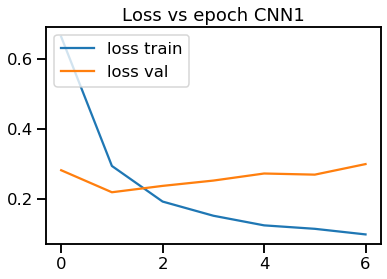

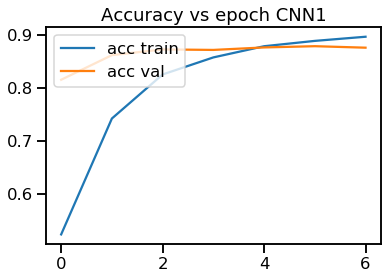


Accuracy sobre Test cnn1 : 0.8516250588789449
F1-score None sobre Test cnn1 : [0.91909385 0.03669725 0.02564103 0.73636364]
F1-score macro sobre Test cnn1 : 0.4294489402109425


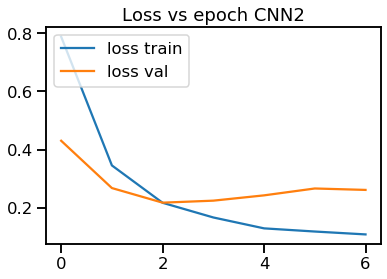

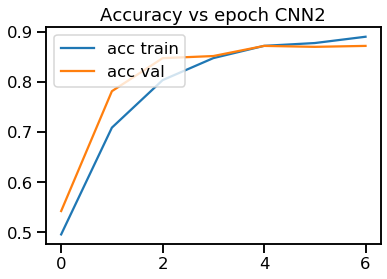


Accuracy sobre Test cnn2 : 0.844559585492228
F1-score None sobre Test cnn2 : [0.91270784 0.07633588 0.02597403 0.74626866]
F1-score macro sobre Test cnn2 : 0.4403215997582123


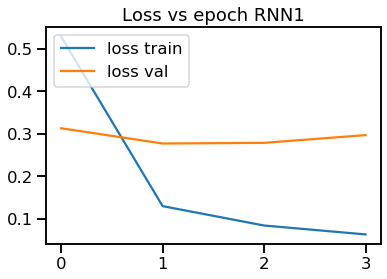

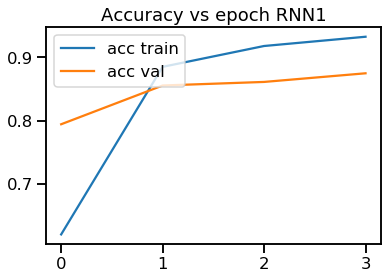


Accuracy sobre Test rnn1 : 0.8469147432878003
F1-score None sobre Test rnn1 : [0.91612903 0.1459854  0.06666667 0.76963351]
F1-score macro sobre Test rnn1 : 0.47460365205949717


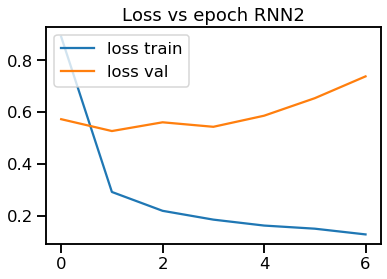

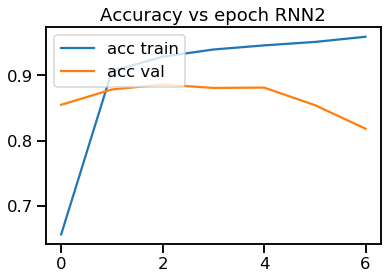


Accuracy sobre Test rnn2 : 0.7809703250117758
F1-score None sobre Test rnn2 : [0.87330466 0.13333333 0.26785714 0.66809882]
F1-score macro sobre Test rnn2 : 0.4856484897265137


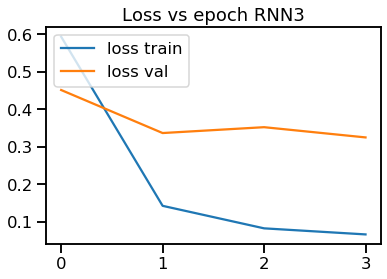

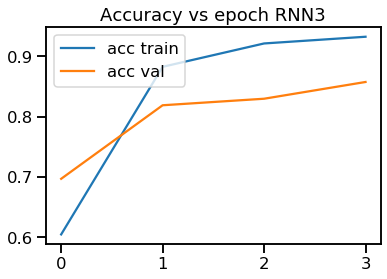


Accuracy sobre Test rnn3 : 0.832312764955252
F1-score None sobre Test rnn3 : [0.90560101 0.25806452 0.23728814 0.78035471]
F1-score macro sobre Test rnn3 : 0.5453270913324255
----------------------- Entrenando running  2 -----------------------
Pesos de clases: [1. 1. 1. 1.]


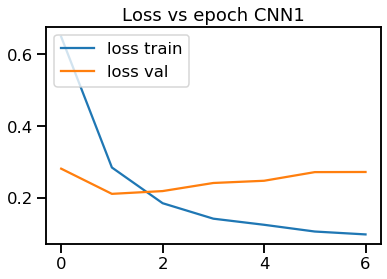

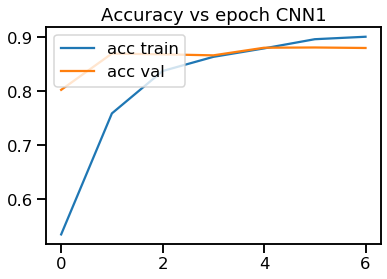


Accuracy sobre Test cnn1 : 0.8516250588789449
F1-score None sobre Test cnn1 : [0.91350882 0.03603604 0.09876543 0.74706868]
F1-score macro sobre Test cnn1 : 0.44884474188258555


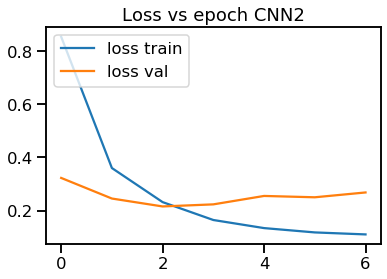

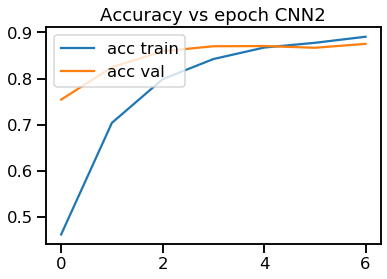


Accuracy sobre Test cnn2 : 0.8360810174281676
F1-score None sobre Test cnn2 : [0.90604221 0.11764706 0.         0.69565217]
F1-score macro sobre Test cnn2 : 0.429835360366855


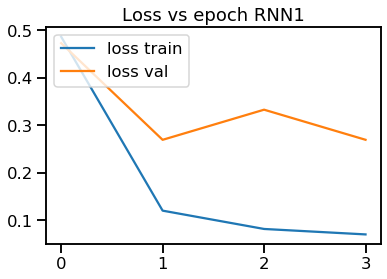

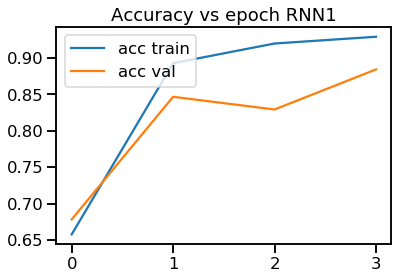


Accuracy sobre Test rnn1 : 0.8520960904380593
F1-score None sobre Test rnn1 : [0.91987768 0.13138686 0.17021277 0.77315436]
F1-score macro sobre Test rnn1 : 0.4986579163821004


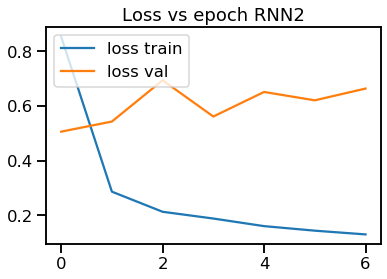

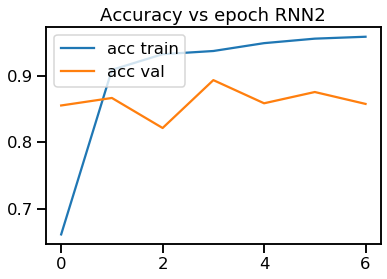


Accuracy sobre Test rnn2 : 0.8341968911917098
F1-score None sobre Test rnn2 : [0.90875462 0.         0.10526316 0.73091364]
F1-score macro sobre Test rnn2 : 0.4362328559670969


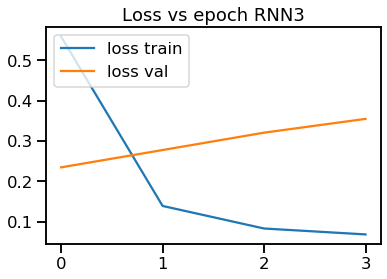

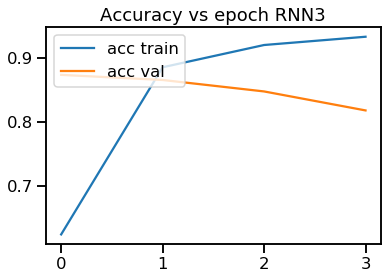


Accuracy sobre Test rnn3 : 0.7894488930758361
F1-score None sobre Test rnn3 : [0.88250653 0.26666667 0.04347826 0.70559006]
F1-score macro sobre Test rnn3 : 0.4745603792657942
----------------------- Entrenando running  3 -----------------------
Pesos de clases: [1. 1. 1. 1.]


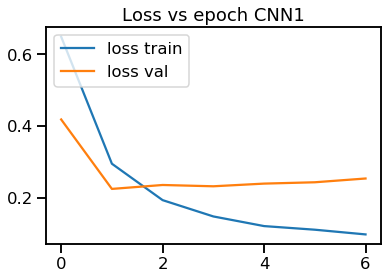

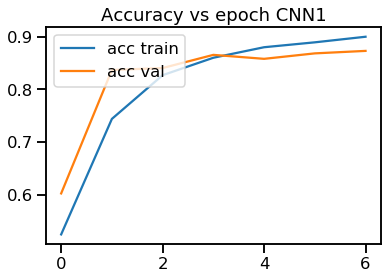


Accuracy sobre Test cnn1 : 0.8365520489872822
F1-score None sobre Test cnn1 : [0.90755322 0.14864865 0.02597403 0.7027027 ]
F1-score macro sobre Test cnn1 : 0.44621964995980745


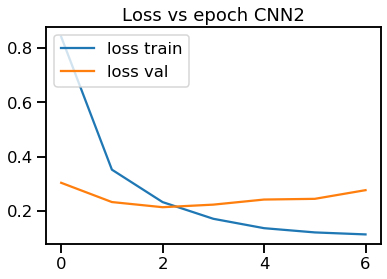

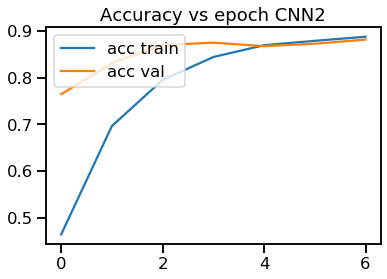


Accuracy sobre Test cnn2 : 0.8544512482336316
F1-score None sobre Test cnn2 : [0.91935007 0.05405405 0.02597403 0.75482912]
F1-score macro sobre Test cnn2 : 0.4385518193029261


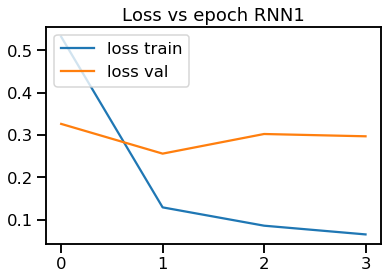

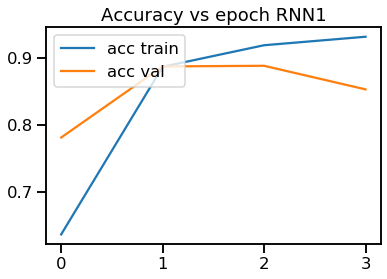


Accuracy sobre Test rnn1 : 0.8370230805463966
F1-score None sobre Test rnn1 : [0.91195551 0.25592417 0.20338983 0.77058824]
F1-score macro sobre Test rnn1 : 0.5354644376959646


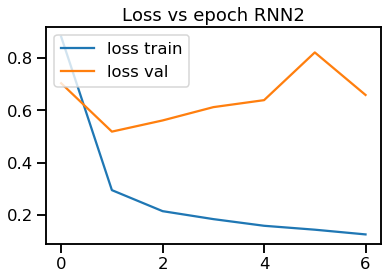

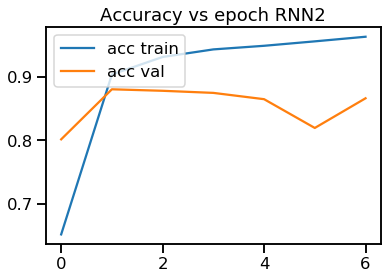


Accuracy sobre Test rnn2 : 0.8341968911917098
F1-score None sobre Test rnn2 : [0.9093702  0.09836066 0.15217391 0.71557272]
F1-score macro sobre Test rnn2 : 0.4688693710116697


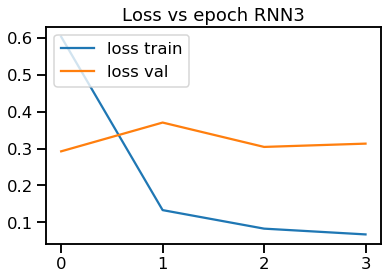

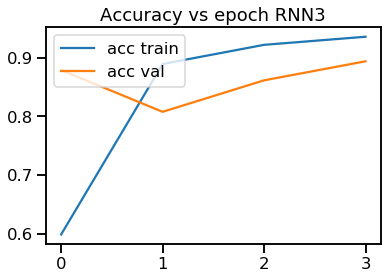


Accuracy sobre Test rnn3 : 0.8591615638247763
F1-score None sobre Test rnn3 : [0.91896759 0.06722689 0.0952381  0.80168776]
F1-score macro sobre Test rnn3 : 0.47078008418557304
----------------------- Entrenando running  4 -----------------------
Pesos de clases: [1. 1. 1. 1.]


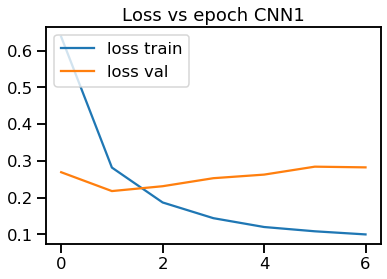

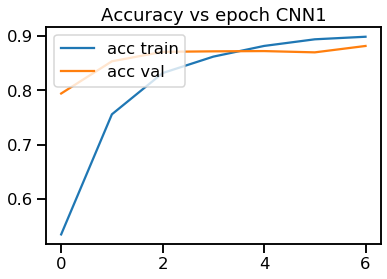


Accuracy sobre Test cnn1 : 0.8483278379651437
F1-score None sobre Test cnn1 : [0.91565552 0.05042017 0.02531646 0.74738416]
F1-score macro sobre Test cnn1 : 0.4346940746509418


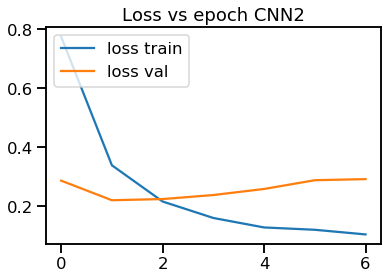

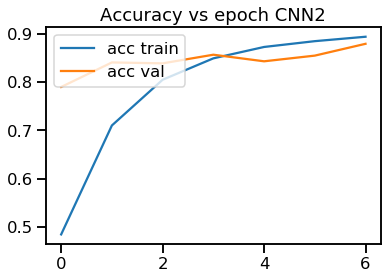


Accuracy sobre Test cnn2 : 0.8440885539331136
F1-score None sobre Test cnn2 : [0.91013494 0.03571429 0.02597403 0.71080139]
F1-score macro sobre Test cnn2 : 0.42065616163980696


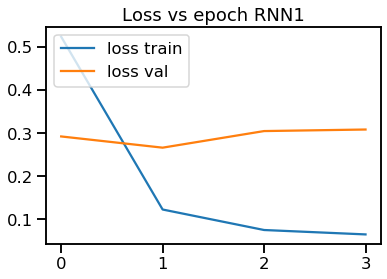

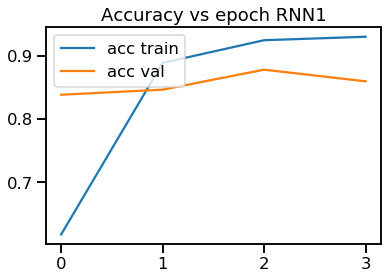


Accuracy sobre Test rnn1 : 0.8450306170513424
F1-score None sobre Test rnn1 : [0.91728395 0.03149606 0.33093525 0.76486486]
F1-score macro sobre Test rnn1 : 0.511145032568209


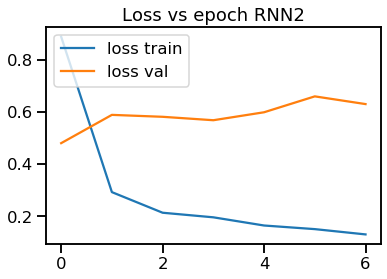

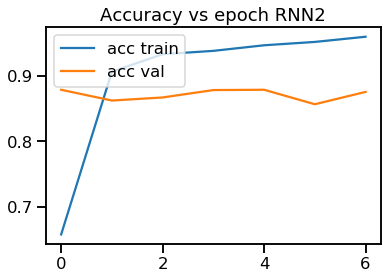


Accuracy sobre Test rnn2 : 0.843617522373999
F1-score None sobre Test rnn2 : [0.91262717 0.13740458 0.06896552 0.74052478]
F1-score macro sobre Test rnn2 : 0.46488051202370595


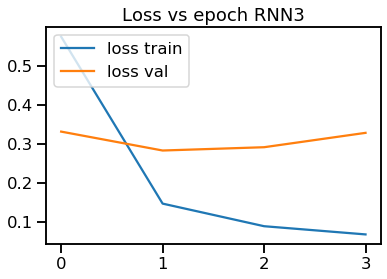

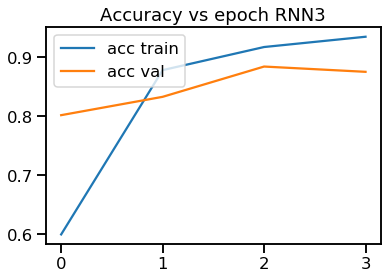


Accuracy sobre Test rnn3 : 0.8520960904380593
F1-score None sobre Test rnn3 : [0.92048478 0.05084746 0.25352113 0.76616915]
F1-score macro sobre Test rnn3 : 0.4977556288604602
----------------------- Entrenando running  5 -----------------------
Pesos de clases: [1. 1. 1. 1.]


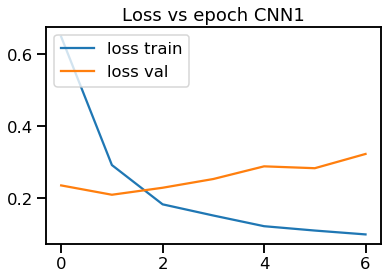

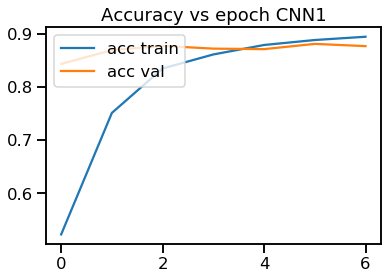


Accuracy sobre Test cnn1 : 0.8450306170513424
F1-score None sobre Test cnn1 : [0.91149425 0.         0.         0.7135506 ]
F1-score macro sobre Test cnn1 : 0.4062612133041541


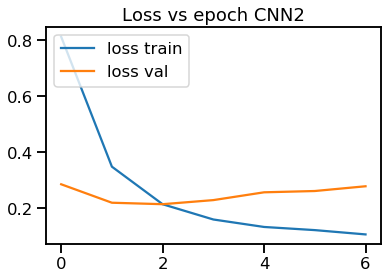

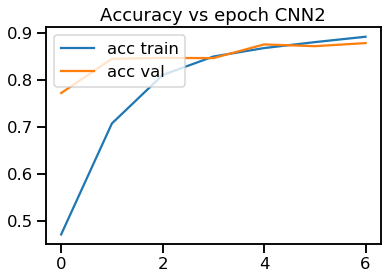


Accuracy sobre Test cnn2 : 0.8563353744700894
F1-score None sobre Test cnn2 : [0.92156863 0.06722689 0.07594937 0.76246334]
F1-score macro sobre Test cnn2 : 0.4568020571010987


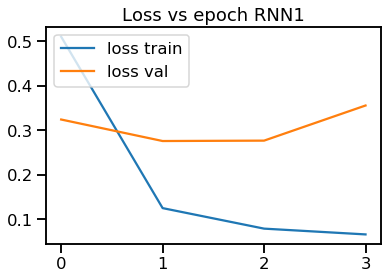

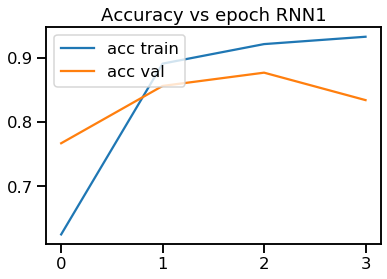


Accuracy sobre Test rnn1 : 0.7983984926990109
F1-score None sobre Test rnn1 : [0.88823529 0.03603604 0.22018349 0.66666667]
F1-score macro sobre Test rnn1 : 0.45278037076472044


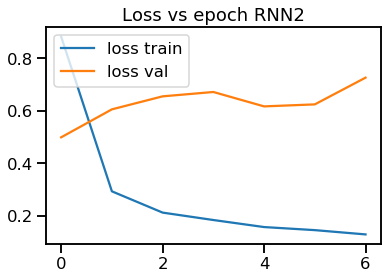

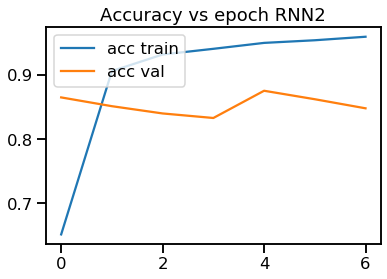


Accuracy sobre Test rnn2 : 0.825247291568535
F1-score None sobre Test rnn2 : [0.90374497 0.13422819 0.12844037 0.72655218]
F1-score macro sobre Test rnn2 : 0.47324142628645427


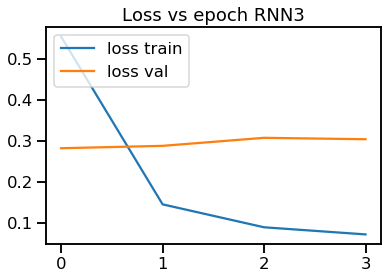

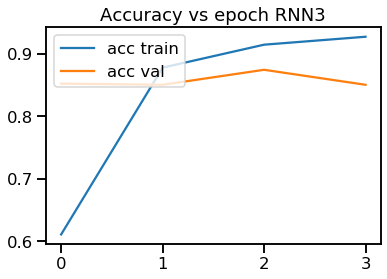


Accuracy sobre Test rnn3 : 0.8389072067828545
F1-score None sobre Test rnn3 : [0.90948543 0.23744292 0.27868852 0.7982327 ]
F1-score macro sobre Test rnn3 : 0.5559623932446631


In [29]:
prob=0.15 
TOPN=1

fs_macro={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
fs_none={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
accs={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
confusions={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}


for i in range(1,6):
    print ("----------------------- Entrenando running ", i,"-----------------------")
    macro_augmented=np.load('../new_glove_augmented/harassment/Aumento_'+str(i)+'-run_'+str(prob)+'_app1_Top'+str(TOPN)+'.npy', allow_pickle=True)
    
    ids_train=macro_augmented[:,0]
    tws_train=macro_augmented[:,1]
    labels_train=macro_augmented[:,2]
    class_weights= compute_class_weight('balanced', np.unique(labels_train), labels_train)
    print ("Pesos de clases:", class_weights)

    etiq=labels_train.copy()
    sentences = tws_train
    n_labels = np.array(etiq)
    y_train=to_categorical(n_labels,num_classes=4)
    
    input_ids = []
    for sent in sentences:
        encoded_tok=[]
        for wd in sent:
            try: 
                encoded_tok.append(Word2Index_valid[wd])
            except: 
                continue 
        input_ids.append(encoded_tok)
    
    input_ids = pad_sequences(input_ids, maxlen=MAX_LEN, dtype="long", 
                              value=0, truncating="post", padding="post")
    
    shape=np.asarray(input_ids).shape
    x_train=np.zeros((shape[0], shape[1], g_dim))
    j=0
    for in_id in input_ids:
        x_train[j]=M_GLOVE_space[in_id]
        j+=1
        
    ###########################################################
    ############################################################
    ############################################################
    
    cnn1=create_ccn1(x_train.shape[1:])
    trained, hist =train_model(cnn1, x_train, y_train, x_val, y_val, class_weights, e=7, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.15/cnn1_'+str(i)+'-exec_app1_Top_'+str(TOPN)+'_7e.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch CNN1")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch CNN1")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'cnn1')
    fs_macro['cnn1'].append(f1_ma_t)
    fs_none['cnn1'].append(f1_t)
    accs['cnn1'].append(acc_t)
    confusions['cnn1'].append(matriz_t)
    
    cnn2=create_cnn2(x_train.shape[1:])
    trained, hist =train_model(cnn2, x_train, y_train, x_val, y_val, class_weights, e=7, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.15/cnn2_'+str(i)+'-exec_app1_Top_'+str(TOPN)+'_7e.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch CNN2")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch CNN2")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'cnn2')
    fs_macro['cnn2'].append(f1_ma_t)
    fs_none['cnn2'].append(f1_t)
    accs['cnn2'].append(acc_t)
    confusions['cnn2'].append(matriz_t)
    
    rnn1=create_complex_GRU_2(128,64,"adam",x_train.shape[1:])
    trained, hist =train_model(rnn1, x_train, y_train, x_val, y_val, class_weights, e=4, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.15/rnn1_'+str(i)+'-exec_app1_Top_'+str(TOPN)+'_4e.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch RNN1")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch RNN1")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'rnn1')
    fs_macro['rnn1'].append(f1_ma_t)
    fs_none['rnn1'].append(f1_t)
    accs['rnn1'].append(acc_t)
    confusions['rnn1'].append(matriz_t)
    
    rnn2=create_complex_GRU_3(256,128,64,"adam",x_train.shape[1:])
    trained, hist =train_model(rnn2, x_train, y_train, x_val, y_val, class_weights, e=7, BS=32, verb=0, focal=False)
    trained.save('../new_glove_augmented/harassment_baselines/0.15/rnn2_'+str(i)+'-exec_app1_Top_'+str(TOPN)+'_7e.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch RNN2")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch RNN2")
    plt.show()
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'rnn2')
    fs_macro['rnn2'].append(f1_ma_t)
    fs_none['rnn2'].append(f1_t)
    accs['rnn2'].append(acc_t)
    confusions['rnn2'].append(matriz_t)
    
    rnn3=create_complex_GRU_3(256,128,64,"adam",x_train.shape[1:])
    trained, hist =train_model(rnn3, x_train, y_train, x_val, y_val, class_weights, e=4, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.15/rnn3_'+str(i)+'-exec_app1_Top_'+str(TOPN)+'_4e.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch RNN3")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch RNN3")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'rnn3')
    fs_macro['rnn3'].append(f1_ma_t)
    fs_none['rnn3'].append(f1_t)
    accs['rnn3'].append(acc_t)
    confusions['rnn3'].append(matriz_t)


In [30]:
for key in fs_none.keys():
    temp=np.zeros(4)
    for result in fs_none[key]:
        temp+=result
    print ("(0.15) 7-4e app1 F1-score promedio para",key,":" ,temp/5)

print ("")
for key in fs_macro.keys():
    temp=np.sum(fs_macro[key])
    print ("(0.15) 7-4e app1 F1-score macro promedio para",key,":" ,temp/5, "desvest: ",np.std(fs_macro[key]))

print ("")
for key in accs.keys():
    temp=np.sum(accs[key])
    print ("(0.15) 7-4e app1 Accuracy promedio para",key,":" ,temp/5)

(0.15) 7-4e app1 F1-score promedio para cnn1 : [0.91346113 0.05436042 0.03513939 0.72941395]
(0.15) 7-4e app1 F1-score promedio para cnn2 : [0.91396074 0.07019563 0.03077429 0.73400294]
(0.15) 7-4e app1 F1-score promedio para rnn1 : [0.91069629 0.12016571 0.1982776  0.74898153]
(0.15) 7-4e app1 F1-score promedio para rnn2 : [0.90156033 0.10066535 0.14454002 0.71633243]
(0.15) 7-4e app1 F1-score promedio para rnn3 : [0.90740907 0.17604969 0.18164283 0.77040688]

(0.15) 7-4e app1 F1-score macro promedio para cnn1 : 0.4330937240016863 desvest:  0.015206667603110867
(0.15) 7-4e app1 F1-score macro promedio para cnn2 : 0.43723339963377983 desvest:  0.012031154308789921
(0.15) 7-4e app1 F1-score macro promedio para rnn1 : 0.4945302818940983 desvest:  0.028666419635235363
(0.15) 7-4e app1 F1-score macro promedio para rnn2 : 0.46577453100308813 desvest:  0.016332890920222914
(0.15) 7-4e app1 F1-score macro promedio para rnn3 : 0.5088771153777832 desvest:  0.035491784300850295

(0.15) 7-4e app1

----------------------- Entrenando running  1 -----------------------
Pesos de clases: [1. 1. 1. 1.]





Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


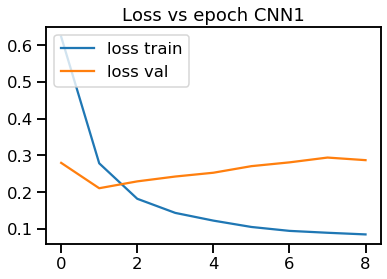

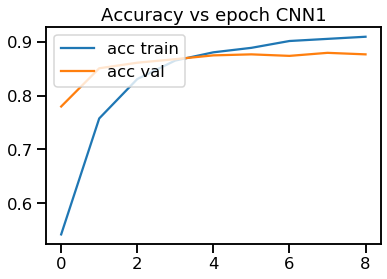


Accuracy sobre Test cnn1 : 0.8492699010833726
F1-score None sobre Test cnn1 : [0.91426876 0.06557377 0.05128205 0.75851852]
F1-score macro sobre Test cnn1 : 0.44741077581767946


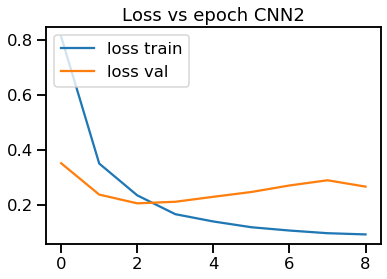

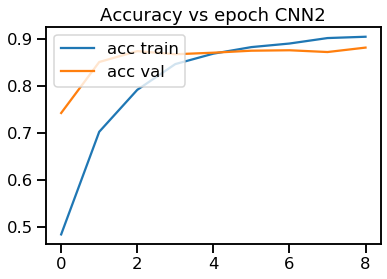


Accuracy sobre Test cnn2 : 0.8591615638247763
F1-score None sobre Test cnn2 : [0.92185664 0.05263158 0.02597403 0.77112135]
F1-score macro sobre Test cnn2 : 0.44289589898396275


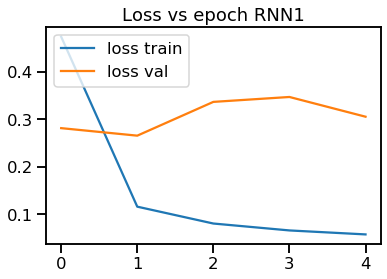

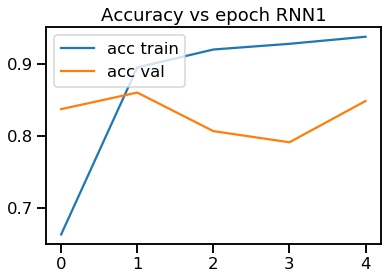


Accuracy sobre Test rnn1 : 0.8318417333961375
F1-score None sobre Test rnn1 : [0.90498014 0.27312775 0.13861386 0.76589147]
F1-score macro sobre Test rnn1 : 0.520653307025541


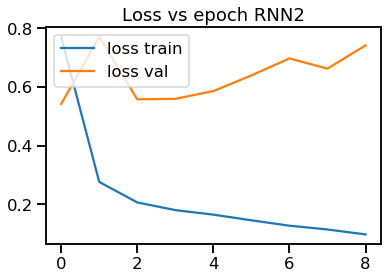

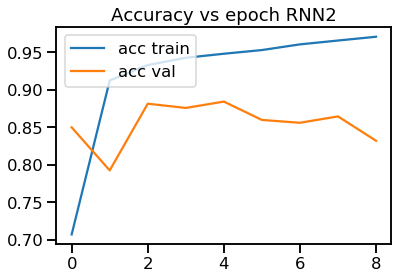


Accuracy sobre Test rnn2 : 0.7983984926990109
F1-score None sobre Test rnn2 : [0.88078012 0.20465116 0.17821782 0.70306258]
F1-score macro sobre Test rnn2 : 0.49167792183242265


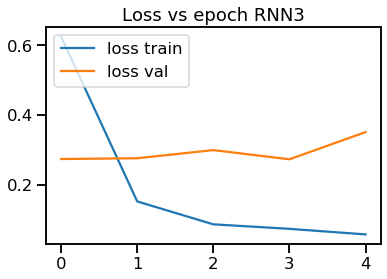

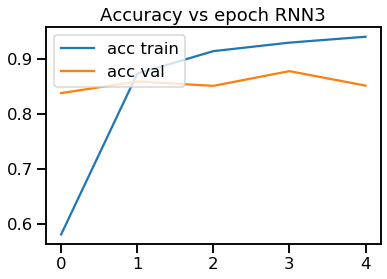


Accuracy sobre Test rnn3 : 0.8238341968911918
F1-score None sobre Test rnn3 : [0.9005958  0.08403361 0.1443299  0.71581451]
F1-score macro sobre Test rnn3 : 0.4611934537370612
----------------------- Entrenando running  2 -----------------------
Pesos de clases: [1. 1. 1. 1.]


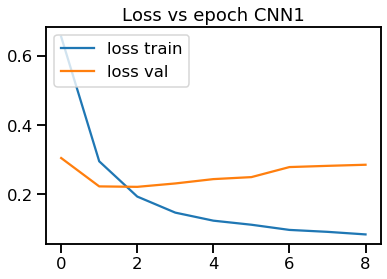

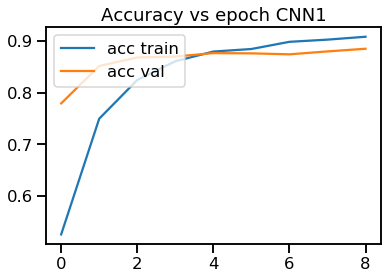


Accuracy sobre Test cnn1 : 0.8502119642016015
F1-score None sobre Test cnn1 : [0.91586045 0.05217391 0.02439024 0.7492163 ]
F1-score macro sobre Test cnn1 : 0.43541022734171514


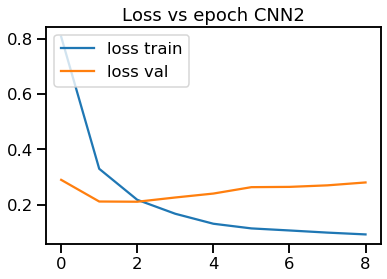

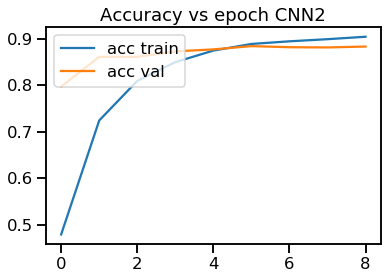


Accuracy sobre Test cnn2 : 0.8464437117286858
F1-score None sobre Test cnn2 : [0.91405343 0.03539823 0.02564103 0.72013093]
F1-score macro sobre Test cnn2 : 0.42380590371873994


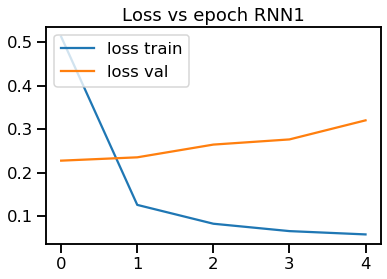

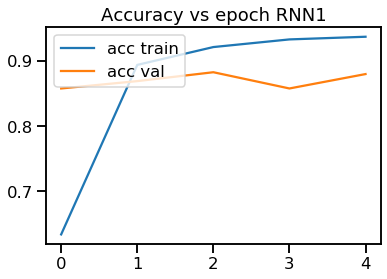


Accuracy sobre Test rnn1 : 0.8525671219971738
F1-score None sobre Test rnn1 : [0.91806275 0.10084034 0.11235955 0.77350993]
F1-score macro sobre Test rnn1 : 0.4761931419895351


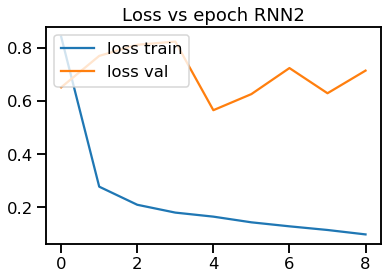

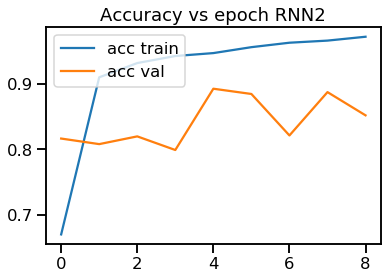


Accuracy sobre Test rnn2 : 0.7979274611398963
F1-score None sobre Test rnn2 : [0.88557845 0.06779661 0.14       0.65521191]
F1-score macro sobre Test rnn2 : 0.4371467425057576


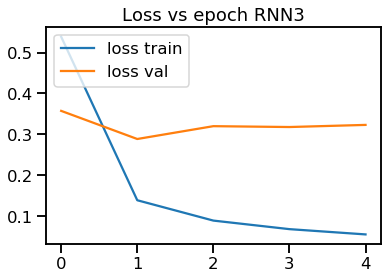

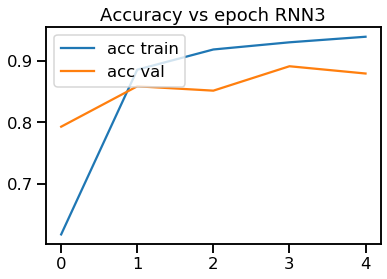


Accuracy sobre Test rnn3 : 0.8459726801695714
F1-score None sobre Test rnn3 : [0.91531642 0.10606061 0.05063291 0.7591623 ]
F1-score macro sobre Test rnn3 : 0.4577930595289481
----------------------- Entrenando running  3 -----------------------
Pesos de clases: [1. 1. 1. 1.]


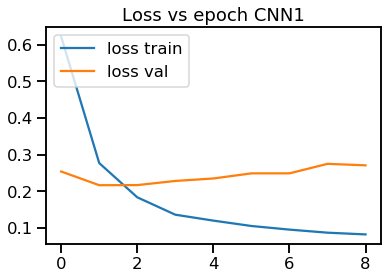

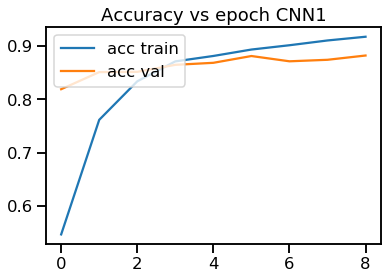


Accuracy sobre Test cnn1 : 0.8553933113518606
F1-score None sobre Test cnn1 : [0.91722726 0.06779661 0.09411765 0.76923077]
F1-score macro sobre Test cnn1 : 0.4620930714729168


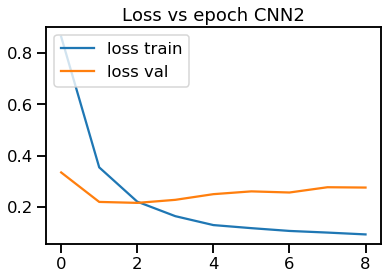

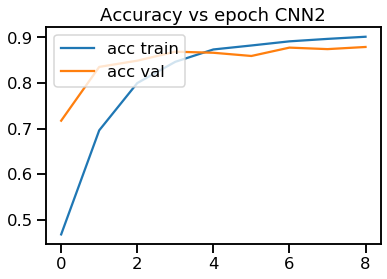


Accuracy sobre Test cnn2 : 0.8591615638247763
F1-score None sobre Test cnn2 : [0.92167791 0.11290323 0.02531646 0.77287066]
F1-score macro sobre Test cnn2 : 0.45819206384354816


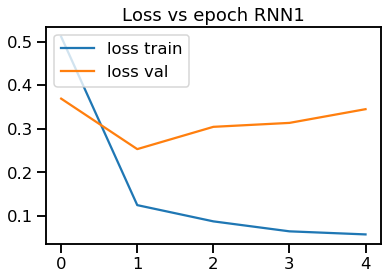

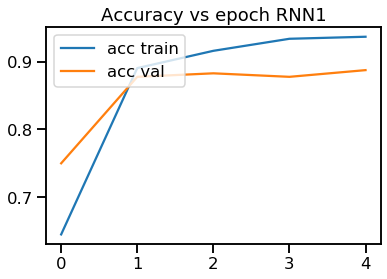


Accuracy sobre Test rnn1 : 0.8634008478568064
F1-score None sobre Test rnn1 : [0.92384888 0.         0.08510638 0.80365297]
F1-score macro sobre Test rnn1 : 0.4531520573523965


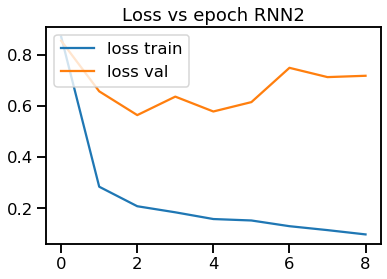

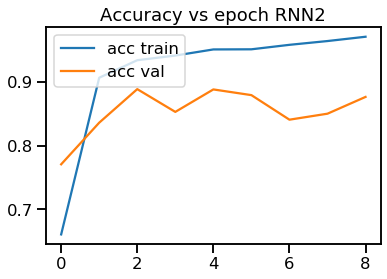


Accuracy sobre Test rnn2 : 0.8511540273198305
F1-score None sobre Test rnn2 : [0.91774631 0.03539823 0.05       0.76294278]
F1-score macro sobre Test rnn2 : 0.4415218296273261


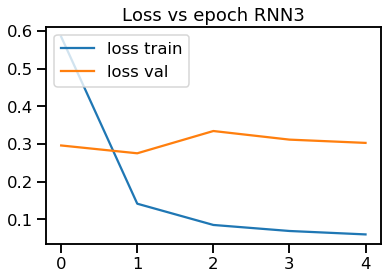

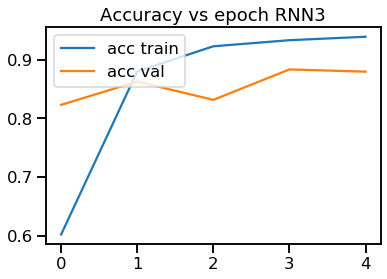


Accuracy sobre Test rnn3 : 0.856806406029204
F1-score None sobre Test rnn3 : [0.92167577 0.20253165 0.10989011 0.79658606]
F1-score macro sobre Test rnn3 : 0.5076708973346188
----------------------- Entrenando running  4 -----------------------
Pesos de clases: [1. 1. 1. 1.]


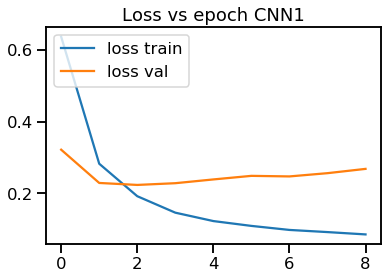

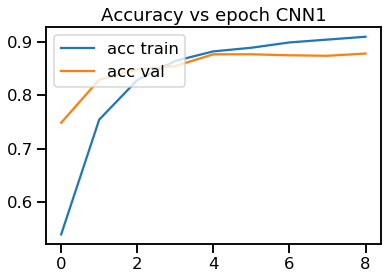


Accuracy sobre Test cnn1 : 0.8469147432878003
F1-score None sobre Test cnn1 : [0.91383353 0.04724409 0.04819277 0.75      ]
F1-score macro sobre Test cnn1 : 0.43981759857367086


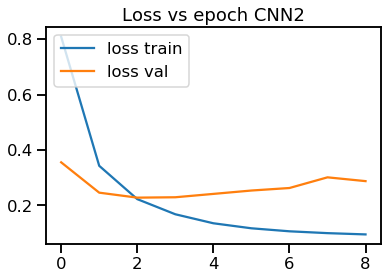

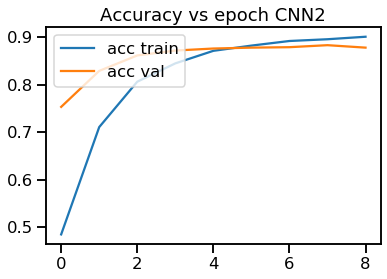


Accuracy sobre Test cnn2 : 0.8553933113518606
F1-score None sobre Test cnn2 : [0.92030697 0.01754386 0.05128205 0.76276276]
F1-score macro sobre Test cnn2 : 0.437973909863862


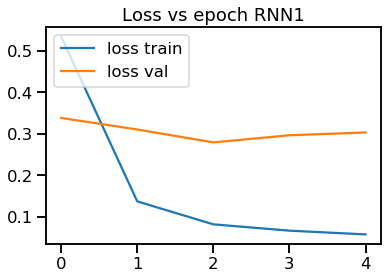

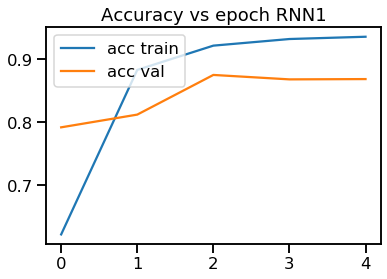


Accuracy sobre Test rnn1 : 0.8398492699010833
F1-score None sobre Test rnn1 : [0.90829439 0.17283951 0.11627907 0.728223  ]
F1-score macro sobre Test rnn1 : 0.4814089912448314


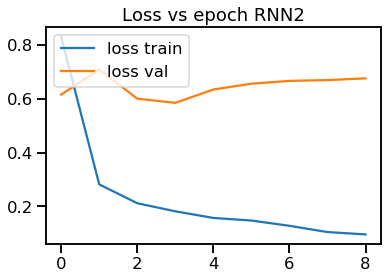

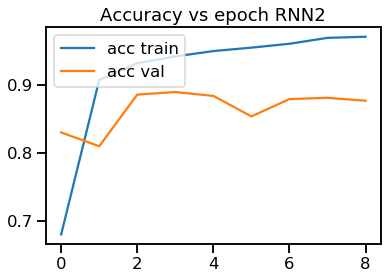


Accuracy sobre Test rnn2 : 0.8318417333961375
F1-score None sobre Test rnn2 : [0.90420066 0.         0.025      0.72021419]
F1-score macro sobre Test rnn2 : 0.41235371373678453


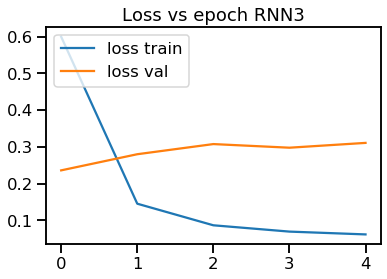

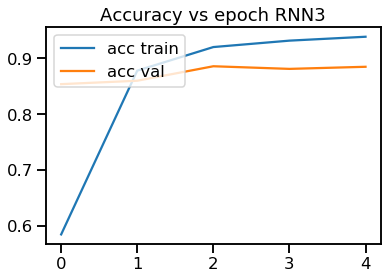


Accuracy sobre Test rnn3 : 0.8553933113518606
F1-score None sobre Test rnn3 : [0.91880471 0.18320611 0.02325581 0.7849162 ]
F1-score macro sobre Test rnn3 : 0.47754570766606186
----------------------- Entrenando running  5 -----------------------
Pesos de clases: [1. 1. 1. 1.]


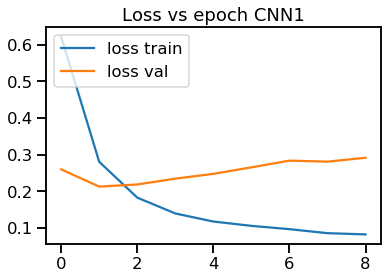

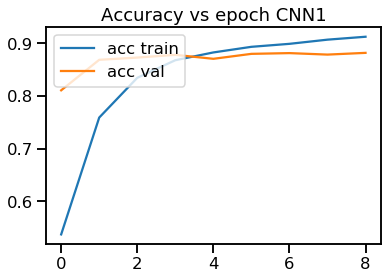


Accuracy sobre Test cnn1 : 0.8629298162976919
F1-score None sobre Test cnn1 : [0.92330559 0.11666667 0.02564103 0.79239766]
F1-score macro sobre Test cnn1 : 0.4645027354278558


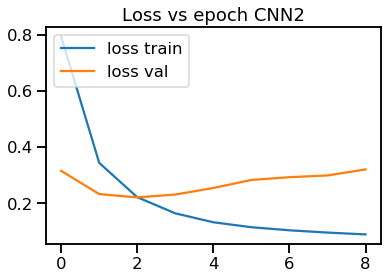

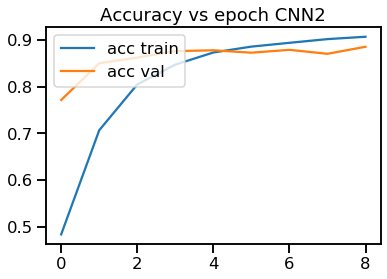


Accuracy sobre Test cnn2 : 0.8619877531794631
F1-score None sobre Test cnn2 : [0.92249417 0.01801802 0.05128205 0.7808    ]
F1-score macro sobre Test cnn2 : 0.44314856044856044


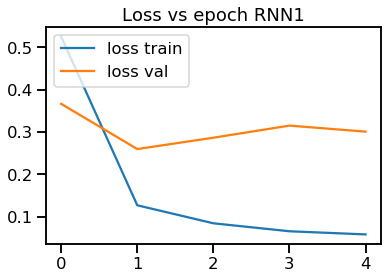

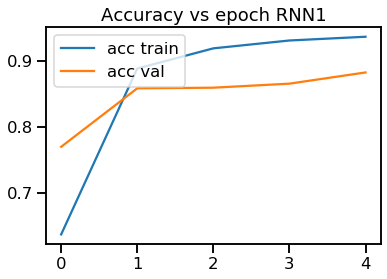


Accuracy sobre Test rnn1 : 0.8572774375883184
F1-score None sobre Test rnn1 : [0.9174258  0.05405405 0.         0.78167939]
F1-score macro sobre Test rnn1 : 0.43828981103276576


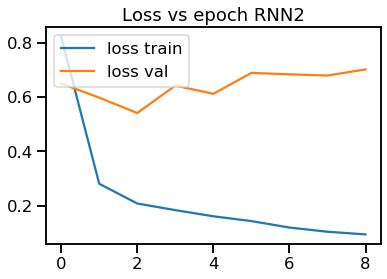

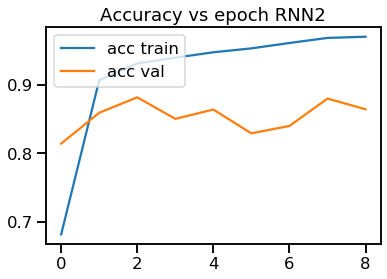


Accuracy sobre Test rnn2 : 0.8398492699010833
F1-score None sobre Test rnn2 : [0.91168437 0.0862069  0.30188679 0.7133059 ]
F1-score macro sobre Test rnn2 : 0.5032709894384012


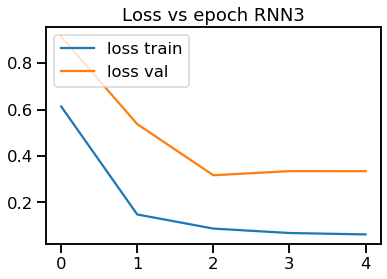

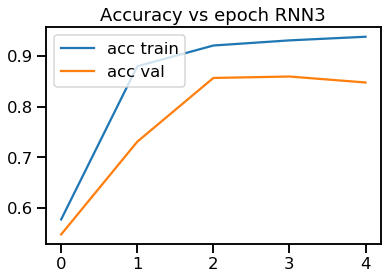


Accuracy sobre Test rnn3 : 0.8294865756005653
F1-score None sobre Test rnn3 : [0.90563648 0.24034335 0.11904762 0.77302205]
F1-score macro sobre Test rnn3 : 0.5095123736894464


In [17]:
prob=0.15 
TOPN=1

fs_macro={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
fs_none={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
accs={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
confusions={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}


for i in range(1,6):
    print ("----------------------- Entrenando running ", i,"-----------------------")
    macro_augmented=np.load('../new_glove_augmented/harassment/Aumento_'+str(i)+'-run_'+str(prob)+'_app1_Top'+str(TOPN)+'.npy', allow_pickle=True)
    
    ids_train=macro_augmented[:,0]
    tws_train=macro_augmented[:,1]
    labels_train=macro_augmented[:,2]
    class_weights= compute_class_weight('balanced', np.unique(labels_train), labels_train)
    print ("Pesos de clases:", class_weights)

    etiq=labels_train.copy()
    sentences = tws_train
    n_labels = np.array(etiq)
    y_train=to_categorical(n_labels,num_classes=4)
    
    input_ids = []
    for sent in sentences:
        encoded_tok=[]
        for wd in sent:
            try: 
                encoded_tok.append(Word2Index_valid[wd])
            except: 
                continue 
        input_ids.append(encoded_tok)
    
    input_ids = pad_sequences(input_ids, maxlen=MAX_LEN, dtype="long", 
                              value=0, truncating="post", padding="post")
    
    shape=np.asarray(input_ids).shape
    x_train=np.zeros((shape[0], shape[1], g_dim))
    j=0
    for in_id in input_ids:
        x_train[j]=M_GLOVE_space[in_id]
        j+=1
        
    ###########################################################
    ############################################################
    ############################################################
    
    cnn1=create_ccn1(x_train.shape[1:])
    trained, hist =train_model(cnn1, x_train, y_train, x_val, y_val, class_weights, e=7, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.15/cnn1_'+str(i)+'-exec_app1_Top_'+str(TOPN)+'_7e.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch CNN1")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch CNN1")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'cnn1')
    fs_macro['cnn1'].append(f1_ma_t)
    fs_none['cnn1'].append(f1_t)
    accs['cnn1'].append(acc_t)
    confusions['cnn1'].append(matriz_t)
    
    cnn2=create_cnn2(x_train.shape[1:])
    trained, hist =train_model(cnn2, x_train, y_train, x_val, y_val, class_weights, e=7, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.15/cnn2_'+str(i)+'-exec_app1_Top_'+str(TOPN)+'_7e.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch CNN2")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch CNN2")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'cnn2')
    fs_macro['cnn2'].append(f1_ma_t)
    fs_none['cnn2'].append(f1_t)
    accs['cnn2'].append(acc_t)
    confusions['cnn2'].append(matriz_t)
    
    rnn1=create_complex_GRU_2(128,64,"adam",x_train.shape[1:])
    trained, hist =train_model(rnn1, x_train, y_train, x_val, y_val, class_weights, e=4, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.15/rnn1_'+str(i)+'-exec_app1_Top_'+str(TOPN)+'_4e.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch RNN1")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch RNN1")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'rnn1')
    fs_macro['rnn1'].append(f1_ma_t)
    fs_none['rnn1'].append(f1_t)
    accs['rnn1'].append(acc_t)
    confusions['rnn1'].append(matriz_t)
    
    rnn2=create_complex_GRU_3(256,128,64,"adam",x_train.shape[1:])
    trained, hist =train_model(rnn2, x_train, y_train, x_val, y_val, class_weights, e=7, BS=32, verb=0, focal=False)
    trained.save('../new_glove_augmented/harassment_baselines/0.15/rnn2_'+str(i)+'-exec_app1_Top_'+str(TOPN)+'_7e.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch RNN2")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch RNN2")
    plt.show()
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'rnn2')
    fs_macro['rnn2'].append(f1_ma_t)
    fs_none['rnn2'].append(f1_t)
    accs['rnn2'].append(acc_t)
    confusions['rnn2'].append(matriz_t)
    
    rnn3=create_complex_GRU_3(256,128,64,"adam",x_train.shape[1:])
    trained, hist =train_model(rnn3, x_train, y_train, x_val, y_val, class_weights, e=4, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.15/rnn3_'+str(i)+'-exec_app1_Top_'+str(TOPN)+'_4e.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch RNN3")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch RNN3")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'rnn3')
    fs_macro['rnn3'].append(f1_ma_t)
    fs_none['rnn3'].append(f1_t)
    accs['rnn3'].append(acc_t)
    confusions['rnn3'].append(matriz_t)


In [18]:
for key in fs_none.keys():
    temp=np.zeros(4)
    for result in fs_none[key]:
        temp+=result
    print ("(0.15) app1 F1-score promedio para",key,":" ,temp/5)

print ("")
for key in fs_macro.keys():
    temp=np.sum(fs_macro[key])
    print ("(0.15) app1 F1-score macro promedio para",key,":" ,temp/5, "desvest: ",np.std(fs_macro[key]))

print ("")
for key in accs.keys():
    temp=np.sum(accs[key])
    print ("(0.15) app1 Accuracy promedio para",key,":" ,temp/5)

(0.15) app1 F1-score promedio para cnn1 : [0.91689912 0.06989101 0.04872475 0.76387265]
(0.15) app1 F1-score promedio para cnn2 : [0.92007782 0.04729898 0.03589912 0.76153714]
(0.15) app1 F1-score promedio para rnn1 : [0.91452239 0.12017233 0.09047177 0.77059135]
(0.15) app1 F1-score promedio para rnn2 : [0.89999798 0.07881058 0.13902092 0.71094747]
(0.15) app1 F1-score promedio para rnn3 : [0.91240584 0.16323506 0.08943127 0.76590022]

(0.15) app1 F1-score macro promedio para cnn1 : 0.4498468817267677 desvest:  0.011659342463493632
(0.15) app1 F1-score macro promedio para cnn2 : 0.44120326737173465 desvest:  0.01103055197601968
(0.15) app1 F1-score macro promedio para rnn1 : 0.47393946172901397 desvest:  0.028092953079993987
(0.15) app1 F1-score macro promedio para rnn2 : 0.4571942394281384 desvest:  0.034555435317073425
(0.15) app1 F1-score macro promedio para rnn3 : 0.4827430983912273 desvest:  0.022144497079202755

(0.15) app1 Accuracy promedio para cnn1 : 0.8529439472444654
(0.15)

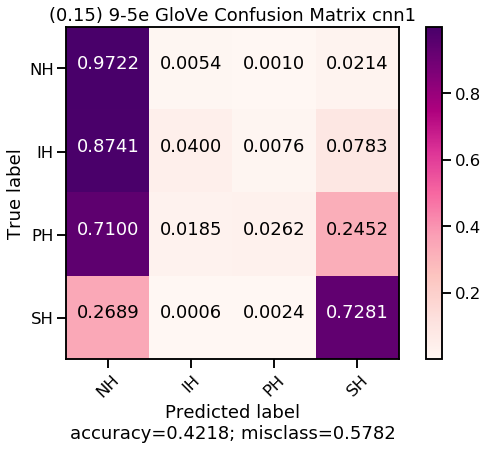

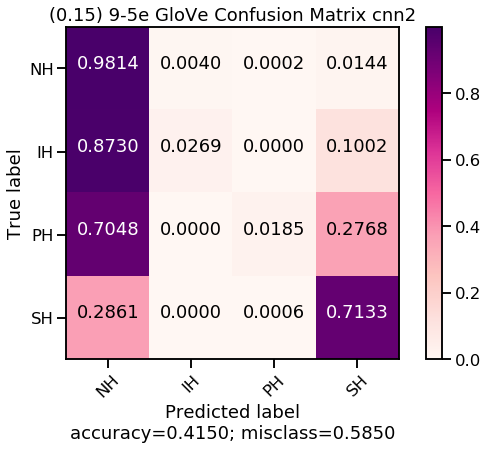

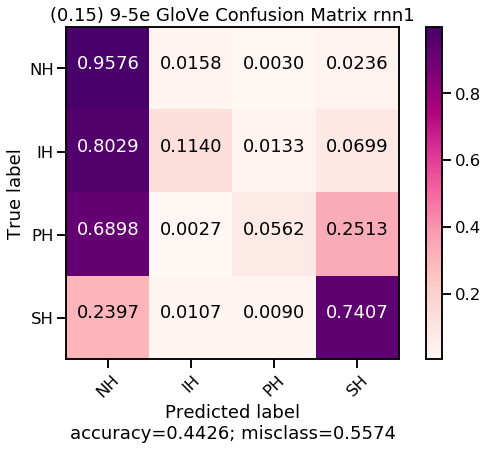

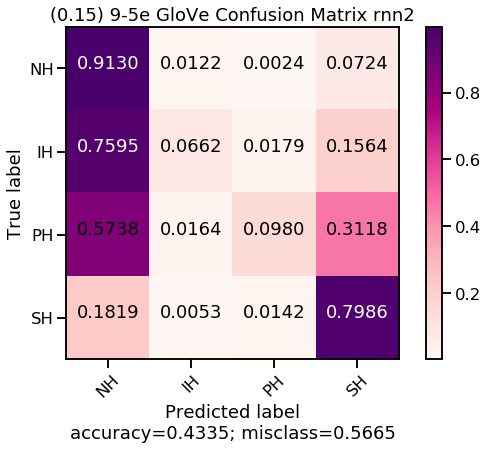

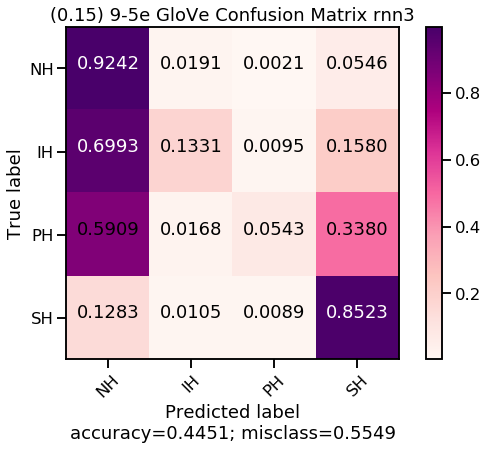

In [19]:
for key in confusions.keys():
    temp=np.sum(confusions[key], axis=0)/5.0
    plot_confusion_matrix(temp, ['NH','IH','PH','SH'], "(0.15) 9-5e GloVe Confusion Matrix "+str(key), cmap='RdPu')

### 0.5

----------------------- Entrenando running  1 -----------------------
Pesos de clases: [1. 1. 1. 1.]


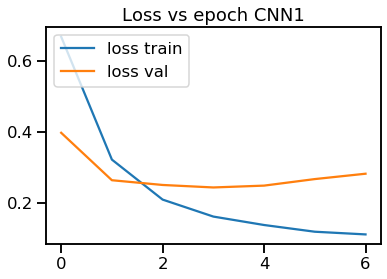

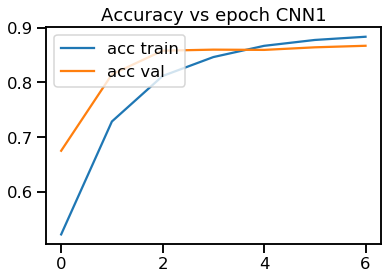


Accuracy sobre Test cnn1 : 0.8346679227508244
F1-score None sobre Test cnn1 : [0.90770637 0.09677419 0.04761905 0.72582781]
F1-score macro sobre Test cnn1 : 0.444481855466378


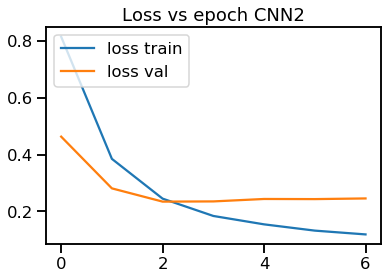

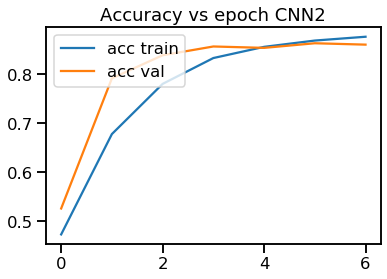


Accuracy sobre Test cnn2 : 0.8370230805463966
F1-score None sobre Test cnn2 : [0.90870744 0.17857143 0.14141414 0.74848485]
F1-score macro sobre Test cnn2 : 0.4942944651177553


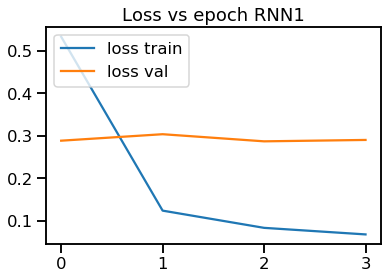

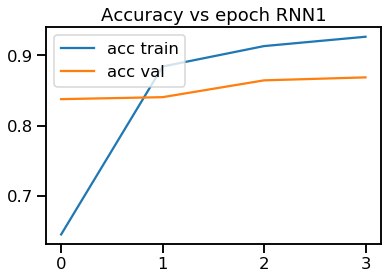


Accuracy sobre Test rnn1 : 0.8450306170513424
F1-score None sobre Test rnn1 : [0.91020159 0.17687075 0.11881188 0.78729282]
F1-score macro sobre Test rnn1 : 0.498294258859556


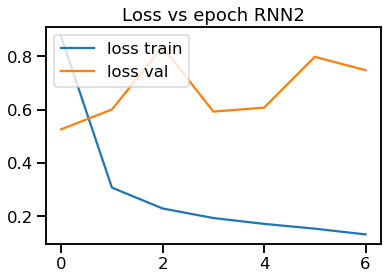

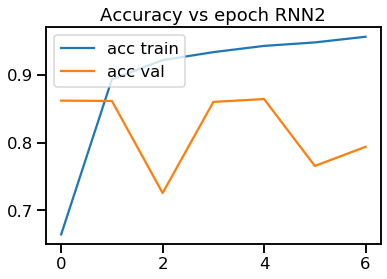


Accuracy sobre Test rnn2 : 0.7447008949599623
F1-score None sobre Test rnn2 : [0.8442953  0.08108108 0.13793103 0.60329777]
F1-score macro sobre Test rnn2 : 0.41665129668335543


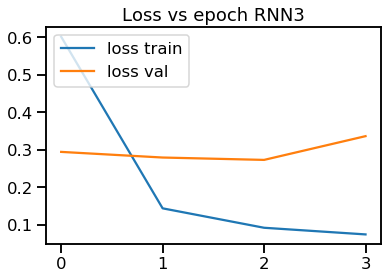

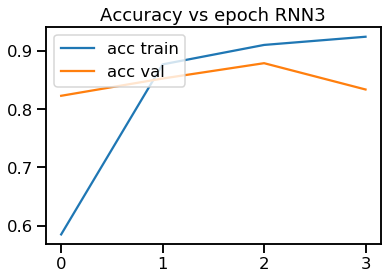


Accuracy sobre Test rnn3 : 0.8021667451719265
F1-score None sobre Test rnn3 : [0.8863124  0.14285714 0.08888889 0.71346375]
F1-score macro sobre Test rnn3 : 0.45788054563508607
----------------------- Entrenando running  2 -----------------------
Pesos de clases: [1. 1. 1. 1.]


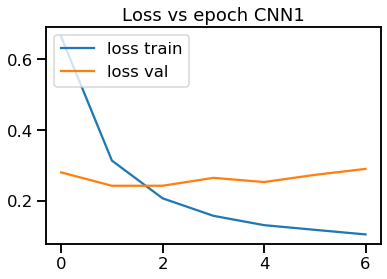

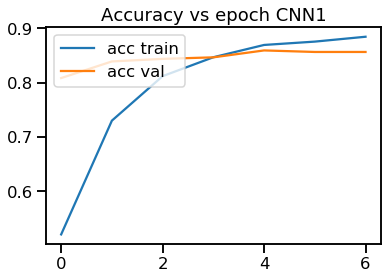


Accuracy sobre Test cnn1 : 0.8111163447951013
F1-score None sobre Test cnn1 : [0.89346861 0.09722222 0.04819277 0.70289017]
F1-score macro sobre Test cnn1 : 0.43544344450105466


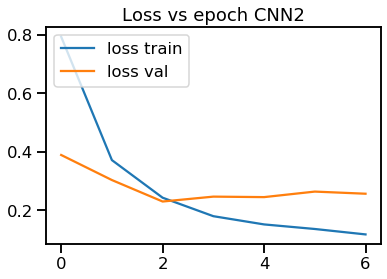

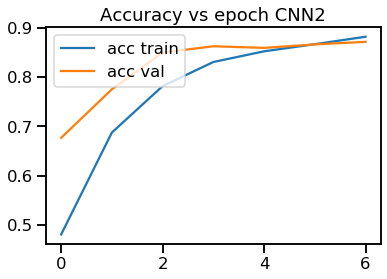


Accuracy sobre Test cnn2 : 0.8483278379651437
F1-score None sobre Test cnn2 : [0.91486811 0.09677419 0.09302326 0.75714286]
F1-score macro sobre Test cnn2 : 0.46545210300519635


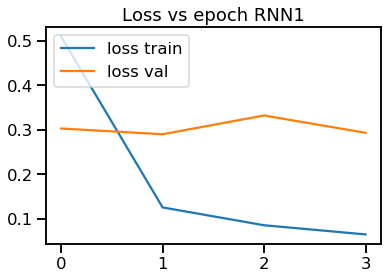

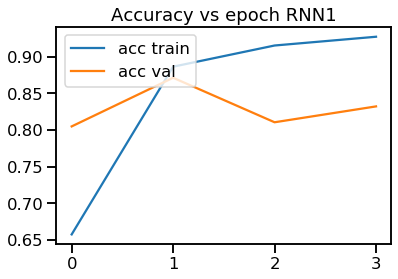


Accuracy sobre Test rnn1 : 0.795572303344324
F1-score None sobre Test rnn1 : [0.8792144  0.24       0.16091954 0.69690265]
F1-score macro sobre Test rnn1 : 0.4942591494289499


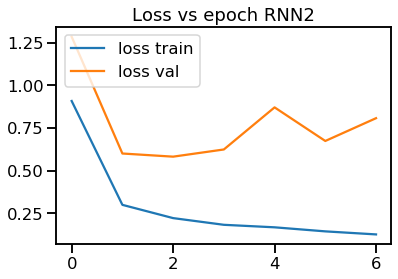

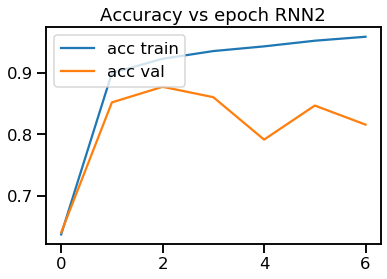


Accuracy sobre Test rnn2 : 0.7993405558172397
F1-score None sobre Test rnn2 : [0.88409019 0.01724138 0.32432432 0.67226891]
F1-score macro sobre Test rnn2 : 0.4744811996396904


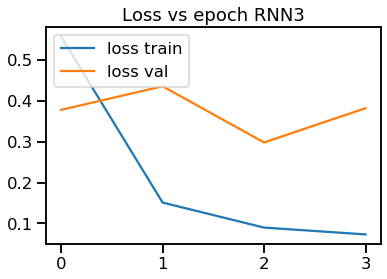

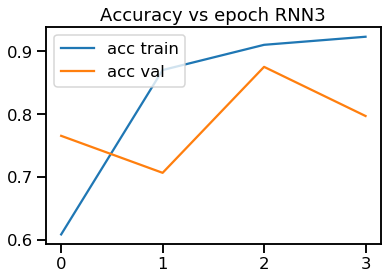


Accuracy sobre Test rnn3 : 0.7508243052284503
F1-score None sobre Test rnn3 : [0.84998307 0.09395973 0.31521739 0.63125   ]
F1-score macro sobre Test rnn3 : 0.47260254772858634
----------------------- Entrenando running  3 -----------------------
Pesos de clases: [1. 1. 1. 1.]


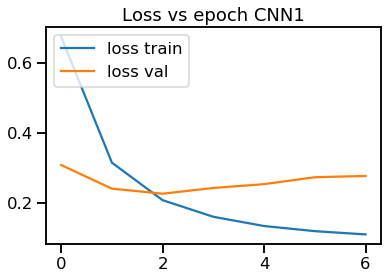

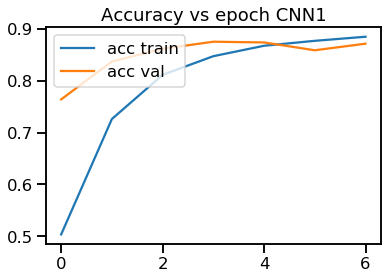


Accuracy sobre Test cnn1 : 0.843617522373999
F1-score None sobre Test cnn1 : [0.91054502 0.06666667 0.04210526 0.75725191]
F1-score macro sobre Test cnn1 : 0.4441422154795475


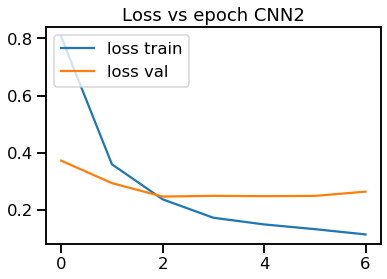

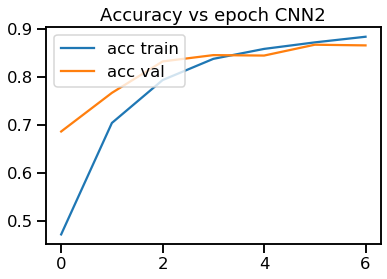


Accuracy sobre Test cnn2 : 0.8341968911917098
F1-score None sobre Test cnn2 : [0.90686275 0.10810811 0.05       0.74535809]
F1-score macro sobre Test cnn2 : 0.452582235847956


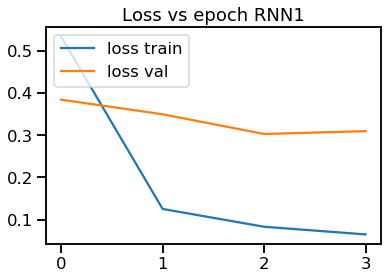

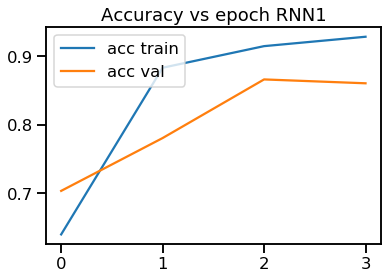


Accuracy sobre Test rnn1 : 0.8393782383419689
F1-score None sobre Test rnn1 : [0.91354997 0.01694915 0.26589595 0.77344877]
F1-score macro sobre Test rnn1 : 0.4924609622730831


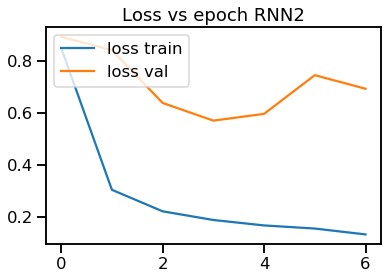

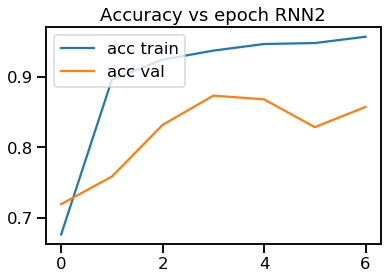


Accuracy sobre Test rnn2 : 0.8224211022138483
F1-score None sobre Test rnn2 : [0.89783282 0.0173913  0.27826087 0.70992366]
F1-score macro sobre Test rnn2 : 0.47585216384316054


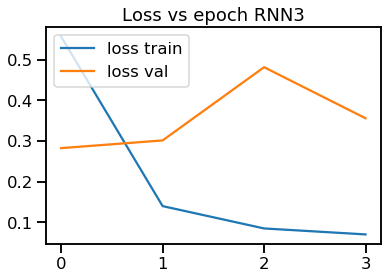

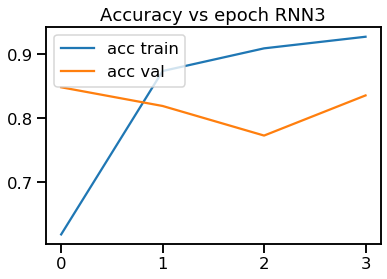


Accuracy sobre Test rnn3 : 0.8144135657089024
F1-score None sobre Test rnn3 : [0.89377516 0.13605442 0.18666667 0.79069767]
F1-score macro sobre Test rnn3 : 0.5017984813607539
----------------------- Entrenando running  4 -----------------------
Pesos de clases: [1. 1. 1. 1.]


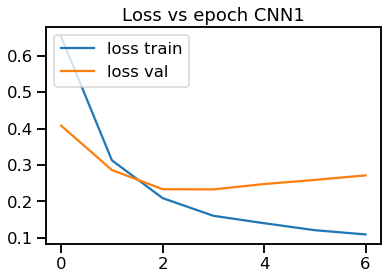

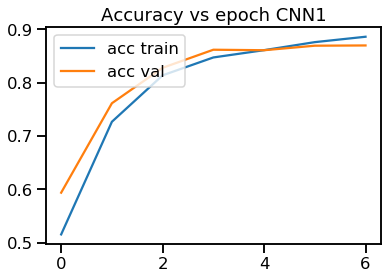


Accuracy sobre Test cnn1 : 0.8341968911917098
F1-score None sobre Test cnn1 : [0.90510511 0.16774194 0.06741573 0.73809524]
F1-score macro sobre Test cnn1 : 0.46958950225532314


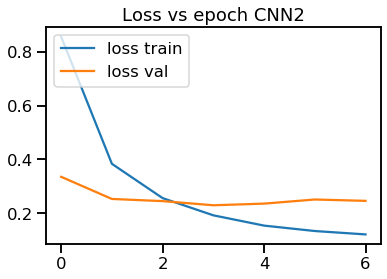

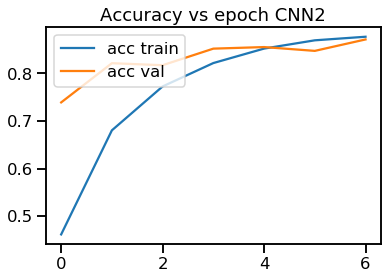


Accuracy sobre Test cnn2 : 0.8360810174281676
F1-score None sobre Test cnn2 : [0.90716804 0.1037037  0.14893617 0.70799347]
F1-score macro sobre Test cnn2 : 0.46695034655845213


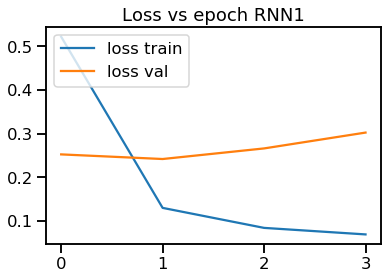

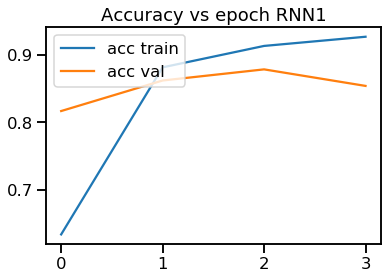


Accuracy sobre Test rnn1 : 0.8177107866227037
F1-score None sobre Test rnn1 : [0.89655172 0.14473684 0.2238806  0.73341677]
F1-score macro sobre Test rnn1 : 0.49964648355545604


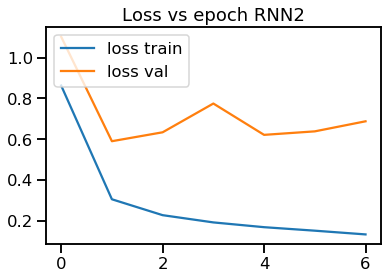

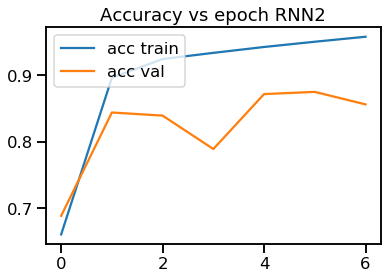


Accuracy sobre Test rnn2 : 0.8351389543099388
F1-score None sobre Test rnn2 : [0.90712743 0.03603604 0.1980198  0.73392182]
F1-score macro sobre Test rnn2 : 0.4687762709277197


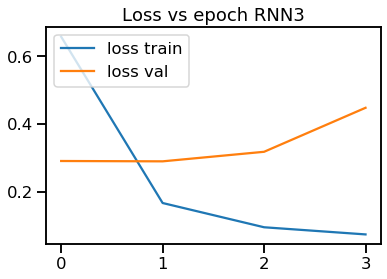

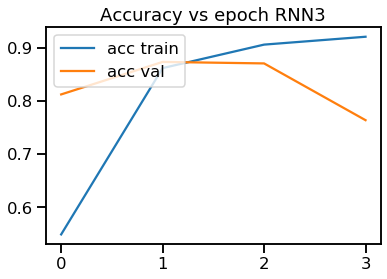


Accuracy sobre Test rnn3 : 0.7324540744229864
F1-score None sobre Test rnn3 : [0.84207012 0.28795812 0.23430962 0.66984127]
F1-score macro sobre Test rnn3 : 0.5085447813292284
----------------------- Entrenando running  5 -----------------------
Pesos de clases: [1. 1. 1. 1.]


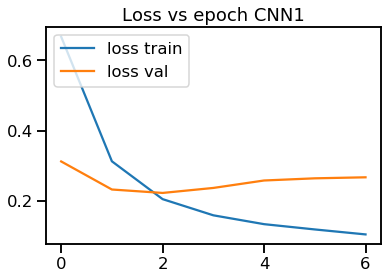

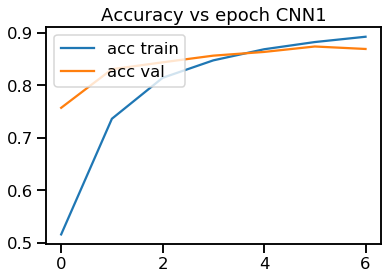


Accuracy sobre Test cnn1 : 0.8393782383419689
F1-score None sobre Test cnn1 : [0.90636042 0.13245033 0.025      0.74959612]
F1-score macro sobre Test cnn1 : 0.45335171948319286


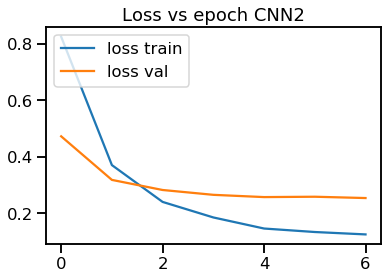

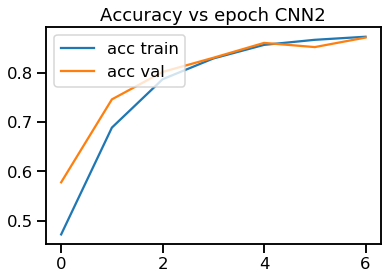


Accuracy sobre Test cnn2 : 0.8398492699010833
F1-score None sobre Test cnn2 : [0.91232299 0.0610687  0.12244898 0.74212034]
F1-score macro sobre Test cnn2 : 0.45949025364337964


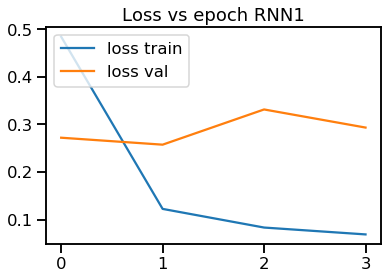

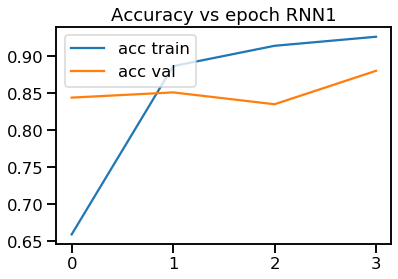


Accuracy sobre Test rnn1 : 0.8535091851154027
F1-score None sobre Test rnn1 : [0.91637631 0.         0.02531646 0.76268412]
F1-score macro sobre Test rnn1 : 0.4260942216756659


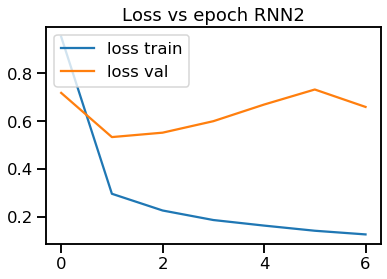

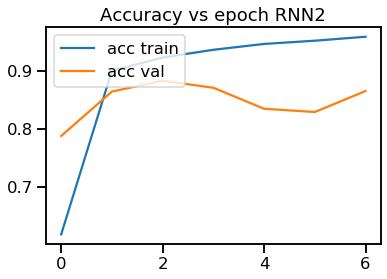


Accuracy sobre Test rnn2 : 0.8370230805463966
F1-score None sobre Test rnn2 : [0.90903596 0.18181818 0.09638554 0.71191136]
F1-score macro sobre Test rnn2 : 0.474787760963505


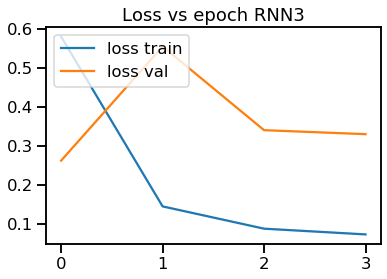

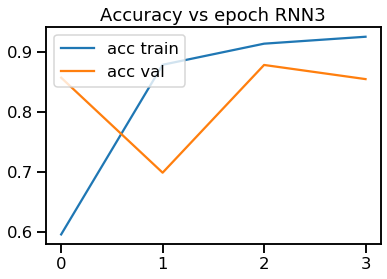


Accuracy sobre Test rnn3 : 0.8233631653320772
F1-score None sobre Test rnn3 : [0.89962359 0.1509434  0.07407407 0.73105134]
F1-score macro sobre Test rnn3 : 0.4639231008751195


In [31]:
prob=0.5 
TOPN=1

fs_macro={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
fs_none={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
accs={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
confusions={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}


for i in range(1,6):
    print ("----------------------- Entrenando running ", i,"-----------------------")
    macro_augmented=np.load('../new_glove_augmented/harassment/Aumento_'+str(i)+'-run_'+str(prob)+'_app1_Top'+str(TOPN)+'.npy', allow_pickle=True)
    
    ids_train=macro_augmented[:,0]
    tws_train=macro_augmented[:,1]
    labels_train=macro_augmented[:,2]
    class_weights= compute_class_weight('balanced', np.unique(labels_train), labels_train)
    print ("Pesos de clases:", class_weights)

    etiq=labels_train.copy()
    sentences = tws_train
    n_labels = np.array(etiq)
    y_train=to_categorical(n_labels,num_classes=4)
    
    input_ids = []
    for sent in sentences:
        encoded_tok=[]
        for wd in sent:
            try: 
                encoded_tok.append(Word2Index_valid[wd])
            except: 
                continue 
        input_ids.append(encoded_tok)
    
    input_ids = pad_sequences(input_ids, maxlen=MAX_LEN, dtype="long", 
                              value=0, truncating="post", padding="post")
    
    shape=np.asarray(input_ids).shape
    x_train=np.zeros((shape[0], shape[1], g_dim))
    j=0
    for in_id in input_ids:
        x_train[j]=M_GLOVE_space[in_id]
        j+=1
        
    ###########################################################
    ############################################################
    ############################################################
    
    cnn1=create_ccn1(x_train.shape[1:])
    trained, hist =train_model(cnn1, x_train, y_train, x_val, y_val, class_weights, e=7, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.5/cnn1_'+str(i)+'-exec_app1_Top_'+str(TOPN)+'_7e.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch CNN1")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch CNN1")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'cnn1')
    fs_macro['cnn1'].append(f1_ma_t)
    fs_none['cnn1'].append(f1_t)
    accs['cnn1'].append(acc_t)
    confusions['cnn1'].append(matriz_t)
    
    cnn2=create_cnn2(x_train.shape[1:])
    trained, hist =train_model(cnn2, x_train, y_train, x_val, y_val, class_weights, e=7, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.5/cnn2_'+str(i)+'-exec_app1_Top_'+str(TOPN)+'_7e.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch CNN2")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch CNN2")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'cnn2')
    fs_macro['cnn2'].append(f1_ma_t)
    fs_none['cnn2'].append(f1_t)
    accs['cnn2'].append(acc_t)
    confusions['cnn2'].append(matriz_t)
    
    rnn1=create_complex_GRU_2(128,64,"adam",x_train.shape[1:])
    trained, hist =train_model(rnn1, x_train, y_train, x_val, y_val, class_weights, e=4, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.5/rnn1_'+str(i)+'-exec_app1_Top_'+str(TOPN)+'_4e.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch RNN1")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch RNN1")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'rnn1')
    fs_macro['rnn1'].append(f1_ma_t)
    fs_none['rnn1'].append(f1_t)
    accs['rnn1'].append(acc_t)
    confusions['rnn1'].append(matriz_t)
    
    rnn2=create_complex_GRU_3(256,128,64,"adam",x_train.shape[1:])
    trained, hist =train_model(rnn2, x_train, y_train, x_val, y_val, class_weights, e=7, BS=32, verb=0, focal=False)
    trained.save('../new_glove_augmented/harassment_baselines/0.5/rnn2_'+str(i)+'-exec_app1_Top_'+str(TOPN)+'_7e.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch RNN2")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch RNN2")
    plt.show()
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'rnn2')
    fs_macro['rnn2'].append(f1_ma_t)
    fs_none['rnn2'].append(f1_t)
    accs['rnn2'].append(acc_t)
    confusions['rnn2'].append(matriz_t)
    
    rnn3=create_complex_GRU_3(256,128,64,"adam",x_train.shape[1:])
    trained, hist =train_model(rnn3, x_train, y_train, x_val, y_val, class_weights, e=4, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.5/rnn3_'+str(i)+'-exec_app1_Top_'+str(TOPN)+'_4e.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch RNN3")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch RNN3")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'rnn3')
    fs_macro['rnn3'].append(f1_ma_t)
    fs_none['rnn3'].append(f1_t)
    accs['rnn3'].append(acc_t)
    confusions['rnn3'].append(matriz_t)


In [32]:
for key in fs_none.keys():
    temp=np.zeros(4)
    for result in fs_none[key]:
        temp+=result
    print ("(0.5) 7-4e app1 F1-score promedio para",key,":" ,temp/5)

print ("")
for key in fs_macro.keys():
    temp=np.sum(fs_macro[key])
    print ("(0.5) 7-4e app1 F1-score macro promedio para",key,":" ,temp/5, "desvest: ",np.std(fs_macro[key]))

print ("")
for key in accs.keys():
    temp=np.sum(accs[key])
    print ("(0.5) 7-4e app1 Accuracy promedio para",key,":" ,temp/5)

(0.5) 7-4e app1 F1-score promedio para cnn1 : [0.90463711 0.11217107 0.04606656 0.73473225]
(0.5) 7-4e app1 F1-score promedio para cnn2 : [0.90998586 0.10964523 0.11116451 0.74021992]
(0.5) 7-4e app1 F1-score promedio para rnn1 : [0.9031788  0.11571135 0.15896489 0.75074903]
(0.5) 7-4e app1 F1-score promedio para rnn2 : [0.88847634 0.0667136  0.20698431 0.6862647 ]
(0.5) 7-4e app1 F1-score promedio para rnn3 : [0.87435287 0.16235456 0.17983133 0.70726081]

(0.5) 7-4e app1 F1-score macro promedio para cnn1 : 0.44940174743709915 desvest:  0.011574540665064076
(0.5) 7-4e app1 F1-score macro promedio para cnn2 : 0.4677538808345479 desvest:  0.014204314897638584
(0.5) 7-4e app1 F1-score macro promedio para rnn1 : 0.48215101515854214 desvest:  0.028149464478794007
(0.5) 7-4e app1 F1-score macro promedio para rnn2 : 0.4621097384114862 desvest:  0.022862861350388515
(0.5) 7-4e app1 F1-score macro promedio para rnn3 : 0.48094989138575495 desvest:  0.020434902052742423

(0.5) 7-4e app1 Accuracy 

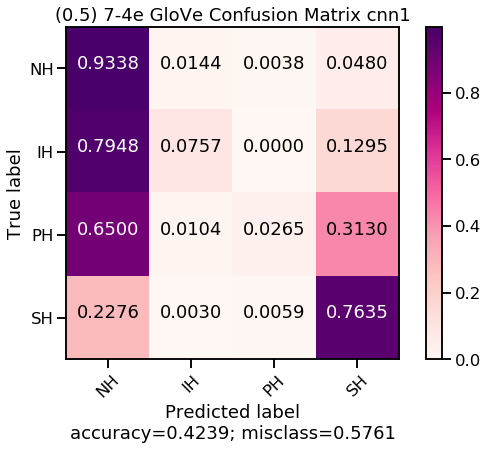

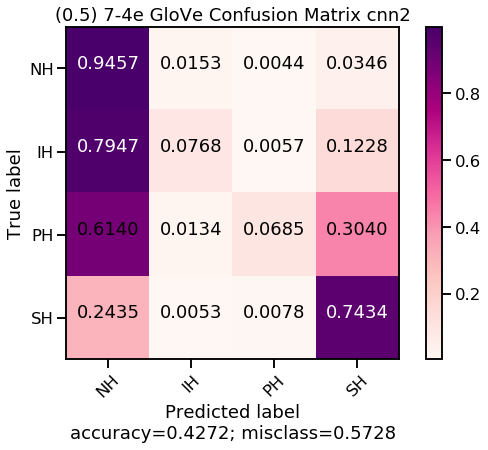

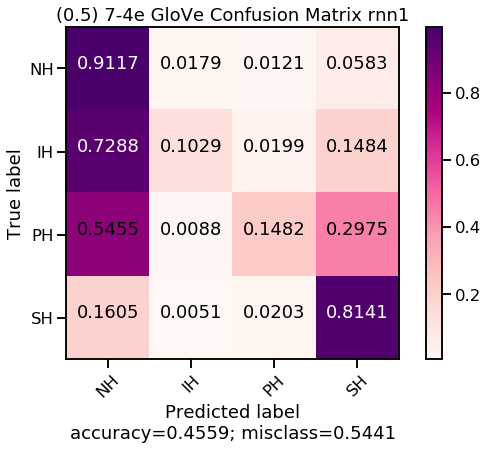

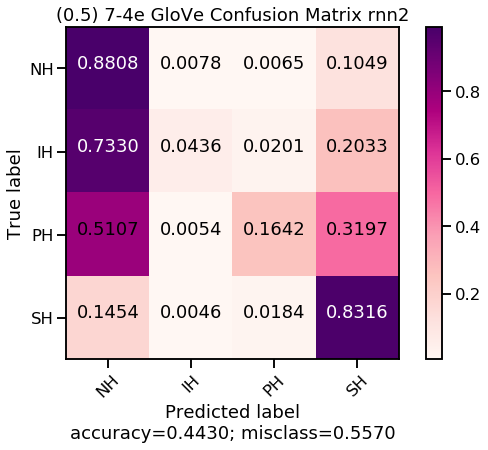

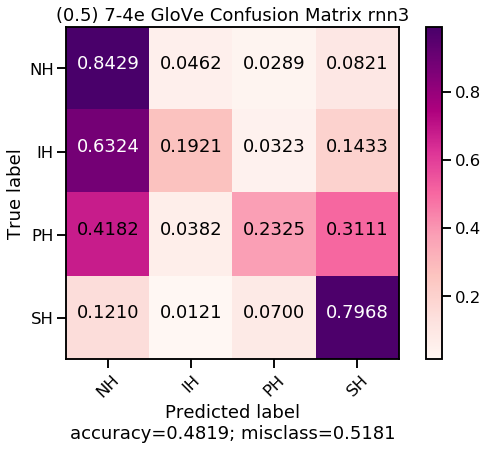

In [33]:
for key in confusions.keys():
    temp=np.sum(confusions[key], axis=0)/5.0
    plot_confusion_matrix(temp, ['NH','IH','PH','SH'], "(0.5) 7-4e GloVe Confusion Matrix "+str(key), cmap='RdPu')

----------------------- Entrenando running  1 -----------------------
Pesos de clases: [1. 1. 1. 1.]


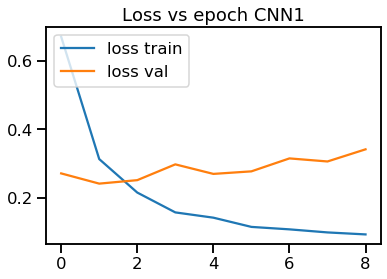

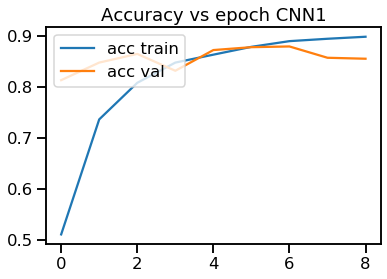


Accuracy sobre Test cnn1 : 0.8082901554404145
F1-score None sobre Test cnn1 : [0.89413265 0.06956522 0.02469136 0.6761488 ]
F1-score macro sobre Test cnn1 : 0.4161345062440316


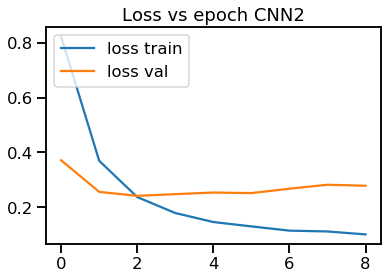

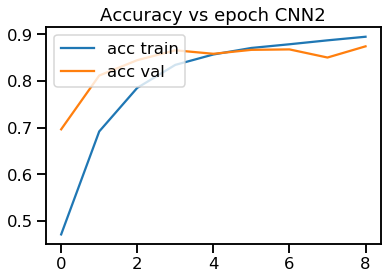


Accuracy sobre Test cnn2 : 0.8483278379651437
F1-score None sobre Test cnn2 : [0.91604422 0.08196721 0.08988764 0.75290698]
F1-score macro sobre Test cnn2 : 0.4602015122529236


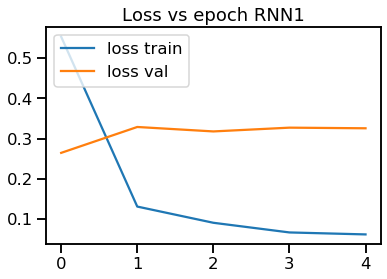

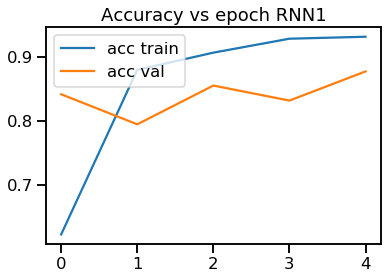


Accuracy sobre Test rnn1 : 0.8497409326424871
F1-score None sobre Test rnn1 : [0.91385768 0.01869159 0.05128205 0.72881356]
F1-score macro sobre Test rnn1 : 0.42816121932293844


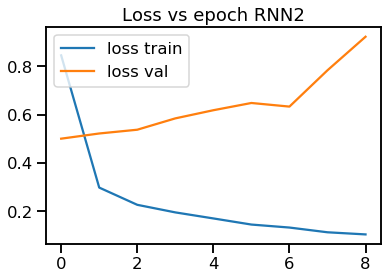

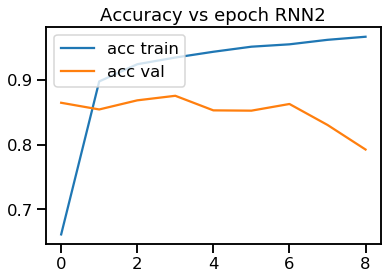


Accuracy sobre Test rnn2 : 0.7357512953367875
F1-score None sobre Test rnn2 : [0.83494498 0.08064516 0.02272727 0.58743961]
F1-score macro sobre Test rnn2 : 0.3814392573011797


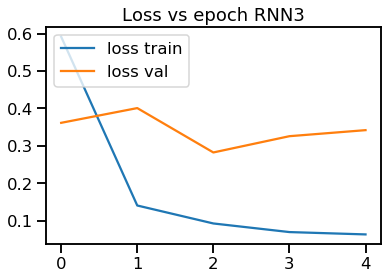

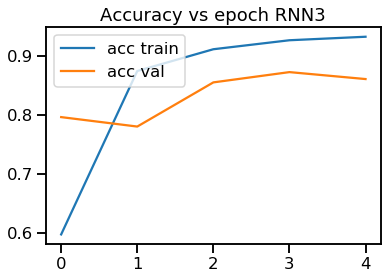


Accuracy sobre Test rnn3 : 0.8308996702779087
F1-score None sobre Test rnn3 : [0.90332706 0.12307692 0.29357798 0.73325213]
F1-score macro sobre Test rnn3 : 0.5133085230361555
----------------------- Entrenando running  2 -----------------------
Pesos de clases: [1. 1. 1. 1.]


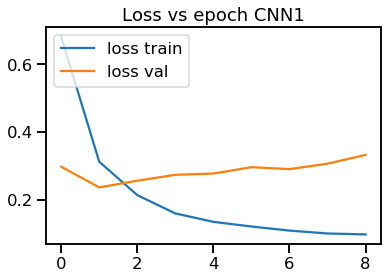

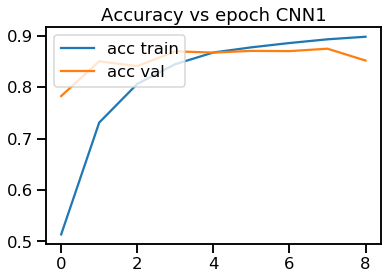


Accuracy sobre Test cnn1 : 0.813942534149788
F1-score None sobre Test cnn1 : [0.89591901 0.05405405 0.15384615 0.68403171]
F1-score macro sobre Test cnn1 : 0.4469627327375155


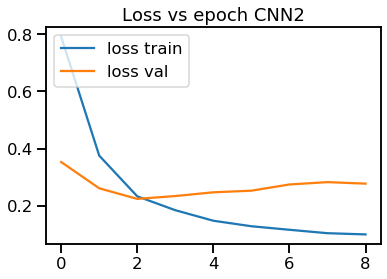

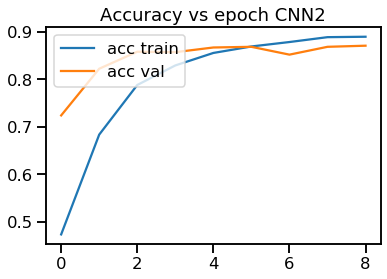


Accuracy sobre Test cnn2 : 0.8393782383419689
F1-score None sobre Test cnn2 : [0.91007519 0.06666667 0.08988764 0.73314607]
F1-score macro sobre Test cnn2 : 0.44994389062544005


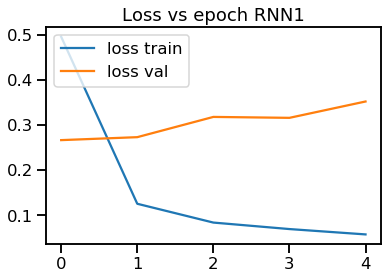

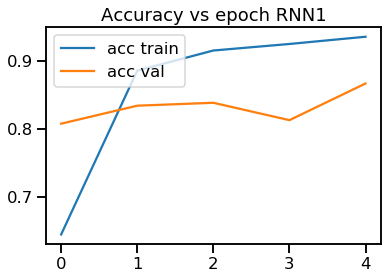


Accuracy sobre Test rnn1 : 0.8210080075365049
F1-score None sobre Test rnn1 : [0.8975     0.         0.05063291 0.7117853 ]
F1-score macro sobre Test rnn1 : 0.4149795522354992


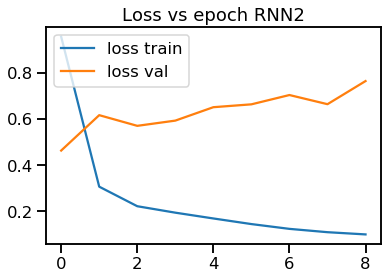

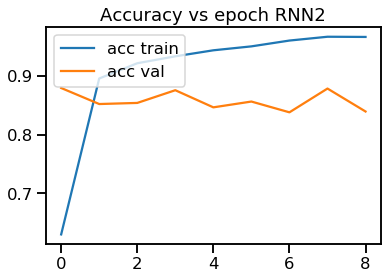


Accuracy sobre Test rnn2 : 0.802637776731041
F1-score None sobre Test rnn2 : [0.89050633 0.13793103 0.21374046 0.67407407]
F1-score macro sobre Test rnn2 : 0.479062973921506


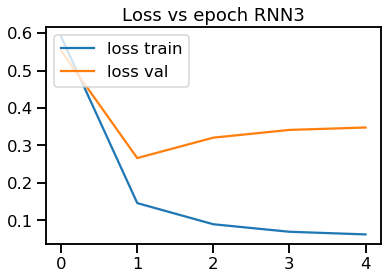

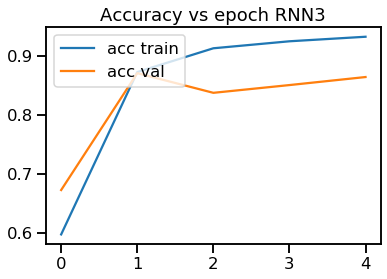


Accuracy sobre Test rnn3 : 0.8374941121055111
F1-score None sobre Test rnn3 : [0.90677475 0.         0.18867925 0.70506108]
F1-score macro sobre Test rnn3 : 0.4501287703039909
----------------------- Entrenando running  3 -----------------------
Pesos de clases: [1. 1. 1. 1.]


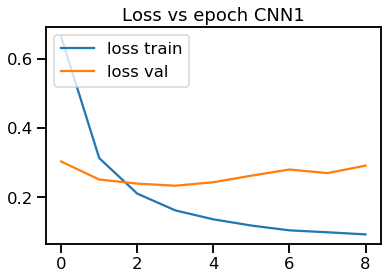

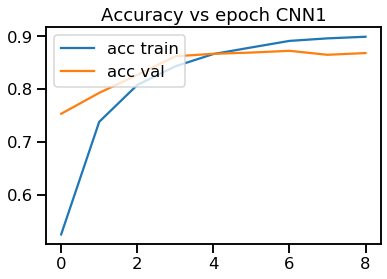


Accuracy sobre Test cnn1 : 0.8346679227508244
F1-score None sobre Test cnn1 : [0.90431305 0.05       0.07317073 0.67403315]
F1-score macro sobre Test cnn1 : 0.4253792335729746


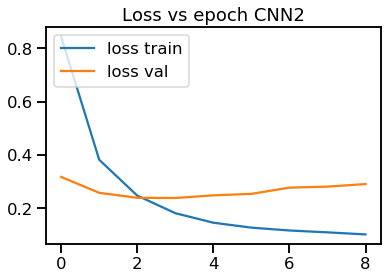

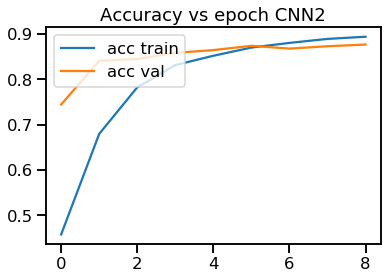


Accuracy sobre Test cnn2 : 0.843617522373999
F1-score None sobre Test cnn2 : [0.91384433 0.06896552 0.13861386 0.73001508]
F1-score macro sobre Test cnn2 : 0.4628596967982022


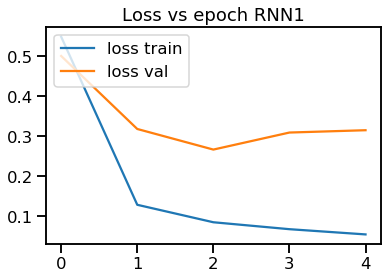

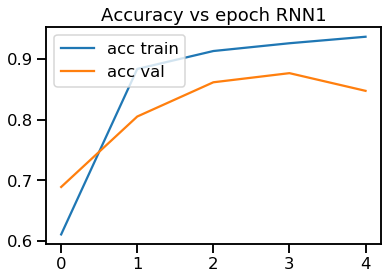


Accuracy sobre Test rnn1 : 0.8167687235044748
F1-score None sobre Test rnn1 : [0.89477041 0.17142857 0.24299065 0.70915411]
F1-score macro sobre Test rnn1 : 0.5045859368387006


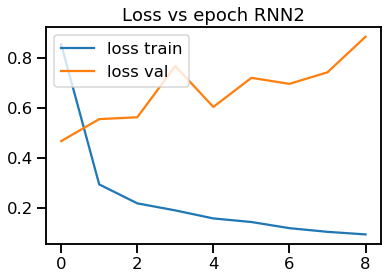

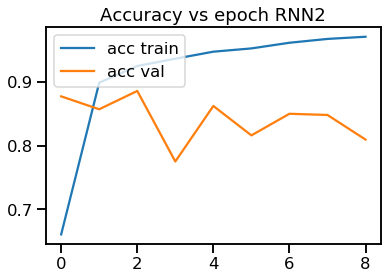


Accuracy sobre Test rnn2 : 0.7644842204427696
F1-score None sobre Test rnn2 : [0.85770751 0.09302326 0.14545455 0.6323378 ]
F1-score macro sobre Test rnn2 : 0.4321307768091076


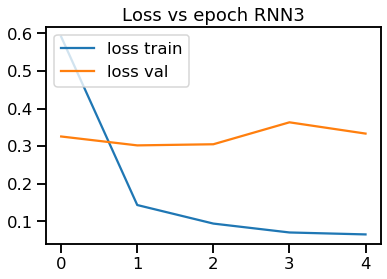

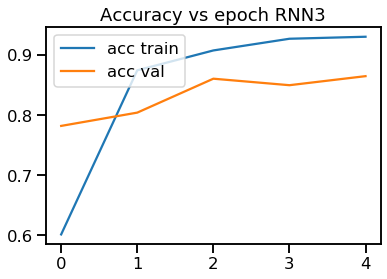


Accuracy sobre Test rnn3 : 0.8464437117286858
F1-score None sobre Test rnn3 : [0.91666667 0.16107383 0.28148148 0.76854599]
F1-score macro sobre Test rnn3 : 0.5319419919291964
----------------------- Entrenando running  4 -----------------------
Pesos de clases: [1. 1. 1. 1.]


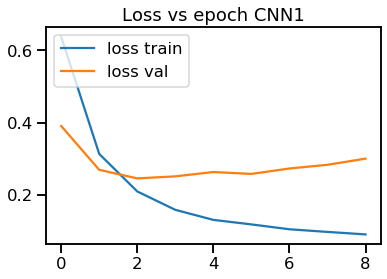

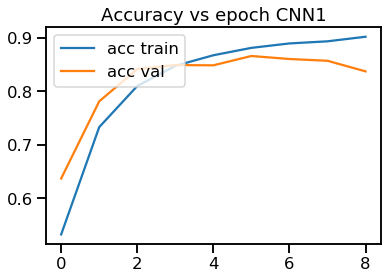


Accuracy sobre Test cnn1 : 0.7922750824305228
F1-score None sobre Test cnn1 : [0.8791423  0.11940299 0.         0.67014614]
F1-score macro sobre Test cnn1 : 0.41717285576415375


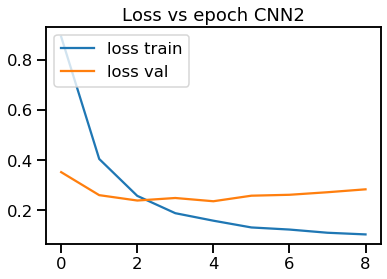

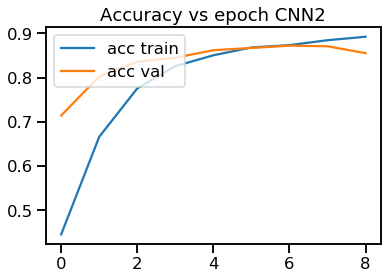


Accuracy sobre Test cnn2 : 0.8233631653320772
F1-score None sobre Test cnn2 : [0.90236318 0.05369128 0.02564103 0.72727273]
F1-score macro sobre Test cnn2 : 0.427242053040285


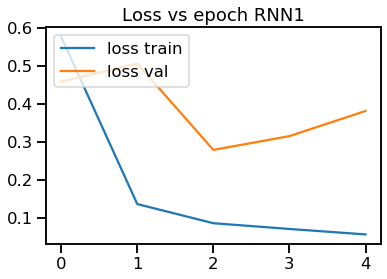

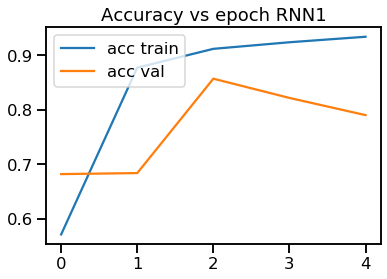


Accuracy sobre Test rnn1 : 0.7479981158737635
F1-score None sobre Test rnn1 : [0.84485095 0.1981982  0.23463687 0.66741321]
F1-score macro sobre Test rnn1 : 0.4862748080254604


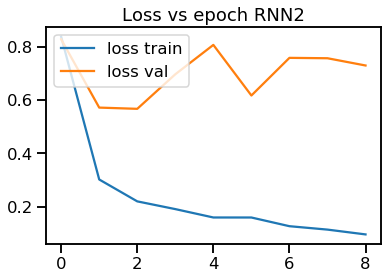

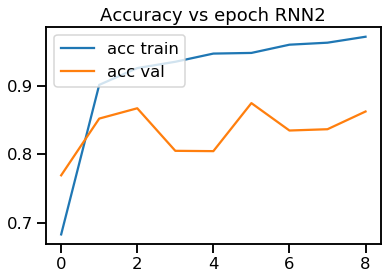


Accuracy sobre Test rnn2 : 0.8290155440414507
F1-score None sobre Test rnn2 : [0.90527615 0.03448276 0.07228916 0.7146402 ]
F1-score macro sobre Test rnn2 : 0.4316720657737466


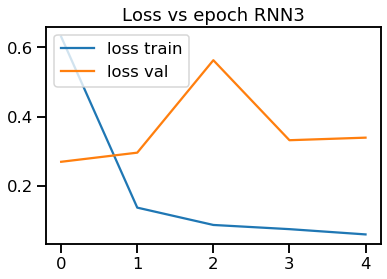

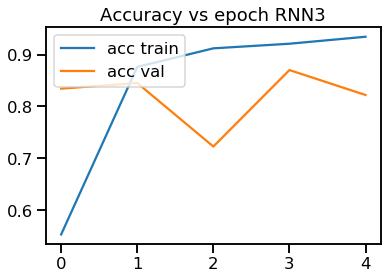


Accuracy sobre Test rnn3 : 0.7682524729156853
F1-score None sobre Test rnn3 : [0.86195509 0.15444015 0.         0.69387755]
F1-score macro sobre Test rnn3 : 0.42756819783145505
----------------------- Entrenando running  5 -----------------------
Pesos de clases: [1. 1. 1. 1.]


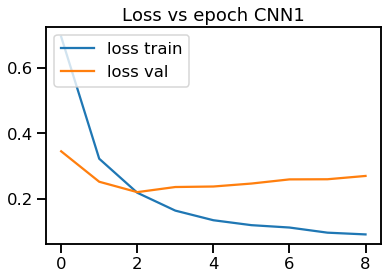

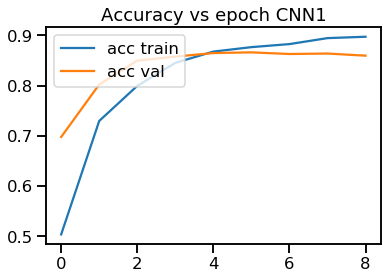


Accuracy sobre Test cnn1 : 0.8294865756005653
F1-score None sobre Test cnn1 : [0.90375    0.1627907  0.15053763 0.75288092]
F1-score macro sobre Test cnn1 : 0.4924898134945068


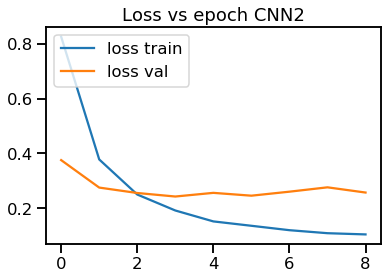

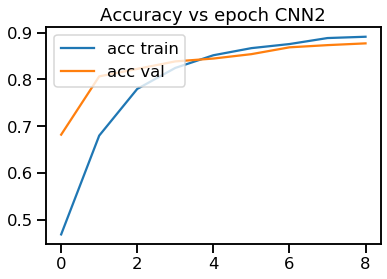


Accuracy sobre Test cnn2 : 0.8417333961375412
F1-score None sobre Test cnn2 : [0.91244789 0.05839416 0.06666667 0.75037821]
F1-score macro sobre Test cnn2 : 0.4469717319307118


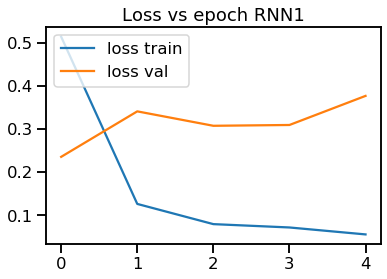

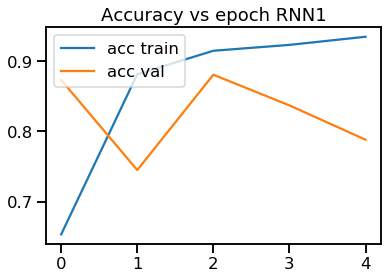


Accuracy sobre Test rnn1 : 0.743287800282619
F1-score None sobre Test rnn1 : [0.84565588 0.15564202 0.25263158 0.67824074]
F1-score macro sobre Test rnn1 : 0.4830425550942079


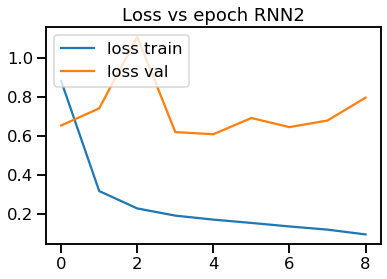

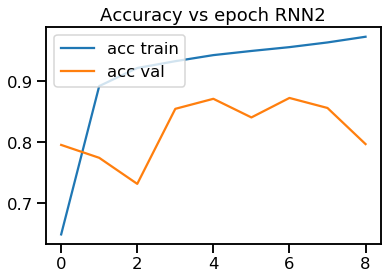


Accuracy sobre Test rnn2 : 0.7800282618935469
F1-score None sobre Test rnn2 : [0.87373096 0.24548736 0.27419355 0.65800866]
F1-score macro sobre Test rnn2 : 0.5128551338709246


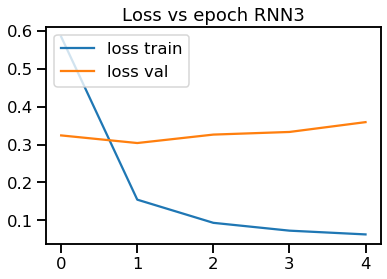

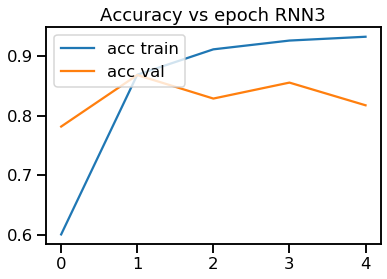


Accuracy sobre Test rnn3 : 0.7767310409797457
F1-score None sobre Test rnn3 : [0.87418087 0.11111111 0.29370629 0.6878825 ]
F1-score macro sobre Test rnn3 : 0.49172019169099557


In [20]:
prob=0.5 
TOPN=1

fs_macro={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
fs_none={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
accs={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
confusions={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}


for i in range(1,6):
    print ("----------------------- Entrenando running ", i,"-----------------------")
    macro_augmented=np.load('../new_glove_augmented/harassment/Aumento_'+str(i)+'-run_'+str(prob)+'_app1_Top'+str(TOPN)+'.npy', allow_pickle=True)
    
    ids_train=macro_augmented[:,0]
    tws_train=macro_augmented[:,1]
    labels_train=macro_augmented[:,2]
    class_weights= compute_class_weight('balanced', np.unique(labels_train), labels_train)
    print ("Pesos de clases:", class_weights)

    etiq=labels_train.copy()
    sentences = tws_train
    n_labels = np.array(etiq)
    y_train=to_categorical(n_labels,num_classes=4)
    
    input_ids = []
    for sent in sentences:
        encoded_tok=[]
        for wd in sent:
            try: 
                encoded_tok.append(Word2Index_valid[wd])
            except: 
                continue 
        input_ids.append(encoded_tok)
    
    input_ids = pad_sequences(input_ids, maxlen=MAX_LEN, dtype="long", 
                              value=0, truncating="post", padding="post")
    
    shape=np.asarray(input_ids).shape
    x_train=np.zeros((shape[0], shape[1], g_dim))
    j=0
    for in_id in input_ids:
        x_train[j]=M_GLOVE_space[in_id]
        j+=1
        
    ###########################################################
    ############################################################
    ############################################################
    
    cnn1=create_ccn1(x_train.shape[1:])
    trained, hist =train_model(cnn1, x_train, y_train, x_val, y_val, class_weights, e=9, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.5/cnn1_'+str(i)+'-exec_app1_Top_'+str(TOPN)+'_9e.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch CNN1")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch CNN1")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'cnn1')
    fs_macro['cnn1'].append(f1_ma_t)
    fs_none['cnn1'].append(f1_t)
    accs['cnn1'].append(acc_t)
    confusions['cnn1'].append(matriz_t)
    
    cnn2=create_cnn2(x_train.shape[1:])
    trained, hist =train_model(cnn2, x_train, y_train, x_val, y_val, class_weights, e=9, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.5/cnn2_'+str(i)+'-exec_app1_Top_'+str(TOPN)+'_9e.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch CNN2")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch CNN2")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'cnn2')
    fs_macro['cnn2'].append(f1_ma_t)
    fs_none['cnn2'].append(f1_t)
    accs['cnn2'].append(acc_t)
    confusions['cnn2'].append(matriz_t)
    
    rnn1=create_complex_GRU_2(128,64,"adam",x_train.shape[1:])
    trained, hist =train_model(rnn1, x_train, y_train, x_val, y_val, class_weights, e=5, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.5/rnn1_'+str(i)+'-exec_app1_Top_'+str(TOPN)+'_5e.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch RNN1")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch RNN1")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'rnn1')
    fs_macro['rnn1'].append(f1_ma_t)
    fs_none['rnn1'].append(f1_t)
    accs['rnn1'].append(acc_t)
    confusions['rnn1'].append(matriz_t)
    
    rnn2=create_complex_GRU_3(256,128,64,"adam",x_train.shape[1:])
    trained, hist =train_model(rnn2, x_train, y_train, x_val, y_val, class_weights, e=9, BS=32, verb=0, focal=False)
    trained.save('../new_glove_augmented/harassment_baselines/0.5/rnn2_'+str(i)+'-exec_app1_Top_'+str(TOPN)+'_9e.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch RNN2")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch RNN2")
    plt.show()
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'rnn2')
    fs_macro['rnn2'].append(f1_ma_t)
    fs_none['rnn2'].append(f1_t)
    accs['rnn2'].append(acc_t)
    confusions['rnn2'].append(matriz_t)
    
    rnn3=create_complex_GRU_3(256,128,64,"adam",x_train.shape[1:])
    trained, hist =train_model(rnn3, x_train, y_train, x_val, y_val, class_weights, e=5, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.5/rnn3_'+str(i)+'-exec_app1_Top_'+str(TOPN)+'_5e.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch RNN3")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch RNN3")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'rnn3')
    fs_macro['rnn3'].append(f1_ma_t)
    fs_none['rnn3'].append(f1_t)
    accs['rnn3'].append(acc_t)
    confusions['rnn3'].append(matriz_t)


In [21]:
for key in fs_none.keys():
    temp=np.zeros(4)
    for result in fs_none[key]:
        temp+=result
    print ("(0.5) app1 F1-score promedio para",key,":" ,temp/5)

print ("")
for key in fs_macro.keys():
    temp=np.sum(fs_macro[key])
    print ("(0.5) app1 F1-score macro promedio para",key,":" ,temp/5, "desvest: ",np.std(fs_macro[key]))

print ("")
for key in accs.keys():
    temp=np.sum(accs[key])
    print ("(0.5) app1 Accuracy promedio para",key,":" ,temp/5)

(0.5) app1 F1-score promedio para cnn1 : [0.8954514  0.09116259 0.08044918 0.69144814]
(0.5) app1 F1-score promedio para cnn2 : [0.91095496 0.06593697 0.08213937 0.73874381]
(0.5) app1 F1-score promedio para rnn1 : [0.87932698 0.10879208 0.16643481 0.69908139]
(0.5) app1 F1-score promedio para rnn2 : [0.87243319 0.11831391 0.145681   0.65330007]
(0.5) app1 F1-score promedio para rnn3 : [0.89258089 0.1099404  0.211489   0.71772385]

(0.5) app1 F1-score macro promedio para cnn1 : 0.4396278283626365 desvest:  0.028661384217507087
(0.5) app1 F1-score macro promedio para cnn2 : 0.4494437769295125 desvest:  0.012609468181094038
(0.5) app1 F1-score macro promedio para rnn1 : 0.4634088143033613 desvest:  0.03518999642788607
(0.5) app1 F1-score macro promedio para rnn2 : 0.4474320415352929 desvest:  0.044984997507109686
(0.5) app1 F1-score macro promedio para rnn3 : 0.48293353495835867 desvest:  0.03884107936484283

(0.5) app1 Accuracy promedio para cnn1 : 0.8157324540744231
(0.5) app1 Accuracy

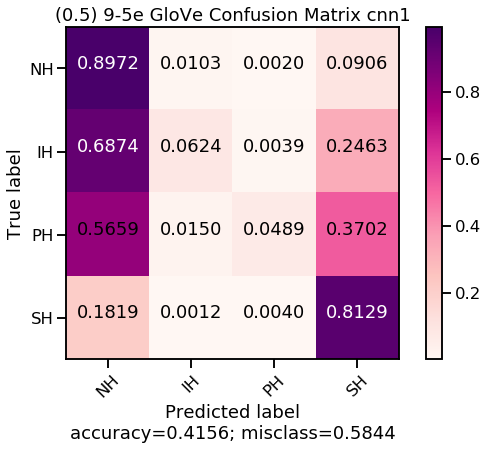

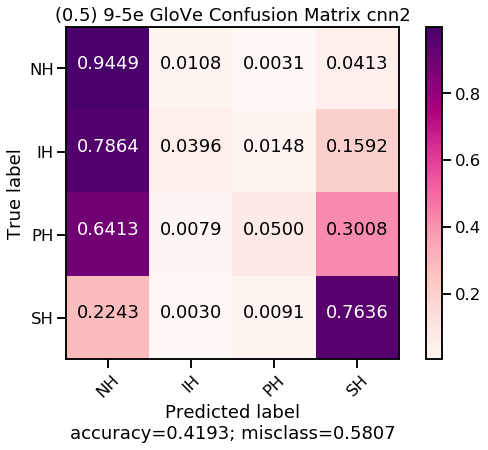

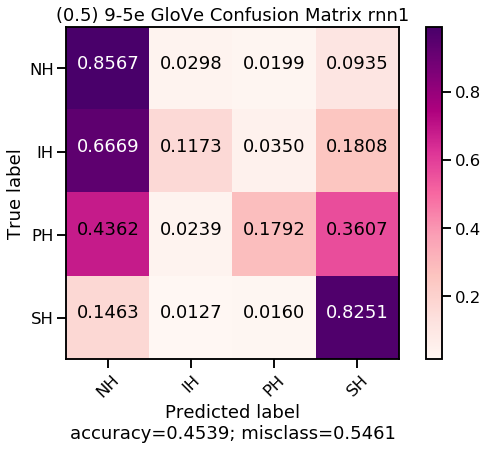

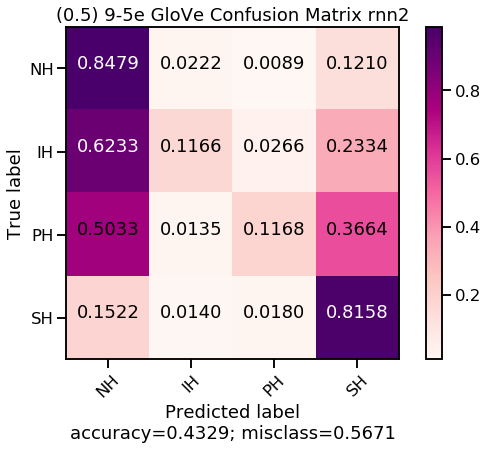

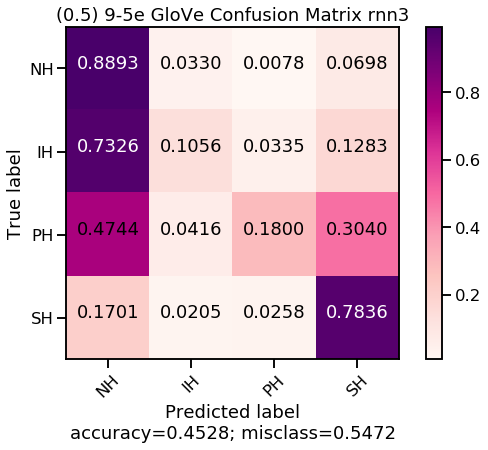

In [22]:
for key in confusions.keys():
    temp=np.sum(confusions[key], axis=0)/5.0
    plot_confusion_matrix(temp, ['NH','IH','PH','SH'], "(0.5) 9-5e GloVe Confusion Matrix "+str(key), cmap='RdPu')

### 0.85

----------------------- Entrenando running  1 -----------------------
Pesos de clases: [1. 1. 1. 1.]


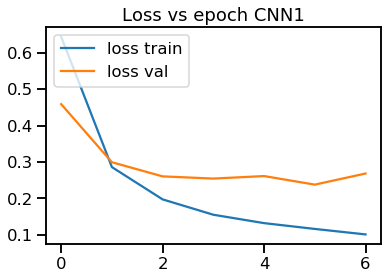

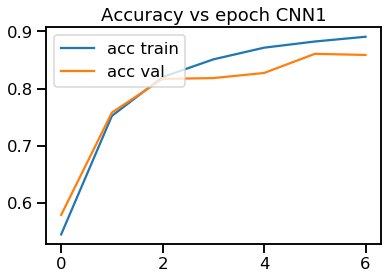


Accuracy sobre Test cnn1 : 0.8115873763542157
F1-score None sobre Test cnn1 : [0.890625   0.09655172 0.06741573 0.70935961]
F1-score macro sobre Test cnn1 : 0.4409880150965849


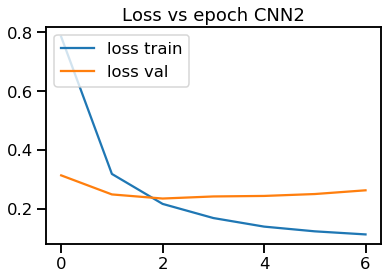

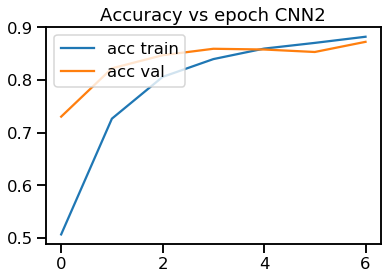


Accuracy sobre Test cnn2 : 0.8318417333961375
F1-score None sobre Test cnn2 : [0.90349319 0.11612903 0.         0.72641509]
F1-score macro sobre Test cnn2 : 0.4365093294587764


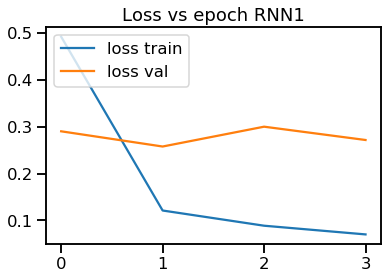

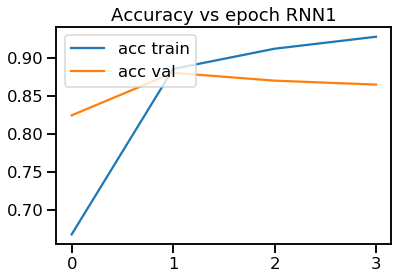


Accuracy sobre Test rnn1 : 0.8356099858690532
F1-score None sobre Test rnn1 : [0.90820073 0.21105528 0.09638554 0.76149425]
F1-score macro sobre Test rnn1 : 0.49428395145456805


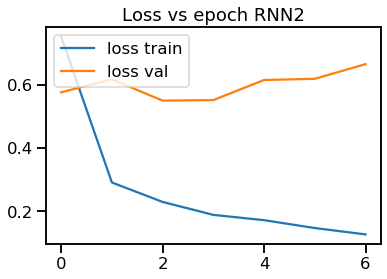

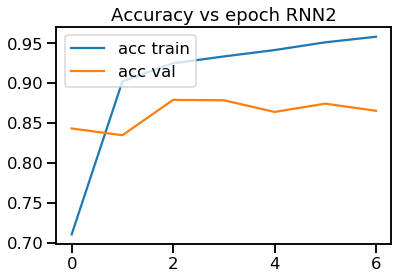


Accuracy sobre Test rnn2 : 0.8247762600094206
F1-score None sobre Test rnn2 : [0.90036232 0.06557377 0.13084112 0.70638298]
F1-score macro sobre Test rnn2 : 0.45079004738777856


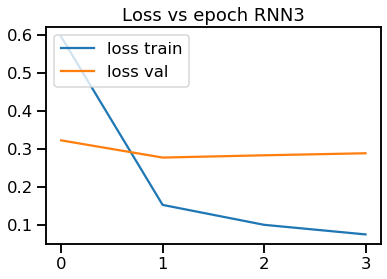

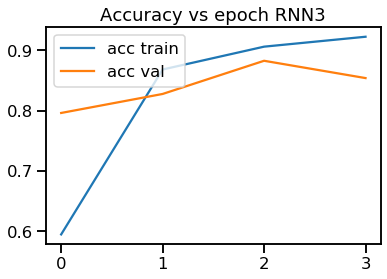


Accuracy sobre Test rnn3 : 0.8181818181818182
F1-score None sobre Test rnn3 : [0.89538951 0.13793103 0.11764706 0.72101033]
F1-score macro sobre Test rnn3 : 0.46799448335278304
----------------------- Entrenando running  2 -----------------------
Pesos de clases: [1. 1. 1. 1.]


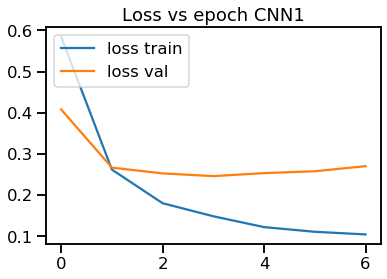

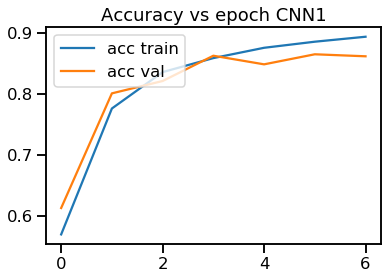


Accuracy sobre Test cnn1 : 0.8266603862458785
F1-score None sobre Test cnn1 : [0.90189125 0.0794702  0.10526316 0.70779221]
F1-score macro sobre Test cnn1 : 0.44860420432938103


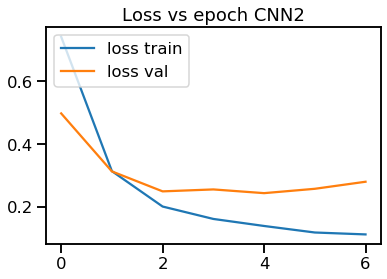

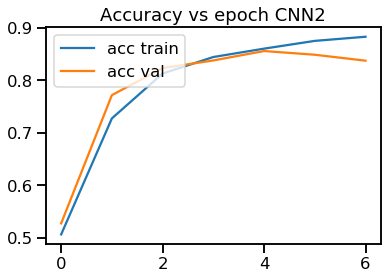


Accuracy sobre Test cnn2 : 0.7932171455487518
F1-score None sobre Test cnn2 : [0.87997493 0.125      0.04651163 0.70872483]
F1-score macro sobre Test cnn2 : 0.44005284740273254


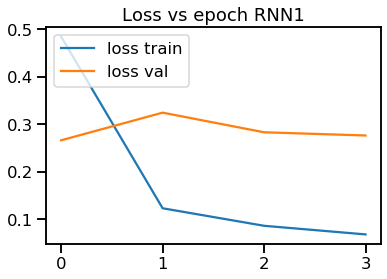

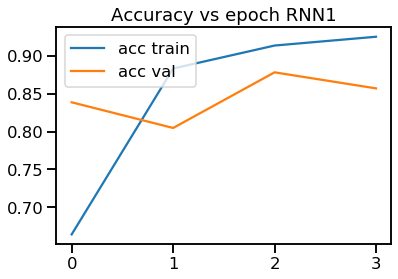


Accuracy sobre Test rnn1 : 0.813942534149788
F1-score None sobre Test rnn1 : [0.8951136  0.22727273 0.14       0.75635277]
F1-score macro sobre Test rnn1 : 0.5046847733975142


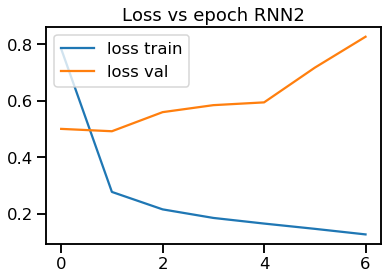

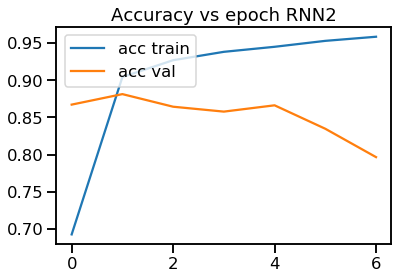


Accuracy sobre Test rnn2 : 0.7461139896373057
F1-score None sobre Test rnn2 : [0.84468665 0.20754717 0.17307692 0.62977867]
F1-score macro sobre Test rnn2 : 0.46377235335544986


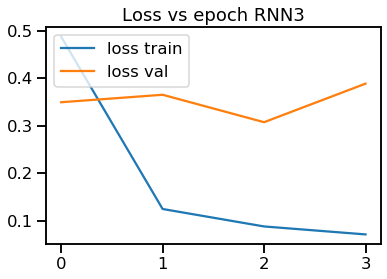

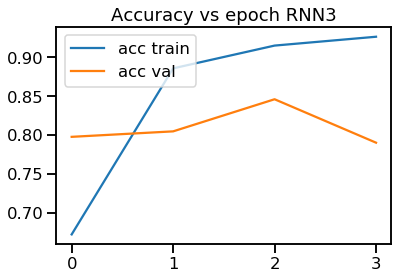


Accuracy sobre Test rnn3 : 0.7461139896373057
F1-score None sobre Test rnn3 : [0.83735144 0.17667845 0.27368421 0.72463768]
F1-score macro sobre Test rnn3 : 0.5030879450098392
----------------------- Entrenando running  3 -----------------------
Pesos de clases: [1. 1. 1. 1.]


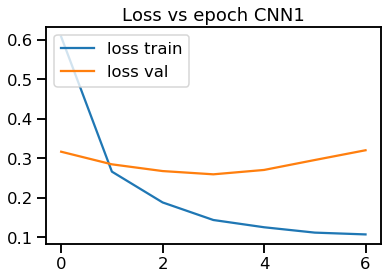

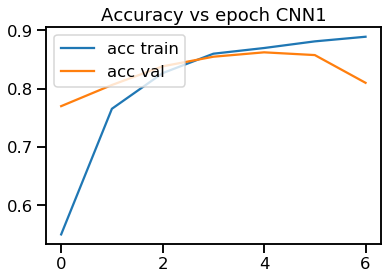


Accuracy sobre Test cnn1 : 0.7687235044747998
F1-score None sobre Test cnn1 : [0.86305419 0.16666667 0.02409639 0.63201663]
F1-score macro sobre Test cnn1 : 0.4214584678543964


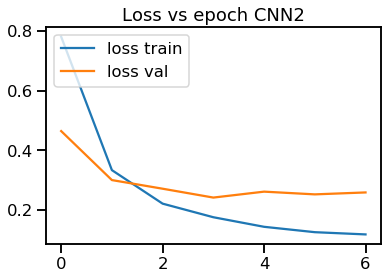

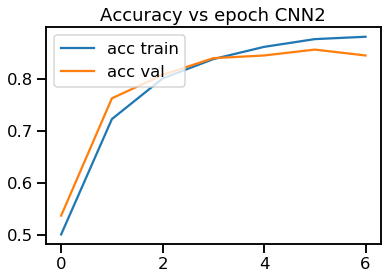


Accuracy sobre Test cnn2 : 0.7870937352802638
F1-score None sobre Test cnn2 : [0.87606973 0.16666667 0.13793103 0.69301713]
F1-score macro sobre Test cnn2 : 0.4684211398838831


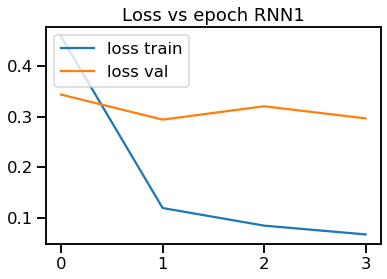

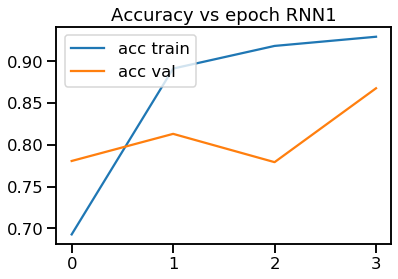


Accuracy sobre Test rnn1 : 0.8459726801695714
F1-score None sobre Test rnn1 : [0.91514965 0.03478261 0.296875   0.7664042 ]
F1-score macro sobre Test rnn1 : 0.5033028633354903


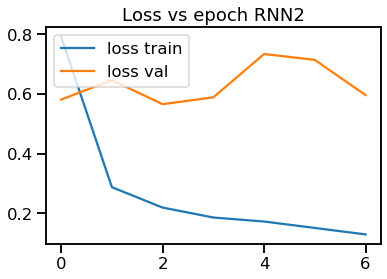

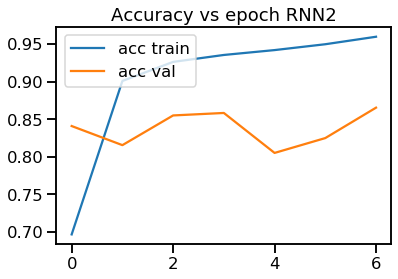


Accuracy sobre Test rnn2 : 0.8313707018370231
F1-score None sobre Test rnn2 : [0.90468894 0.19875776 0.02439024 0.73513514]
F1-score macro sobre Test rnn2 : 0.46574301989354405


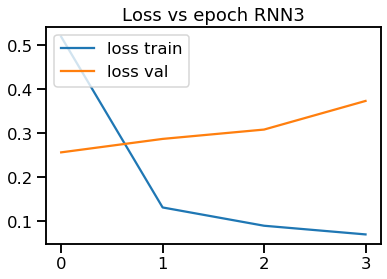

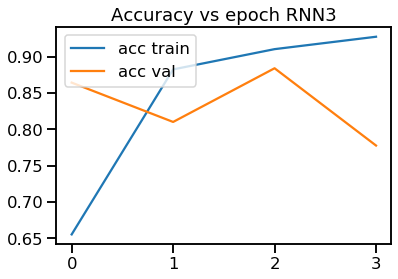


Accuracy sobre Test rnn3 : 0.7216203485633538
F1-score None sobre Test rnn3 : [0.82801664 0.16296296 0.08888889 0.56816183]
F1-score macro sobre Test rnn3 : 0.4120075811945064
----------------------- Entrenando running  4 -----------------------
Pesos de clases: [1. 1. 1. 1.]


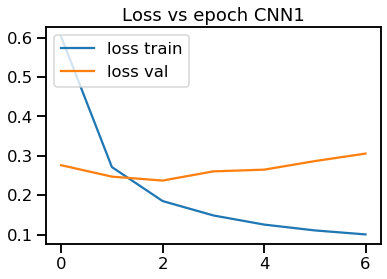

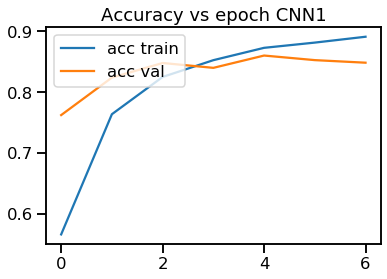


Accuracy sobre Test cnn1 : 0.8186528497409327
F1-score None sobre Test cnn1 : [0.89714994 0.11764706 0.         0.70062112]
F1-score macro sobre Test cnn1 : 0.4288545287195208


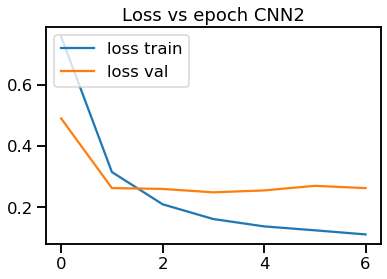

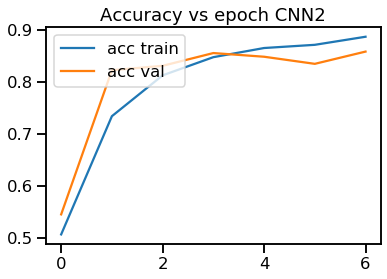


Accuracy sobre Test cnn2 : 0.8290155440414507
F1-score None sobre Test cnn2 : [0.90225118 0.08       0.08988764 0.69512195]
F1-score macro sobre Test cnn2 : 0.44181519412576836


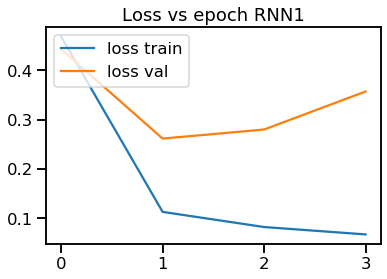

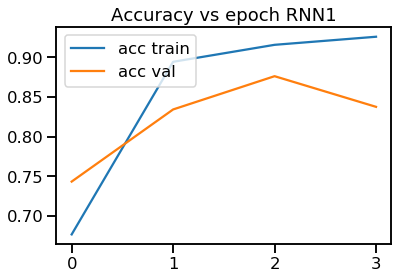


Accuracy sobre Test rnn1 : 0.8101742816768723
F1-score None sobre Test rnn1 : [0.89668246 0.         0.2734375  0.74509804]
F1-score macro sobre Test rnn1 : 0.4788045009176657


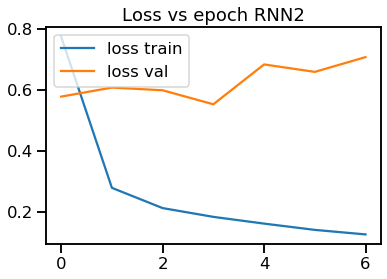

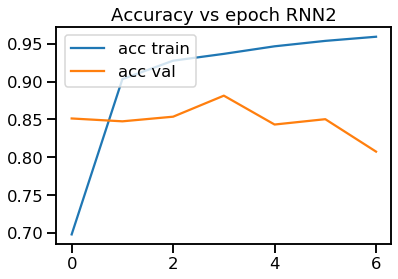


Accuracy sobre Test rnn2 : 0.7555346208195949
F1-score None sobre Test rnn2 : [0.85036256 0.03669725 0.         0.60818713]
F1-score macro sobre Test rnn2 : 0.37381173497224424


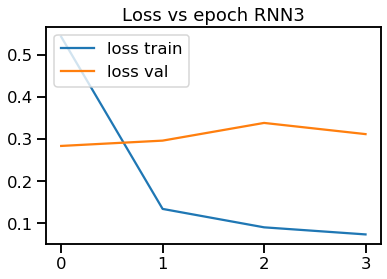

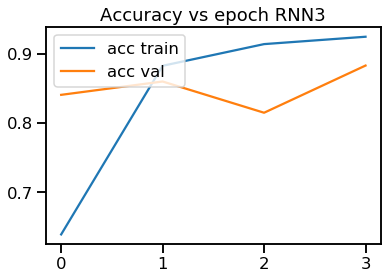


Accuracy sobre Test rnn3 : 0.8615167216203485
F1-score None sobre Test rnn3 : [0.92298648 0.13445378 0.05       0.77209302]
F1-score macro sobre Test rnn3 : 0.46988332082761325
----------------------- Entrenando running  5 -----------------------
Pesos de clases: [1. 1. 1. 1.]


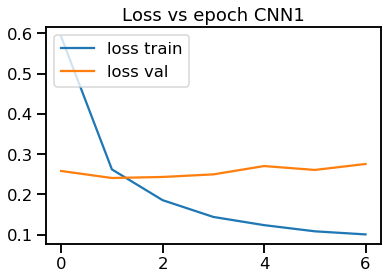

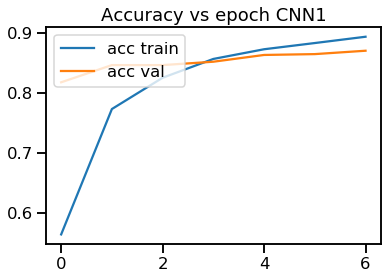


Accuracy sobre Test cnn1 : 0.832312764955252
F1-score None sobre Test cnn1 : [0.90625936 0.08064516 0.06741573 0.70893372]
F1-score macro sobre Test cnn1 : 0.44081349207404996


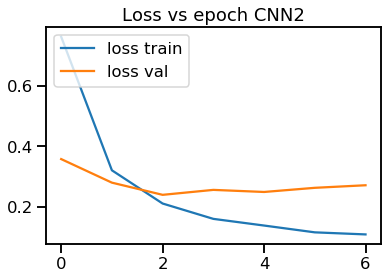

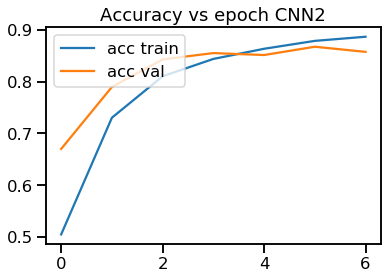


Accuracy sobre Test cnn2 : 0.8266603862458785
F1-score None sobre Test cnn2 : [0.90095847 0.05633803 0.11764706 0.67708333]
F1-score macro sobre Test cnn2 : 0.43800672169488775


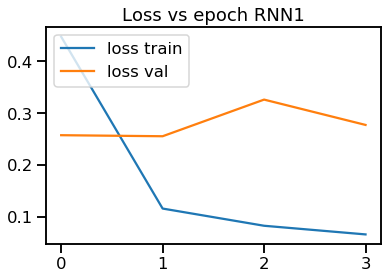

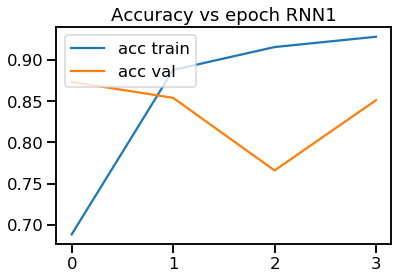


Accuracy sobre Test rnn1 : 0.825247291568535
F1-score None sobre Test rnn1 : [0.89819627 0.25570776 0.04761905 0.75297619]
F1-score macro sobre Test rnn1 : 0.4886248177265152


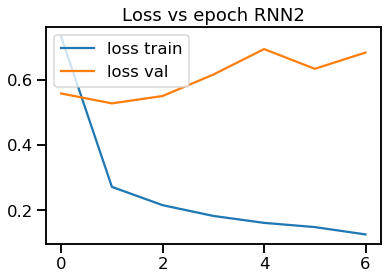

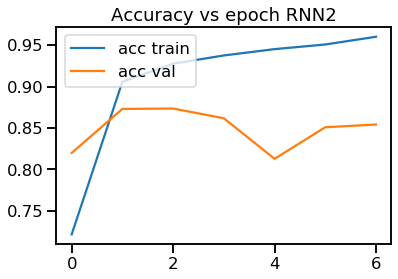


Accuracy sobre Test rnn2 : 0.8191238813000471
F1-score None sobre Test rnn2 : [0.89965828 0.19565217 0.20967742 0.7232267 ]
F1-score macro sobre Test rnn2 : 0.5070536439979304


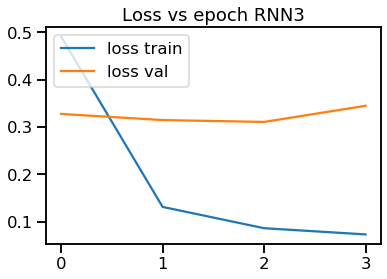

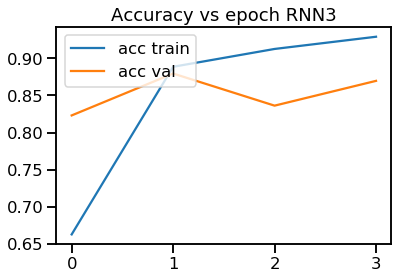


Accuracy sobre Test rnn3 : 0.8238341968911918
F1-score None sobre Test rnn3 : [0.90087282 0.         0.04545455 0.71563981]
F1-score macro sobre Test rnn3 : 0.41549179345904946


In [34]:
prob=0.85 
TOPN=1

fs_macro={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
fs_none={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
accs={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
confusions={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}


for i in range(1,6):
    print ("----------------------- Entrenando running ", i,"-----------------------")
    macro_augmented=np.load('../new_glove_augmented/harassment/Aumento_'+str(i)+'-run_'+str(prob)+'_app1_Top'+str(TOPN)+'.npy', allow_pickle=True)
      
    ids_train=macro_augmented[:,0]
    tws_train=macro_augmented[:,1]
    labels_train=macro_augmented[:,2]
    class_weights= compute_class_weight('balanced', np.unique(labels_train), labels_train)
    print ("Pesos de clases:", class_weights)

    etiq=labels_train.copy()
    sentences = tws_train
    n_labels = np.array(etiq)
    y_train=to_categorical(n_labels,num_classes=4)
    
    input_ids = []
    for sent in sentences:
        encoded_tok=[]
        for wd in sent:
            try: 
                encoded_tok.append(Word2Index_valid[wd])
            except: 
                continue 
        input_ids.append(encoded_tok)
    
    input_ids = pad_sequences(input_ids, maxlen=MAX_LEN, dtype="long", 
                              value=0, truncating="post", padding="post")
    
    shape=np.asarray(input_ids).shape
    x_train=np.zeros((shape[0], shape[1], g_dim))
    j=0
    for in_id in input_ids:
        x_train[j]=M_GLOVE_space[in_id]
        j+=1
        

    ###########################################################
    ############################################################
    ############################################################
    
    cnn1=create_ccn1(x_train.shape[1:])
    trained, hist =train_model(cnn1, x_train, y_train, x_val, y_val, class_weights, e=7, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.85/cnn1_'+str(i)+'-exec_app1_Top_'+str(TOPN)+'_7e.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch CNN1")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch CNN1")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'cnn1')
    fs_macro['cnn1'].append(f1_ma_t)
    fs_none['cnn1'].append(f1_t)
    accs['cnn1'].append(acc_t)
    confusions['cnn1'].append(matriz_t)
    
    cnn2=create_cnn2(x_train.shape[1:])
    trained, hist =train_model(cnn2, x_train, y_train, x_val, y_val, class_weights, e=7, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.85/cnn2_'+str(i)+'-exec_app1_Top_'+str(TOPN)+'_7e.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch CNN2")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch CNN2")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'cnn2')
    fs_macro['cnn2'].append(f1_ma_t)
    fs_none['cnn2'].append(f1_t)
    accs['cnn2'].append(acc_t)
    confusions['cnn2'].append(matriz_t)
    
    rnn1=create_complex_GRU_2(128,64,"adam",x_train.shape[1:])
    trained, hist =train_model(rnn1, x_train, y_train, x_val, y_val, class_weights, e=4, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.85/rnn1_'+str(i)+'-exec_app1_Top_'+str(TOPN)+'_4e.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch RNN1")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch RNN1")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'rnn1')
    fs_macro['rnn1'].append(f1_ma_t)
    fs_none['rnn1'].append(f1_t)
    accs['rnn1'].append(acc_t)
    confusions['rnn1'].append(matriz_t)
    
    rnn2=create_complex_GRU_3(256,128,64,"adam",x_train.shape[1:])
    trained, hist =train_model(rnn2, x_train, y_train, x_val, y_val, class_weights, e=7, BS=32, verb=0, focal=False)
    trained.save('../new_glove_augmented/harassment_baselines/0.85/rnn2_'+str(i)+'-exec_app1_Top_'+str(TOPN)+'_7e.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch RNN2")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch RNN2")
    plt.show()
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'rnn2')
    fs_macro['rnn2'].append(f1_ma_t)
    fs_none['rnn2'].append(f1_t)
    accs['rnn2'].append(acc_t)
    confusions['rnn2'].append(matriz_t)
    
    rnn3=create_complex_GRU_3(256,128,64,"adam",x_train.shape[1:])
    trained, hist =train_model(rnn3, x_train, y_train, x_val, y_val, class_weights, e=4, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.85/rnn3_'+str(i)+'-exec_app1_Top_'+str(TOPN)+'_4e.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch RNN3")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch RNN3")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'rnn3')
    fs_macro['rnn3'].append(f1_ma_t)
    fs_none['rnn3'].append(f1_t)
    accs['rnn3'].append(acc_t)
    confusions['rnn3'].append(matriz_t)


In [35]:
for key in fs_none.keys():
    temp=np.zeros(4)
    for result in fs_none[key]:
        temp+=result
    print ("(0.85) 7-4e app1 F1-score promedio para",key,":" ,temp/5)

print ("")
for key in fs_macro.keys():
    temp=np.sum(fs_macro[key])
    print ("(0.85) 7-4e app1 F1-score macro promedio para",key,":" ,temp/5, "desvest: ",np.std(fs_macro[key]))

print ("")
for key in accs.keys():
    temp=np.sum(accs[key])
    print ("(0.85) 7-4e app1 Accuracy promedio para",key,":" ,temp/5)

(0.85) 7-4e app1 F1-score promedio para cnn1 : [0.89179595 0.10819616 0.0528382  0.69174466]
(0.85) 7-4e app1 F1-score promedio para cnn2 : [0.8925495  0.10882675 0.07839547 0.70007247]
(0.85) 7-4e app1 F1-score promedio para rnn1 : [0.90266854 0.14576367 0.17086342 0.75646509]
(0.85) 7-4e app1 F1-score promedio para rnn2 : [0.87995175 0.14084563 0.10759714 0.68054212]
(0.85) 7-4e app1 F1-score promedio para rnn3 : [0.87692338 0.12240524 0.11513494 0.70030854]

(0.85) 7-4e app1 F1-score macro promedio para cnn1 : 0.4361437416147866 desvest:  0.009688411387117677
(0.85) 7-4e app1 F1-score macro promedio para cnn2 : 0.4449610465132096 desvest:  0.011867240130369836
(0.85) 7-4e app1 F1-score macro promedio para rnn1 : 0.49394018136635065 desvest:  0.009597563885834132
(0.85) 7-4e app1 F1-score macro promedio para rnn2 : 0.45223415992138943 desvest:  0.04352690486538469
(0.85) 7-4e app1 F1-score macro promedio para rnn3 : 0.4536930247687582 desvest:  0.0349385913547948

(0.85) 7-4e app1 Ac

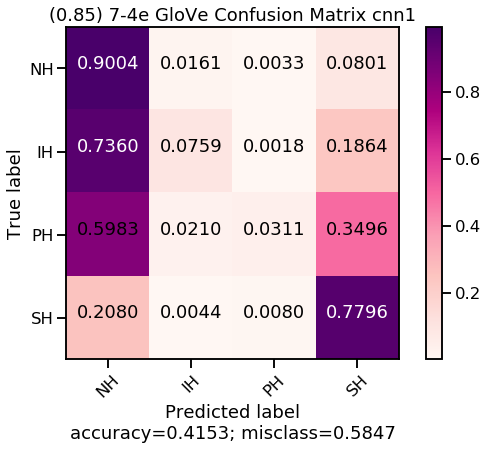

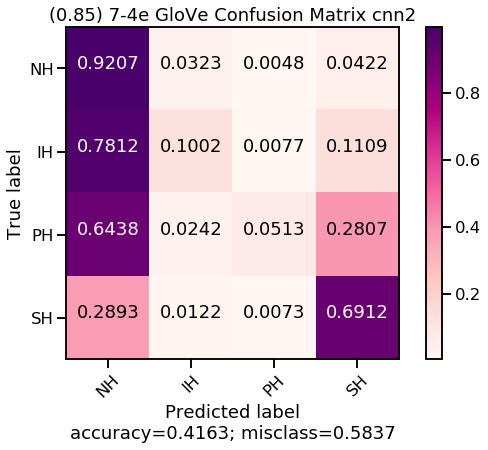

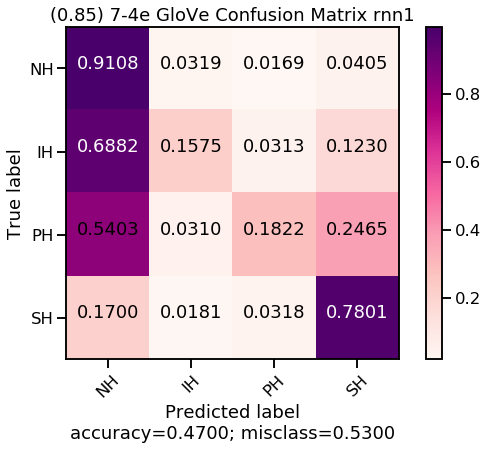

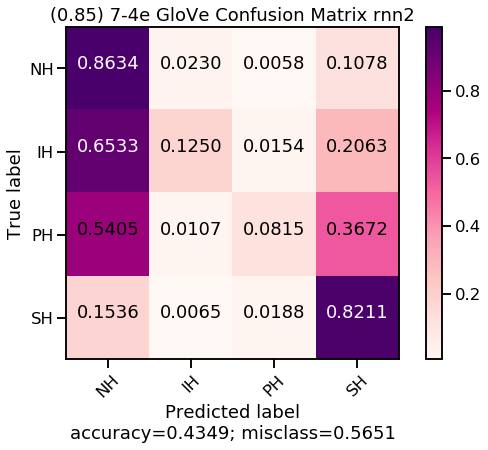

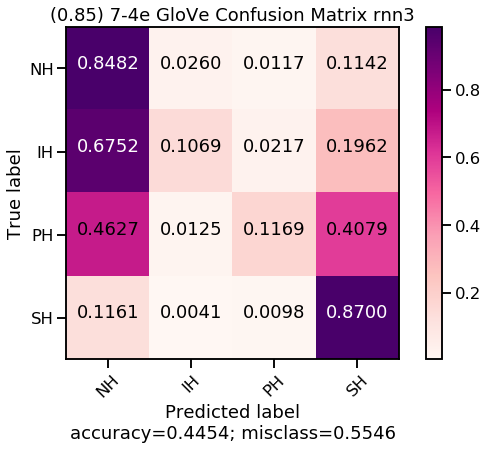

In [36]:
for key in confusions.keys():
    temp=np.sum(confusions[key], axis=0)/5.0
    plot_confusion_matrix(temp, ['NH','IH','PH','SH'], "(0.85) 7-4e GloVe Confusion Matrix "+str(key), cmap='RdPu')

----------------------- Entrenando running  1 -----------------------
Pesos de clases: [1. 1. 1. 1.]


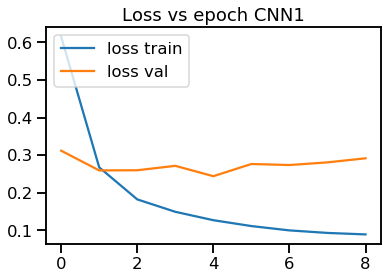

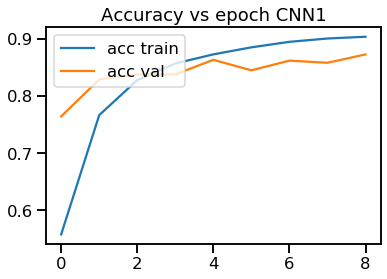


Accuracy sobre Test cnn1 : 0.8407913330193123
F1-score None sobre Test cnn1 : [0.91107829 0.06837607 0.06593407 0.72281776]
F1-score macro sobre Test cnn1 : 0.44205154625846765


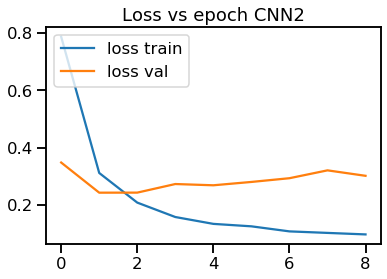

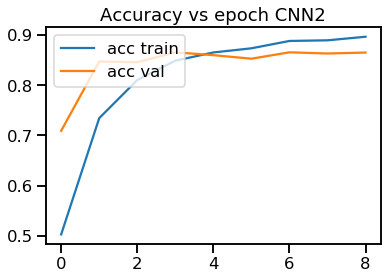


Accuracy sobre Test cnn2 : 0.8280734809232219
F1-score None sobre Test cnn2 : [0.90513595 0.         0.         0.70080863]
F1-score macro sobre Test cnn2 : 0.4014861442496397


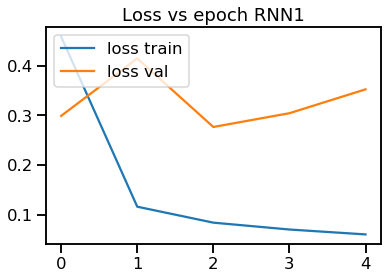

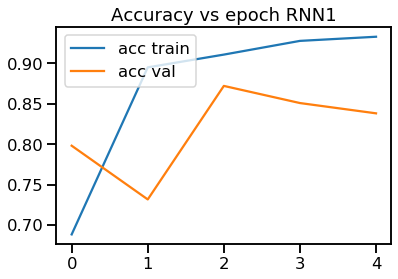


Accuracy sobre Test rnn1 : 0.784267545925577
F1-score None sobre Test rnn1 : [0.87391164 0.         0.07228916 0.64293194]
F1-score macro sobre Test rnn1 : 0.3972831838013198


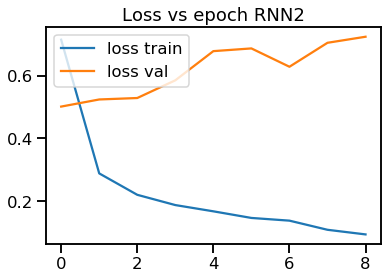

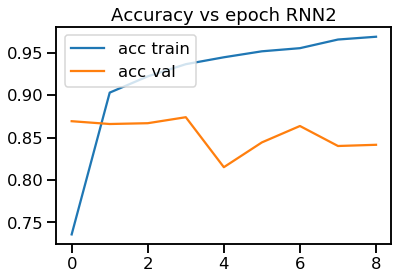


Accuracy sobre Test rnn2 : 0.7993405558172397
F1-score None sobre Test rnn2 : [0.88603531 0.11347518 0.02531646 0.67618002]
F1-score macro sobre Test rnn2 : 0.42525174198916726


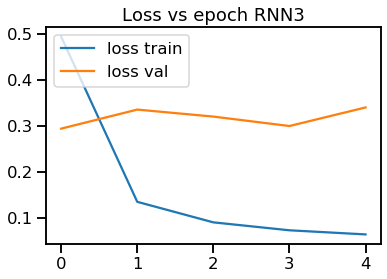

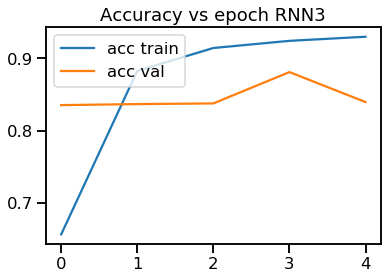


Accuracy sobre Test rnn3 : 0.7936881771078662
F1-score None sobre Test rnn3 : [0.87673892 0.1986755  0.14893617 0.67692308]
F1-score macro sobre Test rnn3 : 0.47531841581703255
----------------------- Entrenando running  2 -----------------------
Pesos de clases: [1. 1. 1. 1.]


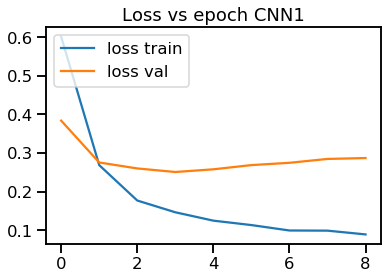

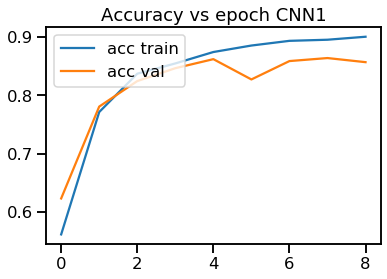


Accuracy sobre Test cnn1 : 0.8224211022138483
F1-score None sobre Test cnn1 : [0.89892473 0.0989011  0.10869565 0.75034868]
F1-score macro sobre Test cnn1 : 0.4642175393231688


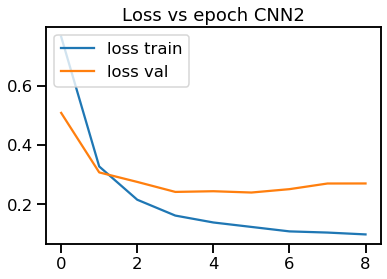

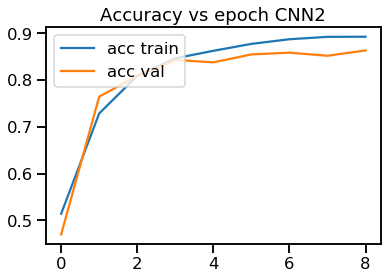


Accuracy sobre Test cnn2 : 0.8144135657089024
F1-score None sobre Test cnn2 : [0.89431397 0.14364641 0.04545455 0.72064777]
F1-score macro sobre Test cnn2 : 0.4510156738588085


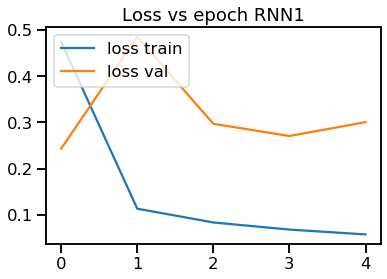

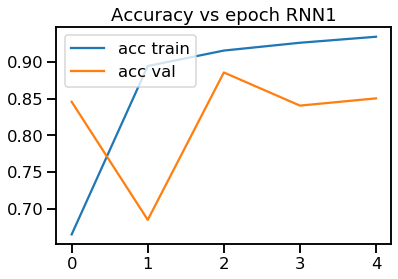


Accuracy sobre Test rnn1 : 0.8092322185586435
F1-score None sobre Test rnn1 : [0.88917197 0.1547619  0.19130435 0.72417983]
F1-score macro sobre Test rnn1 : 0.4898545142502322


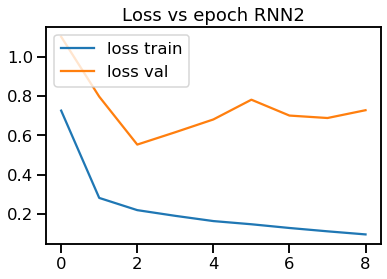

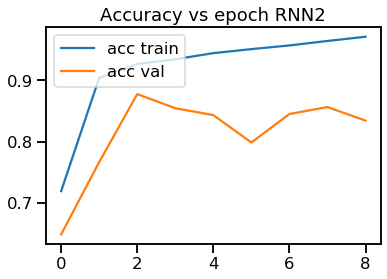


Accuracy sobre Test rnn2 : 0.7889778615167217
F1-score None sobre Test rnn2 : [0.87757039 0.0625     0.07058824 0.64449541]
F1-score macro sobre Test rnn2 : 0.41378850931388056


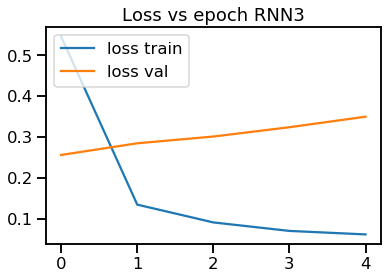

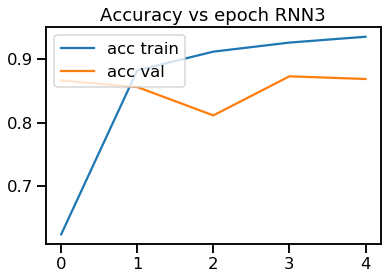


Accuracy sobre Test rnn3 : 0.8337258596325954
F1-score None sobre Test rnn3 : [0.90665856 0.06504065 0.19230769 0.7260274 ]
F1-score macro sobre Test rnn3 : 0.4725085747017356
----------------------- Entrenando running  3 -----------------------
Pesos de clases: [1. 1. 1. 1.]


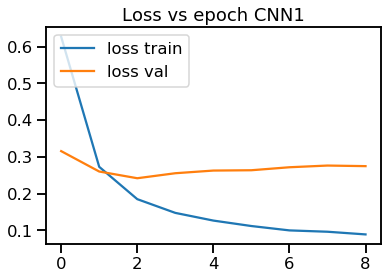

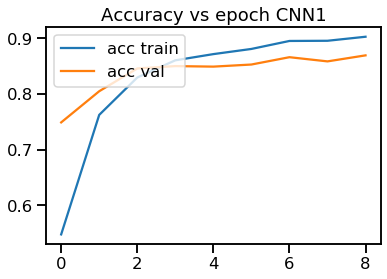


Accuracy sobre Test cnn1 : 0.832312764955252
F1-score None sobre Test cnn1 : [0.90555888 0.03053435 0.04705882 0.7251462 ]
F1-score macro sobre Test cnn1 : 0.4270745624437582


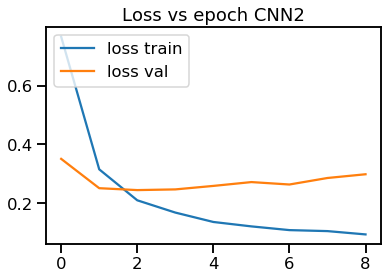

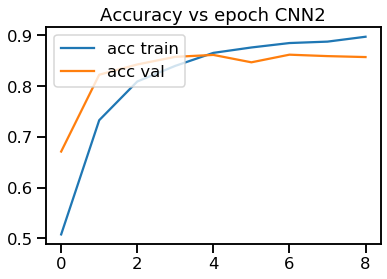


Accuracy sobre Test cnn2 : 0.8247762600094206
F1-score None sobre Test cnn2 : [0.90122735 0.05970149 0.         0.66993464]
F1-score macro sobre Test cnn2 : 0.40771587137141785


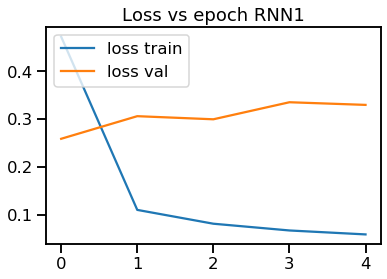

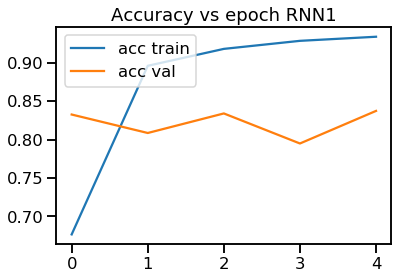


Accuracy sobre Test rnn1 : 0.790390956194065
F1-score None sobre Test rnn1 : [0.88039216 0.05       0.22641509 0.65833333]
F1-score macro sobre Test rnn1 : 0.4537851461339253


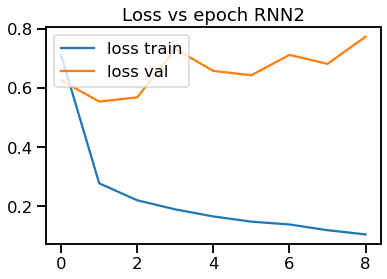

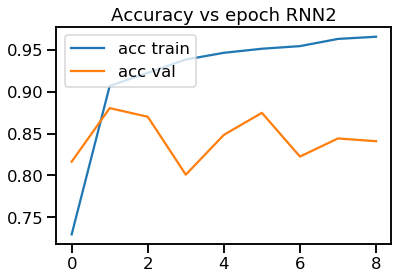


Accuracy sobre Test rnn2 : 0.8012246820536976
F1-score None sobre Test rnn2 : [0.88583307 0.05309735 0.17204301 0.66812705]
F1-score macro sobre Test rnn2 : 0.4447751190979695


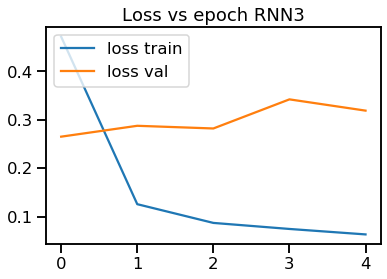

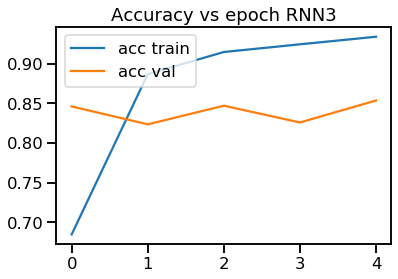


Accuracy sobre Test rnn3 : 0.8205369759773905
F1-score None sobre Test rnn3 : [0.89909403 0.20909091 0.06593407 0.75476839]
F1-score macro sobre Test rnn3 : 0.4822218501275497
----------------------- Entrenando running  4 -----------------------
Pesos de clases: [1. 1. 1. 1.]


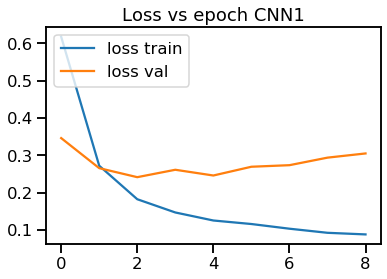

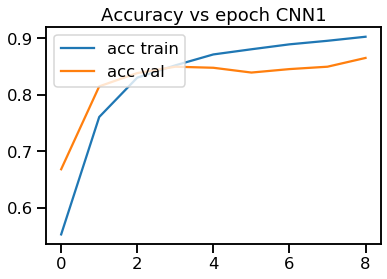


Accuracy sobre Test cnn1 : 0.8271314178049929
F1-score None sobre Test cnn1 : [0.90147783 0.07936508 0.09302326 0.72010178]
F1-score macro sobre Test cnn1 : 0.4484919872154579


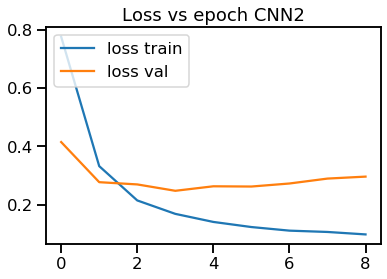

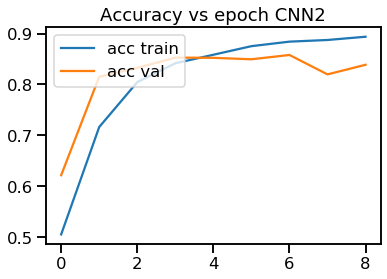


Accuracy sobre Test cnn2 : 0.802637776731041
F1-score None sobre Test cnn2 : [0.88663068 0.08333333 0.11235955 0.6875    ]
F1-score macro sobre Test cnn2 : 0.4424558900750848


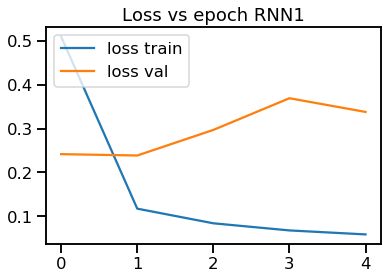

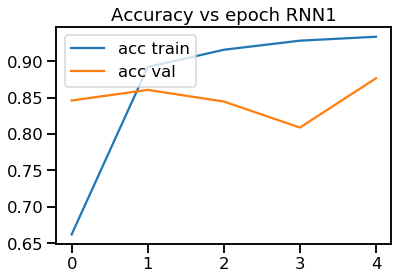


Accuracy sobre Test rnn1 : 0.8563353744700894
F1-score None sobre Test rnn1 : [0.91973446 0.01785714 0.14285714 0.79224377]
F1-score macro sobre Test rnn1 : 0.46817312822363377


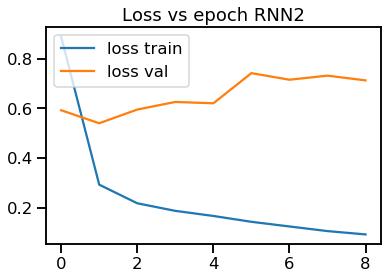

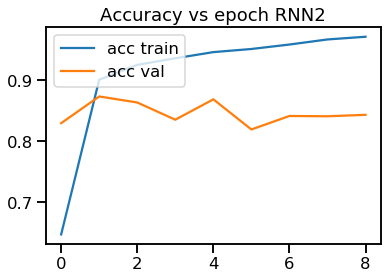


Accuracy sobre Test rnn2 : 0.8059349976448422
F1-score None sobre Test rnn2 : [0.89079755 0.125      0.02469136 0.6776406 ]
F1-score macro sobre Test rnn2 : 0.42953237690087276


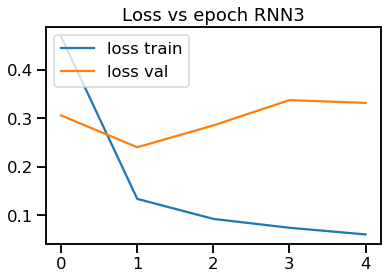

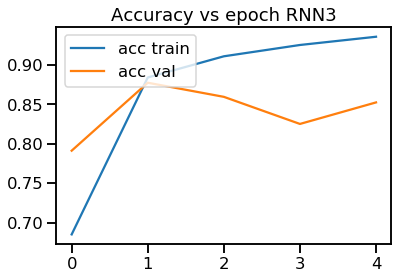


Accuracy sobre Test rnn3 : 0.8162976919453604
F1-score None sobre Test rnn3 : [0.89405847 0.04724409 0.20547945 0.73989899]
F1-score macro sobre Test rnn3 : 0.4716702521551334
----------------------- Entrenando running  5 -----------------------
Pesos de clases: [1. 1. 1. 1.]


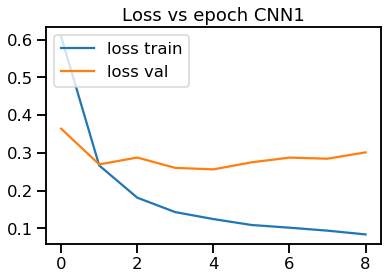

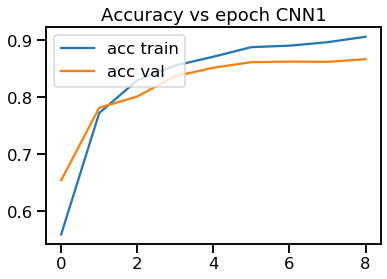


Accuracy sobre Test cnn1 : 0.8308996702779087
F1-score None sobre Test cnn1 : [0.90244639 0.1459854  0.04878049 0.72067039]
F1-score macro sobre Test cnn1 : 0.4544706677861672


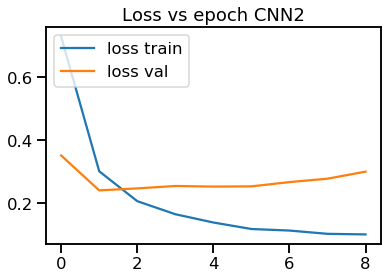

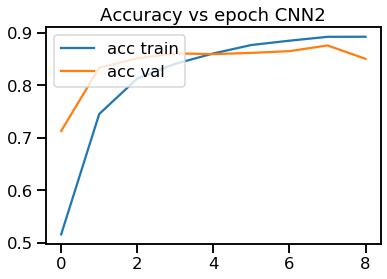


Accuracy sobre Test cnn2 : 0.8120584079133302
F1-score None sobre Test cnn2 : [0.89365731 0.03361345 0.09638554 0.69028571]
F1-score macro sobre Test cnn2 : 0.42848550174402966


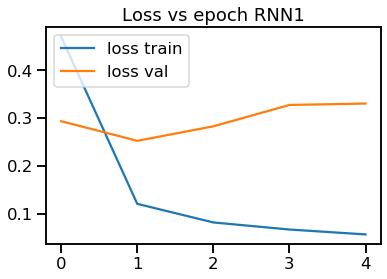

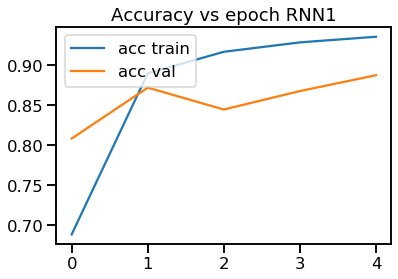


Accuracy sobre Test rnn1 : 0.8563353744700894
F1-score None sobre Test rnn1 : [0.92022707 0.01769912 0.07228916 0.77951636]
F1-score macro sobre Test rnn1 : 0.44743292478787766


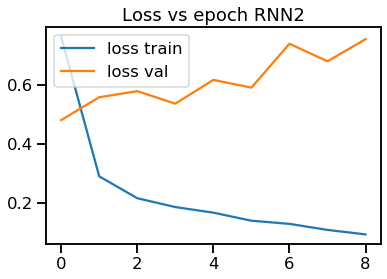

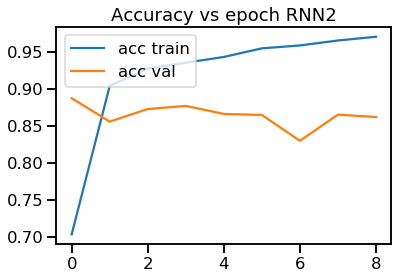


Accuracy sobre Test rnn2 : 0.8417333961375412
F1-score None sobre Test rnn2 : [0.90914369 0.01785714 0.04878049 0.71828666]
F1-score macro sobre Test rnn2 : 0.423516993211972


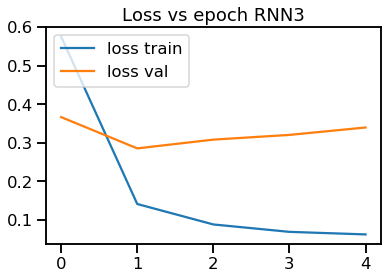

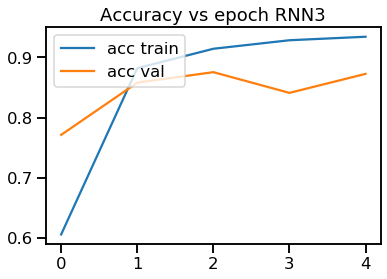


Accuracy sobre Test rnn3 : 0.8459726801695714
F1-score None sobre Test rnn3 : [0.91310929 0.03539823 0.06896552 0.76177658]
F1-score macro sobre Test rnn3 : 0.44481240583430187


In [23]:
prob=0.85 
TOPN=1

fs_macro={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
fs_none={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
accs={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}
confusions={'cnn1':[], 'cnn2':[], 'rnn1':[],'rnn2':[],'rnn3':[]}


for i in range(1,6):
    print ("----------------------- Entrenando running ", i,"-----------------------")
    macro_augmented=np.load('../new_glove_augmented/harassment/Aumento_'+str(i)+'-run_'+str(prob)+'_app1_Top'+str(TOPN)+'.npy', allow_pickle=True)
      
    ids_train=macro_augmented[:,0]
    tws_train=macro_augmented[:,1]
    labels_train=macro_augmented[:,2]
    class_weights= compute_class_weight('balanced', np.unique(labels_train), labels_train)
    print ("Pesos de clases:", class_weights)

    etiq=labels_train.copy()
    sentences = tws_train
    n_labels = np.array(etiq)
    y_train=to_categorical(n_labels,num_classes=4)
    
    input_ids = []
    for sent in sentences:
        encoded_tok=[]
        for wd in sent:
            try: 
                encoded_tok.append(Word2Index_valid[wd])
            except: 
                continue 
        input_ids.append(encoded_tok)
    
    input_ids = pad_sequences(input_ids, maxlen=MAX_LEN, dtype="long", 
                              value=0, truncating="post", padding="post")
    
    shape=np.asarray(input_ids).shape
    x_train=np.zeros((shape[0], shape[1], g_dim))
    j=0
    for in_id in input_ids:
        x_train[j]=M_GLOVE_space[in_id]
        j+=1
        

    ###########################################################
    ############################################################
    ############################################################
    
    cnn1=create_ccn1(x_train.shape[1:])
    trained, hist =train_model(cnn1, x_train, y_train, x_val, y_val, class_weights, e=9, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.85/cnn1_'+str(i)+'-exec_app1_Top_'+str(TOPN)+'_9e.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch CNN1")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch CNN1")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'cnn1')
    fs_macro['cnn1'].append(f1_ma_t)
    fs_none['cnn1'].append(f1_t)
    accs['cnn1'].append(acc_t)
    confusions['cnn1'].append(matriz_t)
    
    cnn2=create_cnn2(x_train.shape[1:])
    trained, hist =train_model(cnn2, x_train, y_train, x_val, y_val, class_weights, e=9, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.85/cnn2_'+str(i)+'-exec_app1_Top_'+str(TOPN)+'_9e.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch CNN2")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch CNN2")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'cnn2')
    fs_macro['cnn2'].append(f1_ma_t)
    fs_none['cnn2'].append(f1_t)
    accs['cnn2'].append(acc_t)
    confusions['cnn2'].append(matriz_t)
    
    rnn1=create_complex_GRU_2(128,64,"adam",x_train.shape[1:])
    trained, hist =train_model(rnn1, x_train, y_train, x_val, y_val, class_weights, e=5, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.85/rnn1_'+str(i)+'-exec_app1_Top_'+str(TOPN)+'_5e.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch RNN1")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch RNN1")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'rnn1')
    fs_macro['rnn1'].append(f1_ma_t)
    fs_none['rnn1'].append(f1_t)
    accs['rnn1'].append(acc_t)
    confusions['rnn1'].append(matriz_t)
    
    rnn2=create_complex_GRU_3(256,128,64,"adam",x_train.shape[1:])
    trained, hist =train_model(rnn2, x_train, y_train, x_val, y_val, class_weights, e=9, BS=32, verb=0, focal=False)
    trained.save('../new_glove_augmented/harassment_baselines/0.85/rnn2_'+str(i)+'-exec_app1_Top_'+str(TOPN)+'_9e.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch RNN2")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch RNN2")
    plt.show()
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'rnn2')
    fs_macro['rnn2'].append(f1_ma_t)
    fs_none['rnn2'].append(f1_t)
    accs['rnn2'].append(acc_t)
    confusions['rnn2'].append(matriz_t)
    
    rnn3=create_complex_GRU_3(256,128,64,"adam",x_train.shape[1:])
    trained, hist =train_model(rnn3, x_train, y_train, x_val, y_val, class_weights, e=5, BS=32, verb=0, focal=True)
    trained.save('../new_glove_augmented/harassment_baselines/0.85/rnn3_'+str(i)+'-exec_app1_Top_'+str(TOPN)+'_5e.h5')
    plt.plot(hist.history['loss'], label='loss train')
    plt.plot(hist.history['val_loss'],label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch RNN3")
    plt.show()

    plt.plot(hist.history['acc'], label='acc train')
    plt.plot(hist.history['val_acc'],label='acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch RNN3")
    plt.show()
    
    f1_ma_t, f1_t, acc_t, matriz_t = predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, 'rnn3')
    fs_macro['rnn3'].append(f1_ma_t)
    fs_none['rnn3'].append(f1_t)
    accs['rnn3'].append(acc_t)
    confusions['rnn3'].append(matriz_t)


In [24]:
for key in fs_none.keys():
    temp=np.zeros(4)
    for result in fs_none[key]:
        temp+=result
    print ("(0.85) app1 F1-score promedio para",key,":" ,temp/5)

print ("")
for key in fs_macro.keys():
    temp=np.sum(fs_macro[key])
    print ("(0.85) app1 F1-score macro promedio para",key,":" ,temp/5, "desvest: ",np.std(fs_macro[key]))

print ("")
for key in accs.keys():
    temp=np.sum(accs[key])
    print ("(0.85) app1 Accuracy promedio para",key,":" ,temp/5)

(0.85) app1 F1-score promedio para cnn1 : [0.90389722 0.0846324  0.07269846 0.72781696]
(0.85) app1 F1-score promedio para cnn2 : [0.89619305 0.06405894 0.05083993 0.69383535]
(0.85) app1 F1-score promedio para rnn1 : [0.89668746 0.04806363 0.14103098 0.71944105]
(0.85) app1 F1-score promedio para rnn2 : [0.889876   0.07438593 0.06828391 0.67694595]
(0.85) app1 F1-score promedio para rnn3 : [0.89793186 0.11108988 0.13632458 0.73187889]

(0.85) app1 F1-score macro promedio para cnn1 : 0.4472612606054039 desvest:  0.01245511568864237
(0.85) app1 F1-score macro promedio para cnn2 : 0.42623181625979606 desvest:  0.019171477591764303
(0.85) app1 F1-score macro promedio para rnn1 : 0.4513057794393978 desvest:  0.0306923427335162
(0.85) app1 F1-score macro promedio para rnn2 : 0.4273729481027724 desvest:  0.010113392791596473
(0.85) app1 F1-score macro promedio para rnn3 : 0.46930629972715066 desvest:  0.012796489019666435

(0.85) app1 Accuracy promedio para cnn1 : 0.8307112576542629
(0.85) a

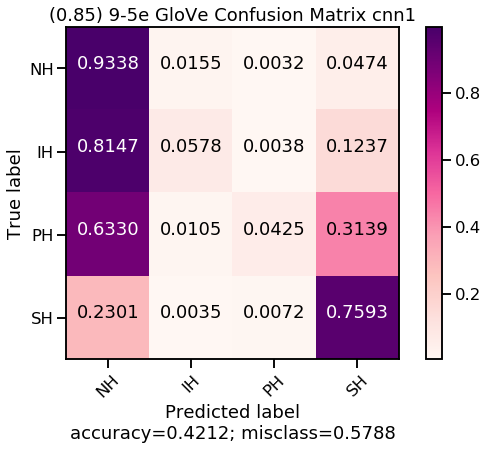

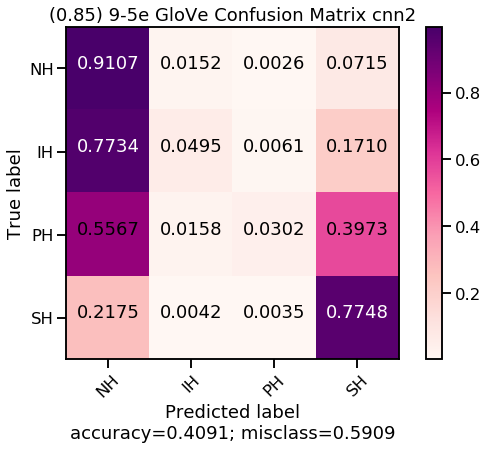

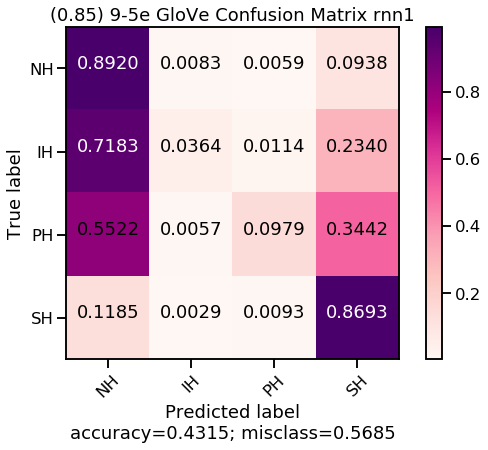

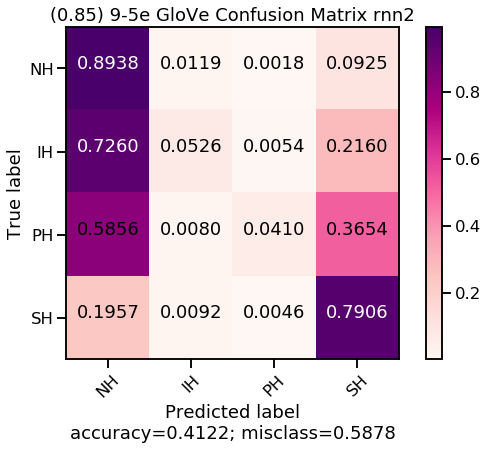

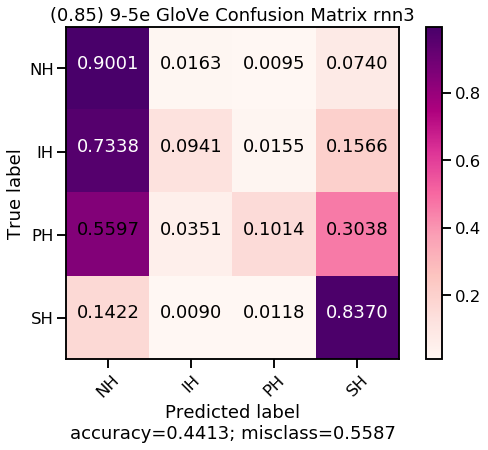

In [25]:
for key in confusions.keys():
    temp=np.sum(confusions[key], axis=0)/5.0
    plot_confusion_matrix(temp, ['NH','IH','PH','SH'], "(0.85) 9-5e GloVe Confusion Matrix "+str(key), cmap='RdPu')

In [26]:
"listo Paper"

'listo Paper'

In [28]:
fs_none

{'cnn1': [array([0.90448113, 0.0620155 , 0.0990099 , 0.71153846]),
  array([0.8974042 , 0.06060606, 0.0952381 , 0.71927555]),
  array([0.90637389, 0.10218978, 0.11764706, 0.73020134]),
  array([0.89198391, 0.09859155, 0.02197802, 0.68030691]),
  array([0.91186839, 0.05172414, 0.075     , 0.75232198])],
 'cnn2': [array([0.86913742, 0.18181818, 0.14953271, 0.69655172]),
  array([0.89764742, 0.13157895, 0.02439024, 0.72801083]),
  array([0.90095063, 0.13333333, 0.04819277, 0.7287234 ]),
  array([0.8940956 , 0.11188811, 0.09090909, 0.71007371]),
  array([0.88648649, 0.18181818, 0.08791209, 0.70886076])],
 'rnn1': [array([0.89620883, 0.13483146, 0.1884058 , 0.7247191 ]),
  array([0.90218712, 0.12716763, 0.04938272, 0.73428571]),
  array([0.86468647, 0.08695652, 0.09195402, 0.61932939]),
  array([0.89737171, 0.18181818, 0.23350254, 0.73255814]),
  array([0.87145682, 0.04615385, 0.06185567, 0.64771574])],
 'rnn2': [array([0.90540137, 0.03703704, 0.02409639, 0.68181818]),
  array([0.77781858, 